<a href="https://colab.research.google.com/github/tiwanaam/mlforhealthdata/blob/main/NEW_FINAL_CHL5230H_F23_28JAN2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Final Project**
<b> Team Number: </b> #19 <br>
<b> Course: </b> CHL5239 Fall 2023<br>
<b> Date: </b> 2024-01 <br>
<br>

<h5> <b> Basic Features of Data Analysis Project:</b></h5>
<b> Dataset: </b> Diabetes Study File 10 (December 14 2017)<br>
<b> Outcome of Interest: </b> Diagnosis of Depression (Binary)<br>
<b> ML Models: </b> Logistic Regression with K-means for feature clustering, random forest, artificial neural network, recurrent nerual network/LSTM

#Section A: Loading, Exploration, and Feature Engineering

## Section A1 - Data Loading and Preliminary Exploration

**Import Libraries**

In [ ]:
#IMPORT LIBRARY (ORGANIZED BY MODULE) - Some may be imported later on as needed
!pip install impyute
!pip install shap

#Import libraries - Basic
from google.colab import files
import io #import direct
import os
import numpy as np
import pandas as pd

#Import Libraries - Data Visualization
import plotly.express as px
import seaborn as sns
import scipy.stats as stats

#Import Libraries - Logistic Lecture
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler
import warnings

#Import the necessary libraries - Misc
import statsmodels.api as sm
from sklearn.discriminant_analysis import StandardScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.metrics import RocCurveDisplay, auc, roc_curve
import re


warnings.filterwarnings('ignore')

**Load the Data**

In [ ]:
import os
# Get the current working directory
current_directory = os.getcwd()

# Print the current working directory
print("Current Working Directory:", current_directory)
data = pd.read_excel(current_directory+'Diabetes Study File 10K Dec 14 2017.xlsx')

    
data.head()
data.shape # Check, Dimensions = 10,000 obs c 43 vars



Specify user (K, S, A): K
Mounted at /content/drive


(10000, 43)

In [ ]:
pd.set_option('display.max_columns', None)
data.head()

,Age_at_Exam,sBP,sBP_Date,BMI,BMI_Date,LDL,LDL_Date,HDL,HDL_Date,A1c,A1c_Date,TG,TG_Date,FBS,FBS_Date,FBS>DM,Total_Cholesterol,Total_Cholesterol_Lab_Date,Diabetes,DM_OnsetDate,Depression,Depression_OnsetDate,HTN,HTN_OnsetDate,OA,OA_OnsetDate,COPD,COPD_Date,Hypertension_Medications,Hypertension_Medications_First_Instance,Corticosteroids,Corticosteroids_first_instance,Sex,leastO(A1c_Date),leastO(DM_OnsetDate),leastO(FBS_Date),LeastOfAll,A1C_BEF_DM,FBS_BEF_DM,Patient_ID,DM_Onset_Revised,DM_Onset_Revised_1YrPrior,DIABETES
0,28,142.0,2011-11-14,25.20,2011-09-09,2.80,2012-01-25,0.87,2012-01-25,3.4,2012-01-25,4.05,2012-01-25,4.9,2012-01-25,1,5.54,2012-01-25,0,NaT,1,2012-06-06,1,2012-03-29,0,NaT,0,NaT,ENALAPRIL AND DIURETICS / ENALAPRIL / LISINOP...,2012-03-29,PREDNISONE,2011-07-14,Male,NaN,NaN,NaN,NaN,NaN,NaN,1003000000214427,NaT,NaT,No
1,60,132.0,2015-02-26,20.90,2015-02-26,1.14,2015-02-19,1.61,2015-02-19,3.6,2015-02-19,0.68,2015-02-19,5.3,2015-02-19,1,3.06,2015-02-19,0,NaT,1,2015-05-08,0,NaT,0,NaT,0,NaT,NaN,NaT,NaN,NaT,Female,NaN,NaN,NaN,NaN,NaN,NaN,1001000000117904,NaT,NaT,No
2,67,102.0,2010-02-03,26.63,2010-02-03,4.00,2010-02-04,1.25,2010-02-04,3.9,2010-02-04,0.93,2010-02-04,4.8,2010-02-04,1,5.67,2010-02-04,0,NaT,0,NaT,0,NaT,1,2010-09-15,1,2012-03-09,NaN,NaT,"HYDROCORTISONE, COMBINATIONS",2010-10-06,Female,NaN,NaN,NaN,NaN,NaN,NaN,4001000000128599,NaT,NaT,No
3,68,158.0,2015-05-28,31.20,2015-05-28,2.62,2015-06-02,NaN,NaT,4.3,2015-06-02,0.91,2015-06-02,4.5,2015-06-02,1,4.73,2015-06-02,0,NaT,1,2015-06-01,0,NaT,0,NaT,0,NaT,NaN,NaT,NaN,NaT,Female,NaN,NaN,NaN,NaN,NaN,NaN,1001000000233648,NaT,NaT,No
4,41,130.0,2014-04-23,33.34,2014-06-09,3.80,2013-11-15,0.87,2013-11-15,4.4,2013-11-15,1.16,2013-11-15,5.1,2014-02-25,1,5.19,2013-11-15,0,NaT,1,2012-10-30,1,2010-12-06,0,NaT,0,NaT,HYDROCHLOROTHIAZIDE / METOPROLOL / PERINDOPRIL,2010-11-15,DEXAMETHASONE AND ANTIINFECTIVES,2014-01-22,Male,NaN,NaN,NaN,NaN,NaN,NaN,9001000000031567,NaT,NaT,No


In [ ]:
# DEPRESSION MEDICATIONS


data_moodmed = pd.read_excel(current_directory+'Diabets Prediction File with Medications String.xlsx')

data_moodmed.head()



In [ ]:
# Display the first few rows of the dataset to ensure it's loaded correctly
data_moodmed.head()

## Section A2 - Subset Data

**Subset Data for Diabetes and Prediabetes Only**

In [ ]:
#Create the 'Diabetes2' variable
data['Diabetes2'] = 0
data.loc[(data['A1c'] >= 5.7) & (data['A1c'] <= 6.4) & (data['Diabetes'] == 0), 'Diabetes2'] = 1
data.loc[(data['A1c'] >= 5.7) & (data['Diabetes'] == 0), 'Diabetes2'] = 1
data.loc[data['Diabetes'] == 1, 'Diabetes2'] = 2

#There are two diabetes variables, will do cross tab to make things match
pd.crosstab(data['DIABETES'], data['Diabetes']) #Match, can drop either

#among those without diabetes, we also want to try to include prediabetic patients - defined by an elevated A1C for this assignment

Diabetes,0,1
DIABETES,,
No,4861,0
Yes,0,5139


In [ ]:
#Delete unnecessary variables from the dataset - NEW LIST

DeleteList=[
       'leastO(A1c_Date)', 'leastO(DM_OnsetDate)', 'leastO(FBS_Date)',
       'LeastOfAll', 'A1C_BEF_DM', 'FBS_BEF_DM',
       'DM_Onset_Revised', 'DM_Onset_Revised_1YrPrior', 'DIABETES']

data = data.drop(DeleteList, axis=1)

In [ ]:
# Only keep observations where Diabetes2 does not equal 0
data = data[data['Diabetes2'] != 0]

In [ ]:
#Check, Dimentions = 7862 obs x 35
data.shape

(7862, 35)

## Section A3 - Merging Datasets

In [ ]:
pd.set_option('display.max_columns', None)
data_moodmed.head()

,All_Medications,Patient_ID_New,Age_at_Exam,sBP,sBP_Date,BMI,BMI_Date,LDL,LDL_Date,HDL,HDL_Date,A1c,A1c_Date,TG,TG_Date,FBS,FBS_Date,Total_Cholesterol,Total_Cholesterol_Lab_Date,Diabetes,Depression,Depression_OnsetDate,HTN,HTN_OnsetDate,OA,OA_OnsetDate,COPD,COPD_Date,Hypertension_Medications,Hypertension_Medications_First_Instance,Corticosteroids,Corticosteroids_first_instance,Sex,DM_Onset_Revised,DM_Onset_Revised_1YrPrior
0,NaN,4001000000255900,65,126.0,2013-06-11,31.000000,2013-06-11,1.66,2013-06-14,1.11,2013-06-14,5.4,2013-06-14,2.28,2013-06-14,5.8,2013-06-14,3.81,2013-06-14,0,0,NaT,0,NaT,0,NaT,0,NaT,NaN,NaT,NaN,NaT,Female,NaN,NaN
1,NaN,4001000000256450,62,135.0,2014-06-19,25.846483,2014-10-17,2.49,2014-05-28,1.37,2014-05-28,5.8,2014-10-25,1.37,2014-05-28,5.4,2014-05-28,4.48,2014-05-28,0,0,NaT,1,2014-01-27,0,NaT,0,NaT,FUROSEMIDE,2014-06-19,NaN,NaT,Female,NaN,NaN
2,NaN,1001000000000050,63,133.0,2012-07-31,30.900000,2011-12-01,1.65,2012-06-01,NaN,NaT,6.1,2012-06-01,0.76,2012-06-01,5.6,2012-06-01,NaN,NaT,0,0,NaT,1,2014-05-21,0,NaT,1,2005-04-08,METOPROLOL / RAMIPRIL / LOSARTAN,2005-01-11,NaN,NaT,Male,NaN,NaN
3,NaN,4001000000259490,51,136.0,2014-01-06,56.710775,2014-01-06,2.80,2014-01-14,1.94,2014-01-14,6.0,2014-01-14,0.99,2014-01-14,6.0,2014-01-14,5.19,2014-01-14,0,0,NaT,0,NaT,0,NaT,0,NaT,NaN,NaT,NaN,NaT,Female,NaN,NaN
4,NaN,4001000000262090,40,123.0,2015-06-12,33.067867,2015-06-12,2.48,2015-06-24,1.17,2015-06-24,5.8,2015-06-24,1.04,2015-06-24,5.2,2015-06-24,4.12,2015-06-24,0,1,2013-06-28,0,NaT,0,NaT,0,NaT,NaN,NaT,NaN,NaT,Female,NaN,NaN


In [ ]:
#Expand medications to single binary variables - ALL MEDICATIONS

#Hypertension medication set  - create
medication_set = set()

#Iterate through the 'Hypertension_Medications' column
for medication in data_moodmed['All_Medications']:
    if isinstance(medication, str):  # Check if it's a string
        # Transformations for specific cases
        # medication = medication.replace("DIURETICS", "DIURETIC")
        # medication = medication.replace(", COMBINATIONS", "").strip()
        # medication = medication.replace("OTHER DIURETICS", "DIURETIC")
        # medication = medication.replace("OTHER DIURETIC", "DIURETIC")

        # Split medications if multiple are listed in a single cell
        medications = medication.split('/')

        # Add each medication to the set
        for med in medications:
            med = med.strip()  # Remove leading/trailing spaces

            # Split medication after "AND" and add each part if it's not already added
            if " AND " in med:
                # Split medication and diuretics
                med_parts = med.split(" AND ")
                for part in med_parts:
                    part = part.strip()  # Remove leading/trailing spaces
                    if part not in medication_set:
                        medication_set.add(part)
            else:
                if med not in medication_set:
                    medication_set.add(med)


# Print the unique hypertension medications set
medication_set = sorted(medication_set)
print(len(medication_set))


In [ ]:
DEPRESSION_MEDICATIONS = [
    'AMITRIPTYLINE',
    'BUPROPION',
    'CITALOPRAM',
    'CLOMIPRAMINE',
    'DESIPRAMINE',
    'DULOXETINE',
    'ESCITALOPRAM',
    'FLUOXETINE',
    'IMIPRAMINE',
    'MIRTAZAPINE',
    'NORTRIPTYLINE',
    'PAROXETINE',
    'SERTRALINE',
    'TRAZODONE',
    'VENLAFAXINE'
]

# Expand medications to single binary variables - DEP Part 2: create vars
for medication in DEPRESSION_MEDICATIONS:
    # Create a new column for the current medication, initialized to 0
    data_moodmed['DERX_' + medication] = 0  # Initialize to 0 by default

    # Check if the medication is not null (not NaN)
    not_null_mask = data_moodmed['All_Medications'].notnull()

    # Apply the .str.contains() and .astype(int) operations only to non-null values
    data_moodmed.loc[not_null_mask, 'DERX_' + medication] = data_moodmed.loc[not_null_mask, 'All_Medications'].str.contains(medication).astype(int)

data_moodmed.shape  # Check, Dimensions = 7862 obs x 80
# 73 columns, 38 new variables - binary (presence/absence)


In [ ]:
data_moodmed.head()




In [ ]:
# Check to see if there's enough observations for each
derx_columns = data_moodmed.filter(like='DERX_')
count_dict = {col: (derx_columns[col] == 1).sum() for col in derx_columns.columns}

print(count_dict)
print(len(count_dict))

# Select keys with counts less than 10
DEP_keys_todrop = [key for key, value in count_dict.items() if value < 10]
print(DEP_keys_todrop)

data_moodmed.drop(columns=[col for col in data_moodmed.columns if col in DEP_keys_todrop], inplace=True)
data_moodmed.shape  

In [ ]:
# Create EVER_DERX column
data_moodmed['EVER_DERX'] = data_moodmed.filter(like='DERX_').any(axis=1).astype(int)

# Check the distribution of EVER_DERX
ever_derx_counts = data_moodmed['EVER_DERX'].value_counts()
print(ever_derx_counts)

data_moodmed.shape  # Check the updated dimensions


0    8102
1     500
Name: EVER_DERX, dtype: int64


(8602, 48)

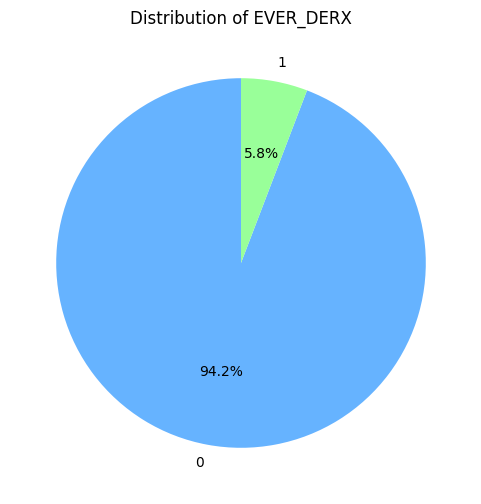

In [ ]:
import matplotlib.pyplot as plt

# Count the values of EVER_DERX
ever_derx_counts = data_moodmed['EVER_DERX'].value_counts()

# Create a pie chart
plt.figure(figsize=(6, 6))
plt.pie(ever_derx_counts, labels=ever_derx_counts.index, autopct='%1.1f%%', startangle=90, colors=['#66b3ff','#99ff99'])
plt.title('Distribution of EVER_DERX')
plt.show()


In [ ]:
data_moodmed.head()

,All_Medications,Patient_ID_New,Age_at_Exam,sBP,sBP_Date,BMI,BMI_Date,LDL,LDL_Date,HDL,HDL_Date,A1c,A1c_Date,TG,TG_Date,FBS,FBS_Date,Total_Cholesterol,Total_Cholesterol_Lab_Date,Diabetes,Depression,Depression_OnsetDate,HTN,HTN_OnsetDate,OA,OA_OnsetDate,COPD,COPD_Date,Hypertension_Medications,Hypertension_Medications_First_Instance,Corticosteroids,Corticosteroids_first_instance,Sex,DM_Onset_Revised,DM_Onset_Revised_1YrPrior,DERX_AMITRIPTYLINE,DERX_BUPROPION,DERX_CITALOPRAM,DERX_DULOXETINE,DERX_ESCITALOPRAM,DERX_FLUOXETINE,DERX_MIRTAZAPINE,DERX_NORTRIPTYLINE,DERX_PAROXETINE,DERX_SERTRALINE,DERX_TRAZODONE,DERX_VENLAFAXINE,EVER_DERX
0,NaN,4001000000255900,65,126.0,2013-06-11,31.000000,2013-06-11,1.66,2013-06-14,1.11,2013-06-14,5.4,2013-06-14,2.28,2013-06-14,5.8,2013-06-14,3.81,2013-06-14,0,0,NaT,0,NaT,0,NaT,0,NaT,NaN,NaT,NaN,NaT,Female,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0
1,NaN,4001000000256450,62,135.0,2014-06-19,25.846483,2014-10-17,2.49,2014-05-28,1.37,2014-05-28,5.8,2014-10-25,1.37,2014-05-28,5.4,2014-05-28,4.48,2014-05-28,0,0,NaT,1,2014-01-27,0,NaT,0,NaT,FUROSEMIDE,2014-06-19,NaN,NaT,Female,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0
2,NaN,1001000000000050,63,133.0,2012-07-31,30.900000,2011-12-01,1.65,2012-06-01,NaN,NaT,6.1,2012-06-01,0.76,2012-06-01,5.6,2012-06-01,NaN,NaT,0,0,NaT,1,2014-05-21,0,NaT,1,2005-04-08,METOPROLOL / RAMIPRIL / LOSARTAN,2005-01-11,NaN,NaT,Male,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0
3,NaN,4001000000259490,51,136.0,2014-01-06,56.710775,2014-01-06,2.80,2014-01-14,1.94,2014-01-14,6.0,2014-01-14,0.99,2014-01-14,6.0,2014-01-14,5.19,2014-01-14,0,0,NaT,0,NaT,0,NaT,0,NaT,NaN,NaT,NaN,NaT,Female,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0
4,NaN,4001000000262090,40,123.0,2015-06-12,33.067867,2015-06-12,2.48,2015-06-24,1.17,2015-06-24,5.8,2015-06-24,1.04,2015-06-24,5.2,2015-06-24,4.12,2015-06-24,0,1,2013-06-28,0,NaT,0,NaT,0,NaT,NaN,NaT,NaN,NaT,Female,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
data.head()

,Age_at_Exam,sBP,sBP_Date,BMI,BMI_Date,LDL,LDL_Date,HDL,HDL_Date,A1c,A1c_Date,TG,TG_Date,FBS,FBS_Date,FBS>DM,Total_Cholesterol,Total_Cholesterol_Lab_Date,Diabetes,DM_OnsetDate,Depression,Depression_OnsetDate,HTN,HTN_OnsetDate,OA,OA_OnsetDate,COPD,COPD_Date,Hypertension_Medications,Hypertension_Medications_First_Instance,Corticosteroids,Corticosteroids_first_instance,Sex,Patient_ID,Diabetes2
2138,75,154.0,2013-06-10,27.000000,2013-06-10,2.35,2013-06-18,1.59,2013-06-18,5.7,2013-06-18,1.31,2013-06-18,5.0,2013-06-18,1,4.54,2013-06-18,0,NaT,0,NaT,1,2009-06-02,1,2009-06-02,0,NaT,AMLODIPINE / LOSARTAN AND DIURETICS,2009-06-02,HYDROCORTISONE,2011-03-03,Female,4001000000288198,1
2139,46,110.0,2015-02-06,21.000000,2015-02-06,2.56,2015-01-08,1.35,2015-01-08,5.7,2015-01-08,0.89,2015-01-08,4.8,2015-01-08,1,4.31,2015-01-08,0,NaT,1,2010-12-09,0,NaT,0,NaT,1,2010-12-10,NaN,NaT,NaN,NaT,Female,4001000000290369,1
2140,57,110.0,2013-07-26,27.475629,2012-08-01,4.20,2013-07-31,2.55,2013-07-31,5.7,2013-07-31,0.71,2013-07-31,4.2,2013-07-31,1,7.07,2013-07-31,0,NaT,0,NaT,1,2011-05-24,1,2011-05-24,0,NaT,HYDROCHLOROTHIAZIDE AND POTASSIUM-SPARING AGENTS,2011-07-09,NaN,NaT,Female,4001000000291156,1
2141,44,110.0,2013-06-19,35.000000,2013-07-12,3.72,2013-07-03,1.15,2013-07-03,5.7,2013-07-03,1.05,2013-07-03,4.7,2013-07-03,1,5.35,2013-07-03,0,NaT,0,NaT,0,NaT,0,NaT,0,NaT,NaN,NaT,NaN,NaT,Male,4001000000291570,1
2142,45,116.0,2012-09-13,29.000000,2012-09-13,3.66,2012-10-01,1.56,2012-10-01,5.7,2012-10-01,0.81,2012-10-01,5.1,2012-10-01,1,NaN,NaT,0,NaT,0,NaT,1,2010-05-06,0,NaT,0,NaT,HYDROCHLOROTHIAZIDE / PERINDOPRIL AND DIURETICS,2010-05-06,NaN,NaT,Female,4001000000288296,1


In [ ]:
# Count the number of matches
matches_count = data['Patient_ID'].isin(data_moodmed['Patient_ID_New']).sum()

print(f"The number of times 'Patient_ID' in data matches with the first occurrence of 'Patient_ID_New' in data_moodmed is: {matches_count}")

The number of times 'Patient_ID' in data matches with the first occurrence of 'Patient_ID_New' in data_moodmed is: 807


In [ ]:
# Assuming data_moodmed and data are your dataframes
merged_df = data.merge(data_moodmed, how='inner', left_on=['Patient_ID', 'sBP_Date'], right_on=['Patient_ID_New', 'sBP_Date'])

# Count the occurrences of matches
match_counts = merged_df['Patient_ID'].value_counts()

# Number of matches with 1 match
num_one_match = sum(match_counts == 1)

# Number of matches with 2 or more matches
num_two_or_more_matches = sum(match_counts >= 2)

# Display the counts
print(f'Number of matches with 1 match: {num_one_match}')
print(f'Number of matches with 2 or more matches: {num_two_or_more_matches}')

#there will be around 681 cases with corresponding mood med data among eligible patients.

Number of matches with 1 match: 681
Number of matches with 2 or more matches: 6


In [ ]:
data.shape

(7862, 35)

In [ ]:
data_moodmed.shape

(8602, 48)

In [ ]:


# Assuming data_moodmed and data are your dataframes
columns_to_merge = ['Patient_ID_New', 'sBP_Date', 'Sex', 'BMI', 'DERX_AMITRIPTYLINE', 'DERX_BUPROPION', 'DERX_CITALOPRAM',
                     'DERX_DULOXETINE', 'DERX_ESCITALOPRAM', 'DERX_FLUOXETINE', 'DERX_MIRTAZAPINE', 'DERX_NORTRIPTYLINE',
                     'DERX_PAROXETINE', 'DERX_SERTRALINE', 'DERX_TRAZODONE', 'DERX_VENLAFAXINE', 'EVER_DERX']

# Select and rename columns with prefix MM
data_moodmed_selected = data_moodmed[columns_to_merge].rename(columns={'Sex': 'MM_Sex', 'BMI': 'MM_BMI'})

# Merge with left join
merged_df = data.merge(data_moodmed_selected, how='left', left_on=['Patient_ID', 'sBP_Date'], right_on=['Patient_ID_New', 'sBP_Date'])

merged_df.shape

(7862, 51)

In [ ]:
merged_df.head()

,Age_at_Exam,sBP,sBP_Date,BMI,BMI_Date,LDL,LDL_Date,HDL,HDL_Date,A1c,A1c_Date,TG,TG_Date,FBS,FBS_Date,FBS>DM,Total_Cholesterol,Total_Cholesterol_Lab_Date,Diabetes,DM_OnsetDate,Depression,Depression_OnsetDate,HTN,HTN_OnsetDate,OA,OA_OnsetDate,COPD,COPD_Date,Hypertension_Medications,Hypertension_Medications_First_Instance,Corticosteroids,Corticosteroids_first_instance,Sex,Patient_ID,Diabetes2,Patient_ID_New,MM_Sex,MM_BMI,DERX_AMITRIPTYLINE,DERX_BUPROPION,DERX_CITALOPRAM,DERX_DULOXETINE,DERX_ESCITALOPRAM,DERX_FLUOXETINE,DERX_MIRTAZAPINE,DERX_NORTRIPTYLINE,DERX_PAROXETINE,DERX_SERTRALINE,DERX_TRAZODONE,DERX_VENLAFAXINE,EVER_DERX
0,75,154.0,2013-06-10,27.000000,2013-06-10,2.35,2013-06-18,1.59,2013-06-18,5.7,2013-06-18,1.31,2013-06-18,5.0,2013-06-18,1,4.54,2013-06-18,0,NaT,0,NaT,1,2009-06-02,1,2009-06-02,0,NaT,AMLODIPINE / LOSARTAN AND DIURETICS,2009-06-02,HYDROCORTISONE,2011-03-03,Female,4001000000288198,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,46,110.0,2015-02-06,21.000000,2015-02-06,2.56,2015-01-08,1.35,2015-01-08,5.7,2015-01-08,0.89,2015-01-08,4.8,2015-01-08,1,4.31,2015-01-08,0,NaT,1,2010-12-09,0,NaT,0,NaT,1,2010-12-10,NaN,NaT,NaN,NaT,Female,4001000000290369,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,57,110.0,2013-07-26,27.475629,2012-08-01,4.20,2013-07-31,2.55,2013-07-31,5.7,2013-07-31,0.71,2013-07-31,4.2,2013-07-31,1,7.07,2013-07-31,0,NaT,0,NaT,1,2011-05-24,1,2011-05-24,0,NaT,HYDROCHLOROTHIAZIDE AND POTASSIUM-SPARING AGENTS,2011-07-09,NaN,NaT,Female,4001000000291156,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,44,110.0,2013-06-19,35.000000,2013-07-12,3.72,2013-07-03,1.15,2013-07-03,5.7,2013-07-03,1.05,2013-07-03,4.7,2013-07-03,1,5.35,2013-07-03,0,NaT,0,NaT,0,NaT,0,NaT,0,NaT,NaN,NaT,NaN,NaT,Male,4001000000291570,1,4.001000e+15,Male,35.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,45,116.0,2012-09-13,29.000000,2012-09-13,3.66,2012-10-01,1.56,2012-10-01,5.7,2012-10-01,0.81,2012-10-01,5.1,2012-10-01,1,NaN,NaT,0,NaT,0,NaT,1,2010-05-06,0,NaT,0,NaT,HYDROCHLOROTHIAZIDE / PERINDOPRIL AND DIURETICS,2010-05-06,NaN,NaT,Female,4001000000288296,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Assuming merged_df is your DataFrame

# Count the number of matches for MM_Sex and Sex
matches_sex_count = merged_df['MM_Sex'].isin(merged_df['Sex']).sum()

# Count the number of matches for MM_BMI and BMI
matches_bmi_count = merged_df['MM_BMI'].isin(merged_df['BMI']).sum()

print(f"The number of matches for MM_Sex and Sex is: {matches_sex_count}")
print(f"The number of matches for MM_BMI and BMI is: {matches_bmi_count}")
#match check

The number of matches for MM_Sex and Sex is: 694
The number of matches for MM_BMI and BMI is: 694


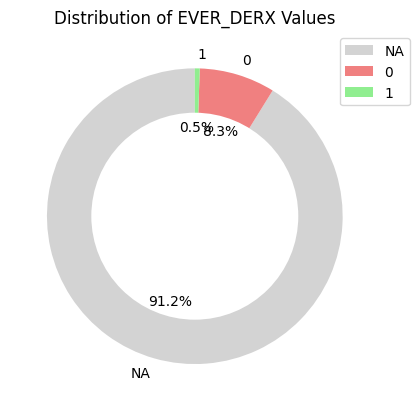

In [ ]:
# Count the occurrences of NA, 0, and 1 in the EVER_DERX variable
ever_derx_counts = merged_df['EVER_DERX'].value_counts(dropna=False)

# Plot a pie chart with counts and percentages
labels = ['NA', '0', '1']
colors = ['lightgray', 'lightcoral', 'lightgreen']

fig, ax = plt.subplots()
ax.pie(ever_derx_counts, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90, wedgeprops=dict(width=0.4))

# Draw a circle at the center to make it a donut chart
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Add a legend
plt.legend(labels, loc='upper right', bbox_to_anchor=(1.1, 1))

plt.title('Distribution of EVER_DERX Values')
plt.show()

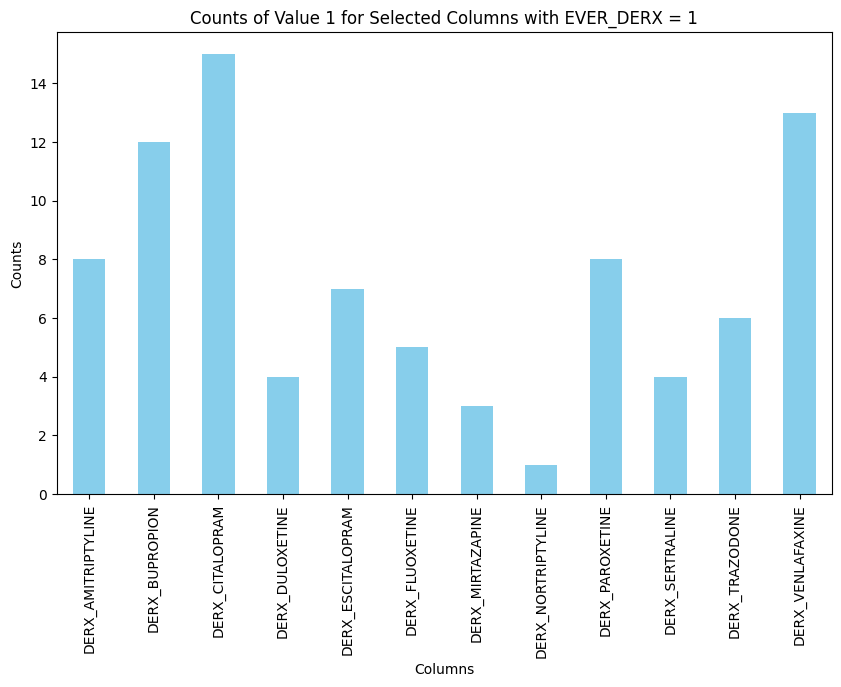

In [ ]:


# Assuming merged_df is your DataFrame
# Replace 'YourDataset.csv' with the actual path or URL to your dataset

# Filter the DataFrame based on EVER_DERX variable
filtered_df = merged_df[merged_df['EVER_DERX'] == 1]

# Select the columns you are interested in
columns_of_interest = ['DERX_AMITRIPTYLINE', 'DERX_BUPROPION', 'DERX_CITALOPRAM', 'DERX_DULOXETINE', 'DERX_ESCITALOPRAM',
                         'DERX_FLUOXETINE', 'DERX_MIRTAZAPINE', 'DERX_NORTRIPTYLINE', 'DERX_PAROXETINE', 'DERX_SERTRALINE',
                         'DERX_TRAZODONE', 'DERX_VENLAFAXINE']

# Create a bar graph
filtered_df[columns_of_interest].sum().plot(kind='bar', figsize=(10, 6), color='skyblue')
plt.title('Counts of Value 1 for Selected Columns with EVER_DERX = 1')
plt.xlabel('Columns')
plt.ylabel('Counts')
plt.show()


In [ ]:
# Drop the specified columns
merged_df = merged_df.drop(columns=columns_of_interest)

In [ ]:
# Drop additional check columns
merged_df = merged_df.drop(columns=['Patient_ID_New', 'MM_Sex', 'MM_BMI'])

In [ ]:
# Create a copy of the modified DataFrame
modified_df = merged_df.copy()
data = modified_df

## Section A4 - Feature Engineering

**Feature Engineering** - Section A3-1 - Hypertension Medications

In [ ]:
#Expand medications to single binary variables - HTN Part 1: get names

#Hypertension medication set  - create
hypertension_medication_set = set()

#Iterate through the 'Hypertension_Medications' column
for medication in data['Hypertension_Medications']:
    if isinstance(medication, str):  # Check if it's a string
        # Transformations for specific cases
        medication = medication.replace("DIURETICS", "DIURETIC")
        medication = medication.replace(", COMBINATIONS", "").strip()
        medication = medication.replace("OTHER DIURETICS", "DIURETIC")
        medication = medication.replace("OTHER DIURETIC", "DIURETIC")

        # Split medications if multiple are listed in a single cell
        medications = medication.split('/')

        # Add each medication to the set
        for med in medications:
            med = med.strip()  # Remove leading/trailing spaces

            # Split medication after "AND" and add each part if it's not already added
            if " AND " in med:
                # Split medication and diuretics
                med_parts = med.split(" AND ")
                for part in med_parts:
                    part = part.strip()  # Remove leading/trailing spaces
                    if part not in hypertension_medication_set:
                        hypertension_medication_set.add(part)
            else:
                if med not in hypertension_medication_set:
                    hypertension_medication_set.add(med)


# Print the unique hypertension medications set
hypertension_medication_set = sorted(hypertension_medication_set)
print(hypertension_medication_set)
print(len(hypertension_medication_set))


['ACEBUTOLOL', 'ALISKIREN', 'AMILORIDE', 'AMLODIPINE', 'ATENOLOL', 'BENAZEPRIL', 'BETAXOLOL', 'BISOPROLOL', 'CANDESARTAN', 'CAPTOPRIL', 'CARVEDILOL', 'CILAZAPRIL', 'DILTIAZEM', 'DIURETIC', 'DOXAZOSIN', 'ENALAPRIL', 'EPLERENONE', 'EPROSARTAN', 'ETACRYNIC ACID', 'FELODIPINE', 'FOSINOPRIL', 'FUROSEMIDE', 'HYDROCHLOROTHIAZIDE', 'IRBESARTAN', 'LABETALOL', 'LISINOPRIL', 'LOSARTAN', 'METOPROLOL', 'NADOLOL', 'NIFEDIPINE', 'OLMESARTAN MEDOXOMIL', 'PERINDOPRIL', 'PINDOLOL', 'POTASSIUM-SPARING AGENTS', 'PRAZOSIN', 'PROPRANOLOL', 'QUINAPRIL', 'RAMIPRIL', 'SOTALOL', 'SPIRONOLACTONE', 'TELMISARTAN', 'TIMOLOL', 'TRANDOLAPRIL', 'TRIAMTERENE', 'VALSARTAN', 'VERAPAMIL']
46


In [ ]:
#Expand medications to single binary variables - HTN Part 2: create vars

for medication in hypertension_medication_set:
    # Create a new column for the current medication, initialized to 0
    data['HTRX_' + medication] = 0  # Initialize to 0 by default

    # Check if the medication is not null (not NaN)
    not_null_mask = data['Hypertension_Medications'].notnull()

    # Apply the .str.contains() and .astype(int) operations only to non-null values
    data.loc[not_null_mask, 'HTRX_' + medication] = data.loc[not_null_mask, 'Hypertension_Medications'].str.contains(medication).astype(int)

data.shape #Check, Dimentions = 7862 obs x 80
data.head()

#check to see if theres enough observations for each
htrx_columns = data.filter(like='HTRX_')
count_dict = {col: (htrx_columns[col] == 1).sum() for col in htrx_columns.columns}

print(count_dict)
print(len(count_dict))

# Select keys with counts less than 10
HTN_keys_todrop = [key for key, value in count_dict.items() if value < 10]
print(HTN_keys_todrop)

data.drop(columns=[col for col in data.columns if col in HTN_keys_todrop], inplace=True)
data.shape #73 columns, 38 new variables - binary (presence/absence)

{'HTRX_ACEBUTOLOL': 53, 'HTRX_ALISKIREN': 37, 'HTRX_AMILORIDE': 1, 'HTRX_AMLODIPINE': 1857, 'HTRX_ATENOLOL': 695, 'HTRX_BENAZEPRIL': 13, 'HTRX_BETAXOLOL': 5, 'HTRX_BISOPROLOL': 627, 'HTRX_CANDESARTAN': 308, 'HTRX_CAPTOPRIL': 3, 'HTRX_CARVEDILOL': 95, 'HTRX_CILAZAPRIL': 54, 'HTRX_DILTIAZEM': 500, 'HTRX_DIURETIC': 1373, 'HTRX_DOXAZOSIN': 85, 'HTRX_ENALAPRIL': 276, 'HTRX_EPLERENONE': 9, 'HTRX_EPROSARTAN': 19, 'HTRX_ETACRYNIC ACID': 2, 'HTRX_FELODIPINE': 72, 'HTRX_FOSINOPRIL': 74, 'HTRX_FUROSEMIDE': 829, 'HTRX_HYDROCHLOROTHIAZIDE': 2246, 'HTRX_IRBESARTAN': 671, 'HTRX_LABETALOL': 40, 'HTRX_LISINOPRIL': 292, 'HTRX_LOSARTAN': 409, 'HTRX_METOPROLOL': 1029, 'HTRX_NADOLOL': 45, 'HTRX_NIFEDIPINE': 477, 'HTRX_OLMESARTAN MEDOXOMIL': 147, 'HTRX_PERINDOPRIL': 972, 'HTRX_PINDOLOL': 9, 'HTRX_POTASSIUM-SPARING AGENTS': 176, 'HTRX_PRAZOSIN': 9, 'HTRX_PROPRANOLOL': 87, 'HTRX_QUINAPRIL': 126, 'HTRX_RAMIPRIL': 2324, 'HTRX_SOTALOL': 50, 'HTRX_SPIRONOLACTONE': 240, 'HTRX_TELMISARTAN': 380, 'HTRX_TIMOLOL': 82,

(7862, 74)

**Feature Engineering** - Section A3-2 - Corticosteroid Medications

In [ ]:
#Expand medications to single binary variables - CST Part 1: get names

# Corticosteroids medication set - create
corticosteroids_medication_set = set()

# Iterate through the 'Corticosteroids' column
for medication in data['Corticosteroids']:
    if isinstance(medication, str):  # Check if string
        # Transformations for specific cases
        medication = medication.replace(", COMBINATIONS", "").strip()
        medication = medication.replace(",", "/")
        medication = medication.replace("AND", "/")
        # Split medications if multl are listed in a single cell
        medications = medication.split('/')

        # Add each medication to the set
        for med in medications:
            med = med.strip()  # Remove leading/trailing spaces
            if med not in corticosteroids_medication_set:
                corticosteroids_medication_set.add(med)

# Print the unique corticosteroids medications set
corticosteroids_medication_set = sorted(corticosteroids_medication_set)
print(corticosteroids_medication_set)
print(len(corticosteroids_medication_set))


['ANTIBIOTICS', 'ANTIINFECTIVES', 'CORTISONE', 'DEXAMETHASONE', 'HYDROCORTISONE', 'METHYLPREDNISOLONE', 'PREDNISOLONE', 'PREDNISONE']
8


In [ ]:
#Expand medications to single binary variables - CST Part 1: create vars

for medication in corticosteroids_medication_set:
    # Create a new column for the current medication, initialized to 0
    data['CSRX_' + medication] = 0  # Initialize to 0 by default

    # Check if the medication is not null (not NaN)
    not_null_mask = data['Corticosteroids'].notnull()

    # Use regular expressions with word boundaries to match complete words
    pattern = r'\b' + re.escape(medication) + r'\b'
    data.loc[not_null_mask, 'CSRX_' + medication] = data.loc[not_null_mask, 'Corticosteroids'].str.contains(pattern, case=False, regex=True).astype(int)

# Check DataFrame
data.shape
data.head()

# Check to see if there are enough observations for each corticosteroid variable
csrx_columns = data.filter(like='CSRX')
count_dict = {col: (csrx_columns[col] == 1).sum() for col in csrx_columns.columns}

print(count_dict)
print(len(count_dict))

# Select keys with counts less than 10 for corticosteroids
CSRX_keys_todrop = [key for key, value in count_dict.items() if value < 10]
print(CSRX_keys_todrop) #all above 10, but will keep code below in case new data comes in

# Drop columns with counts less than 10
data.drop(columns=[col for col in data.columns if col in CSRX_keys_todrop], inplace=True)
data.shape  # 80 columns, including the 7 new binary variables (presence/absence) for corticosteroids

{'CSRX_ANTIBIOTICS': 205, 'CSRX_ANTIINFECTIVES': 398, 'CSRX_CORTISONE': 8, 'CSRX_DEXAMETHASONE': 368, 'CSRX_HYDROCORTISONE': 1345, 'CSRX_METHYLPREDNISOLONE': 352, 'CSRX_PREDNISOLONE': 32, 'CSRX_PREDNISONE': 663}
8
['CSRX_CORTISONE']


(7862, 81)

In [ ]:
pd.set_option('display.max_columns', None)
data.head()

,Age_at_Exam,sBP,sBP_Date,BMI,BMI_Date,LDL,LDL_Date,HDL,HDL_Date,A1c,A1c_Date,TG,TG_Date,FBS,FBS_Date,FBS>DM,Total_Cholesterol,Total_Cholesterol_Lab_Date,Diabetes,DM_OnsetDate,Depression,Depression_OnsetDate,HTN,HTN_OnsetDate,OA,OA_OnsetDate,COPD,COPD_Date,Hypertension_Medications,Hypertension_Medications_First_Instance,Corticosteroids,Corticosteroids_first_instance,Sex,Patient_ID,Diabetes2,EVER_DERX,HTRX_ACEBUTOLOL,HTRX_ALISKIREN,HTRX_AMLODIPINE,HTRX_ATENOLOL,HTRX_BENAZEPRIL,HTRX_BISOPROLOL,HTRX_CANDESARTAN,HTRX_CARVEDILOL,HTRX_CILAZAPRIL,HTRX_DILTIAZEM,HTRX_DIURETIC,HTRX_DOXAZOSIN,HTRX_ENALAPRIL,HTRX_EPROSARTAN,HTRX_FELODIPINE,HTRX_FOSINOPRIL,HTRX_FUROSEMIDE,HTRX_HYDROCHLOROTHIAZIDE,HTRX_IRBESARTAN,HTRX_LABETALOL,HTRX_LISINOPRIL,HTRX_LOSARTAN,HTRX_METOPROLOL,HTRX_NADOLOL,HTRX_NIFEDIPINE,HTRX_OLMESARTAN MEDOXOMIL,HTRX_PERINDOPRIL,HTRX_POTASSIUM-SPARING AGENTS,HTRX_PROPRANOLOL,HTRX_QUINAPRIL,HTRX_RAMIPRIL,HTRX_SOTALOL,HTRX_SPIRONOLACTONE,HTRX_TELMISARTAN,HTRX_TIMOLOL,HTRX_TRANDOLAPRIL,HTRX_VALSARTAN,HTRX_VERAPAMIL,CSRX_ANTIBIOTICS,CSRX_ANTIINFECTIVES,CSRX_DEXAMETHASONE,CSRX_HYDROCORTISONE,CSRX_METHYLPREDNISOLONE,CSRX_PREDNISOLONE,CSRX_PREDNISONE
0,75,154.0,2013-06-10,27.000000,2013-06-10,2.35,2013-06-18,1.59,2013-06-18,5.7,2013-06-18,1.31,2013-06-18,5.0,2013-06-18,1,4.54,2013-06-18,0,NaT,0,NaT,1,2009-06-02,1,2009-06-02,0,NaT,AMLODIPINE / LOSARTAN AND DIURETICS,2009-06-02,HYDROCORTISONE,2011-03-03,Female,4001000000288198,1,NaN,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,46,110.0,2015-02-06,21.000000,2015-02-06,2.56,2015-01-08,1.35,2015-01-08,5.7,2015-01-08,0.89,2015-01-08,4.8,2015-01-08,1,4.31,2015-01-08,0,NaT,1,2010-12-09,0,NaT,0,NaT,1,2010-12-10,NaN,NaT,NaN,NaT,Female,4001000000290369,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,57,110.0,2013-07-26,27.475629,2012-08-01,4.20,2013-07-31,2.55,2013-07-31,5.7,2013-07-31,0.71,2013-07-31,4.2,2013-07-31,1,7.07,2013-07-31,0,NaT,0,NaT,1,2011-05-24,1,2011-05-24,0,NaT,HYDROCHLOROTHIAZIDE AND POTASSIUM-SPARING AGENTS,2011-07-09,NaN,NaT,Female,4001000000291156,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,44,110.0,2013-06-19,35.000000,2013-07-12,3.72,2013-07-03,1.15,2013-07-03,5.7,2013-07-03,1.05,2013-07-03,4.7,2013-07-03,1,5.35,2013-07-03,0,NaT,0,NaT,0,NaT,0,NaT,0,NaT,NaN,NaT,NaN,NaT,Male,4001000000291570,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,45,116.0,2012-09-13,29.000000,2012-09-13,3.66,2012-10-01,1.56,2012-10-01,5.7,2012-10-01,0.81,2012-10-01,5.1,2012-10-01,1,NaN,NaT,0,NaT,0,NaT,1,2010-05-06,0,NaT,0,NaT,HYDROCHLOROTHIAZIDE / PERINDOPRIL AND DIURETICS,2010-05-06,NaN,NaT,Female,4001000000288296,1,NaN,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


**Feature Engineering** - Section A3-3 - Years Living with Comorbidities

In [ ]:
#List of datetime columns for lab value collection and anthropromophic measures, aim to get average OBS DATE
date_columns = ['sBP_Date', 'BMI_Date', 'LDL_Date', 'HDL_Date', 'A1c_Date', 'TG_Date', 'Total_Cholesterol_Lab_Date']

#Check for missing values in the datetime columns
missing_values = data[date_columns].isnull().sum()
print(missing_values)

#Create a new column 'OBS_DATE' with the most recent date from the specified columns
data['OBS_DATE'] = data[date_columns].apply(lambda row: pd.to_datetime(row).max(), axis=1)

#Check for missing values in the 'OBS_DATE' column
missing_values = data['OBS_DATE'].isnull().sum()
print(f"Missing values in OBS_DATE: {missing_values}")

sBP_Date                        0
BMI_Date                        0
LDL_Date                        0
HDL_Date                       36
A1c_Date                        0
TG_Date                        24
Total_Cholesterol_Lab_Date    141
dtype: int64
Missing values in OBS_DATE: 0


In [ ]:
# Calculate years for each condition only for those with a diagnosis of 1
data['Diabetes_YRS'] = 0  # Initialize to 0
data.loc[data['Diabetes'] == 1, 'Diabetes_YRS'] = (data['OBS_DATE'] - data['DM_OnsetDate']).dt.days / 365.0
data['Diabetes_YRS'] = data['Diabetes_YRS'].apply(lambda x: max(0, x))  # Convert negative values to 0

data['HTN_YRS'] = 0  # Initialize to 0
data.loc[data['HTN'] == 1, 'HTN_YRS'] = (data['OBS_DATE'] - data['HTN_OnsetDate']).dt.days / 365.0
data['HTN_YRS'] = data['HTN_YRS'].apply(lambda x: max(0, x))  # Convert negative values to 0

data['OA_YRS'] = 0  # Initialize to 0
data.loc[data['OA'] == 1, 'OA_YRS'] = (data['OBS_DATE'] - data['OA_OnsetDate']).dt.days / 365.0
data['OA_YRS'] = data['OA_YRS'].apply(lambda x: max(0, x))  # Convert negative values to 0

data['COPD_YRS'] = 0  # Initialize to 0
data.loc[data['COPD'] == 1, 'COPD_YRS'] = (data['OBS_DATE'] - data['COPD_Date']).dt.days / 365.0
data['COPD_YRS'] = data['COPD_YRS'].apply(lambda x: max(0, x))  # Convert negative values to 0

# Round the years to 1 decimal place
data['Diabetes_YRS'] = data['Diabetes_YRS'].round(1)
data['HTN_YRS'] = data['HTN_YRS'].round(1)
data['OA_YRS'] = data['OA_YRS'].round(1)
data['COPD_YRS'] = data['COPD_YRS'].round(1)



In [ ]:
#Delete unnecessary variables
DeleteList = ['sBP_Date', 'BMI_Date', 'LDL_Date', 'HDL_Date', 'A1c_Date', 'TG_Date', 'FBS_Date', 'Total_Cholesterol_Lab_Date','DM_OnsetDate', 'Depression_OnsetDate', 'HTN_OnsetDate', 'OA_OnsetDate', 'COPD_Date', 'Hypertension_Medications', 'Hypertension_Medications_First_Instance', 'Corticosteroids', 'Corticosteroids_first_instance']

data = data.drop(DeleteList, axis=1)

In [ ]:
data.head()

,Age_at_Exam,sBP,BMI,LDL,HDL,A1c,TG,FBS,FBS>DM,Total_Cholesterol,Diabetes,Depression,HTN,OA,COPD,Sex,Patient_ID,Diabetes2,EVER_DERX,HTRX_ACEBUTOLOL,HTRX_ALISKIREN,HTRX_AMLODIPINE,HTRX_ATENOLOL,HTRX_BENAZEPRIL,HTRX_BISOPROLOL,HTRX_CANDESARTAN,HTRX_CARVEDILOL,HTRX_CILAZAPRIL,HTRX_DILTIAZEM,HTRX_DIURETIC,HTRX_DOXAZOSIN,HTRX_ENALAPRIL,HTRX_EPROSARTAN,HTRX_FELODIPINE,HTRX_FOSINOPRIL,HTRX_FUROSEMIDE,HTRX_HYDROCHLOROTHIAZIDE,HTRX_IRBESARTAN,HTRX_LABETALOL,HTRX_LISINOPRIL,HTRX_LOSARTAN,HTRX_METOPROLOL,HTRX_NADOLOL,HTRX_NIFEDIPINE,HTRX_OLMESARTAN MEDOXOMIL,HTRX_PERINDOPRIL,HTRX_POTASSIUM-SPARING AGENTS,HTRX_PROPRANOLOL,HTRX_QUINAPRIL,HTRX_RAMIPRIL,HTRX_SOTALOL,HTRX_SPIRONOLACTONE,HTRX_TELMISARTAN,HTRX_TIMOLOL,HTRX_TRANDOLAPRIL,HTRX_VALSARTAN,HTRX_VERAPAMIL,CSRX_ANTIBIOTICS,CSRX_ANTIINFECTIVES,CSRX_DEXAMETHASONE,CSRX_HYDROCORTISONE,CSRX_METHYLPREDNISOLONE,CSRX_PREDNISOLONE,CSRX_PREDNISONE,OBS_DATE,Diabetes_YRS,HTN_YRS,OA_YRS,COPD_YRS
0,75,154.0,27.000000,2.35,1.59,5.7,1.31,5.0,1,4.54,0,0,1,1,0,Female,4001000000288198,1,NaN,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,2013-06-18,0.0,4.0,4.0,0.0
1,46,110.0,21.000000,2.56,1.35,5.7,0.89,4.8,1,4.31,0,1,0,0,1,Female,4001000000290369,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2015-02-06,0.0,0.0,0.0,4.2
2,57,110.0,27.475629,4.20,2.55,5.7,0.71,4.2,1,7.07,0,0,1,1,0,Female,4001000000291156,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2013-07-31,0.0,2.2,2.2,0.0
3,44,110.0,35.000000,3.72,1.15,5.7,1.05,4.7,1,5.35,0,0,0,0,0,Male,4001000000291570,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2013-07-12,0.0,0.0,0.0,0.0
4,45,116.0,29.000000,3.66,1.56,5.7,0.81,5.1,1,NaN,0,0,1,0,0,Female,4001000000288296,1,NaN,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2012-10-01,0.0,2.4,0.0,0.0


In [ ]:
data.shape  # 7862 obs, 68 columns + 1 new depression meds column

(7862, 69)

In [ ]:
#CHECKPOINT - CREATE COPY OF DATASET FOLLOWING FEATURE ENGINEERING IN CASE WE NEED TO RESTORE THINGS LATER ON
#such as if we accidentally delete a variable from the working dataset
feature_engineered_data_copy = data.copy()

# Section B: Data Exploration, Representativity, Missing Values, and Distributions

## Section B1 - Data Exploration

**Data Exploration**

In [ ]:
# List the columns of the dataframe
print(data.columns)

htrx_columns = [col for col in data.columns if col.startswith('HTRX')]
print('total num columns for HT Medication (HTRX)')
print(len(htrx_columns))

csrx_columns = [col for col in data.columns if col.startswith('CSRX')]
print('total num columns for CS Medication (CSRX)')
print(len(csrx_columns))

Index(['Age_at_Exam', 'sBP', 'BMI', 'LDL', 'HDL', 'A1c', 'TG', 'FBS', 'FBS>DM',
       'Total_Cholesterol', 'Diabetes', 'Depression', 'HTN', 'OA', 'COPD',
       'Sex', 'Patient_ID', 'Diabetes2', 'EVER_DERX', 'HTRX_ACEBUTOLOL',
       'HTRX_ALISKIREN', 'HTRX_AMLODIPINE', 'HTRX_ATENOLOL', 'HTRX_BENAZEPRIL',
       'HTRX_BISOPROLOL', 'HTRX_CANDESARTAN', 'HTRX_CARVEDILOL',
       'HTRX_CILAZAPRIL', 'HTRX_DILTIAZEM', 'HTRX_DIURETIC', 'HTRX_DOXAZOSIN',
       'HTRX_ENALAPRIL', 'HTRX_EPROSARTAN', 'HTRX_FELODIPINE',
       'HTRX_FOSINOPRIL', 'HTRX_FUROSEMIDE', 'HTRX_HYDROCHLOROTHIAZIDE',
       'HTRX_IRBESARTAN', 'HTRX_LABETALOL', 'HTRX_LISINOPRIL', 'HTRX_LOSARTAN',
       'HTRX_METOPROLOL', 'HTRX_NADOLOL', 'HTRX_NIFEDIPINE',
       'HTRX_OLMESARTAN MEDOXOMIL', 'HTRX_PERINDOPRIL',
       'HTRX_POTASSIUM-SPARING AGENTS', 'HTRX_PROPRANOLOL', 'HTRX_QUINAPRIL',
       'HTRX_RAMIPRIL', 'HTRX_SOTALOL', 'HTRX_SPIRONOLACTONE',
       'HTRX_TELMISARTAN', 'HTRX_TIMOLOL', 'HTRX_TRANDOLAPRIL',
       'HT

In [ ]:
# Print the dimension of the dataset
print(data.shape) # 7862, 68

(7862, 69)


In [ ]:
pd.set_option('display.max_rows', None)



# Reset max rows to default (to avoid affecting subsequent prints)
pd.reset_option('display.max_rows')

In [ ]:
#Describing data
description = data.describe()
description

,Age_at_Exam,sBP,BMI,LDL,HDL,A1c,TG,FBS,FBS>DM,Total_Cholesterol,Diabetes,Depression,HTN,OA,COPD,Patient_ID,Diabetes2,EVER_DERX,HTRX_ACEBUTOLOL,HTRX_ALISKIREN,HTRX_AMLODIPINE,HTRX_ATENOLOL,HTRX_BENAZEPRIL,HTRX_BISOPROLOL,HTRX_CANDESARTAN,HTRX_CARVEDILOL,HTRX_CILAZAPRIL,HTRX_DILTIAZEM,HTRX_DIURETIC,HTRX_DOXAZOSIN,HTRX_ENALAPRIL,HTRX_EPROSARTAN,HTRX_FELODIPINE,HTRX_FOSINOPRIL,HTRX_FUROSEMIDE,HTRX_HYDROCHLOROTHIAZIDE,HTRX_IRBESARTAN,HTRX_LABETALOL,HTRX_LISINOPRIL,HTRX_LOSARTAN,HTRX_METOPROLOL,HTRX_NADOLOL,HTRX_NIFEDIPINE,HTRX_OLMESARTAN MEDOXOMIL,HTRX_PERINDOPRIL,HTRX_POTASSIUM-SPARING AGENTS,HTRX_PROPRANOLOL,HTRX_QUINAPRIL,HTRX_RAMIPRIL,HTRX_SOTALOL,HTRX_SPIRONOLACTONE,HTRX_TELMISARTAN,HTRX_TIMOLOL,HTRX_TRANDOLAPRIL,HTRX_VALSARTAN,HTRX_VERAPAMIL,CSRX_ANTIBIOTICS,CSRX_ANTIINFECTIVES,CSRX_DEXAMETHASONE,CSRX_HYDROCORTISONE,CSRX_METHYLPREDNISOLONE,CSRX_PREDNISOLONE,CSRX_PREDNISONE,Diabetes_YRS,HTN_YRS,OA_YRS,COPD_YRS
count,7862.000000,7859.000000,7862.000000,7808.000000,7818.000000,7862.000000,7828.000000,7862.000000,7862.000000,7713.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7.862000e+03,7862.000000,694.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000,7862.000000
mean,64.939201,131.052933,30.940435,2.450781,1.280404,6.505686,1.606578,6.631294,0.901806,4.452256,0.653650,0.206054,0.691809,0.334266,0.105317,3.995396e+15,1.653650,0.060519,0.006741,0.004706,0.236199,0.088400,0.001654,0.079751,0.039176,0.012083,0.006868,0.063597,0.174637,0.010811,0.035106,0.002417,0.009158,0.009412,0.105444,0.285678,0.085347,0.005088,0.037141,0.052022,0.130883,0.005724,0.060672,0.018698,0.123633,0.022386,0.011066,0.016026,0.295599,0.006360,0.030527,0.048334,0.010430,0.013737,0.079496,0.009921,0.026075,0.050623,0.046807,0.171076,0.044772,0.004070,0.084330,1.818125,2.048308,0.677143,0.181404
std,12.327780,16.895566,6.836022,0.944484,0.378733,0.937055,0.989812,1.803888,0.297595,1.136858,0.475836,0.404496,0.461775,0.471763,0.306981,2.405610e+15,0.475836,0.238617,0.081833,0.068444,0.424773,0.283894,0.040632,0.270924,0.194025,0.109265,0.082596,0.244049,0.379681,0.103421,0.184058,0.049104,0.095264,0.096566,0.307144,0.451765,0.279415,0.071151,0.189118,0.222086,0.337294,0.075443,0.238742,0.135463,0.329183,0.147945,0.104618,0.125585,0.456341,0.079499,0.172042,0.214484,0.101599,0.116404,0.270529,0.099116,0.159368,0.219241,0.211240,0.376599,0.206817,0.063672,0.277899,2.402258,2.600527,1.677895,0.834338
min,19.000000,71.000000,1.376352,0.070000,0.360000,4.400000,0.300000,3.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.001000e+15,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,56.000000,120.000000,26.300000,1.750000,1.010000,5.900000,1.000000,5.500000,1.000000,3.610000,0.000000,0.000000,0.000000,0.000000,0.000000,2.001000e+15,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000

Missing Data Check

In [ ]:
# Count the number of missing values (NaN or None) in each column of the 'data' DataFrame
pd.set_option('display.max_rows', None) #set max rows

missing_value_counts = data.isnull().sum()


# From the dataset, the following are missing: sBP = 3, LDL = 54, HDL = 44, TG = 34, Total_Cholesterol = 149 (to be dropped)

In [ ]:
# Calculate the percentage of rows with one or more missing values
percentage_missing_rows = (data.isnull().sum(axis=1) > 0).sum() / len(data)
percentage_missing_rows

# 3% of rows are missing at least one value, not too severe, can impute

0.9155431187992877

<Figure size 800x600 with 0 Axes>

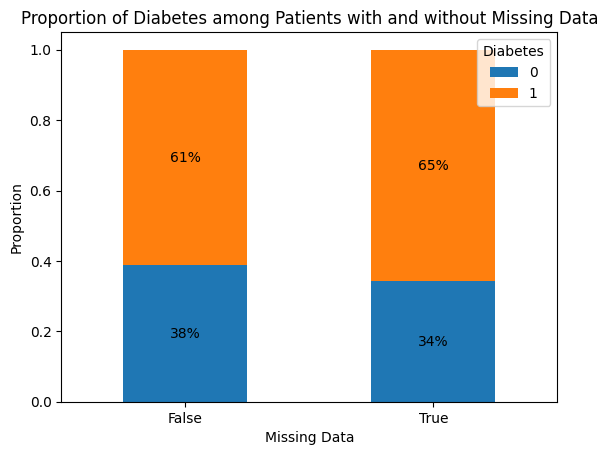

<Figure size 800x600 with 0 Axes>

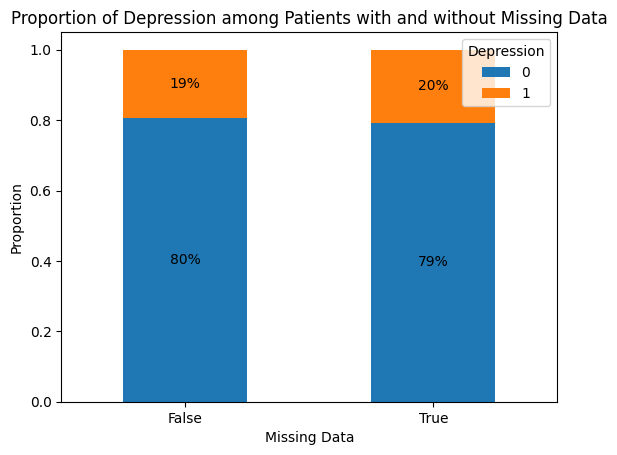

<Figure size 800x600 with 0 Axes>

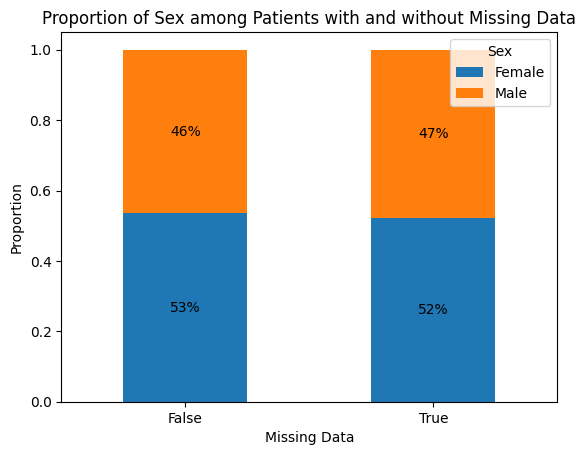

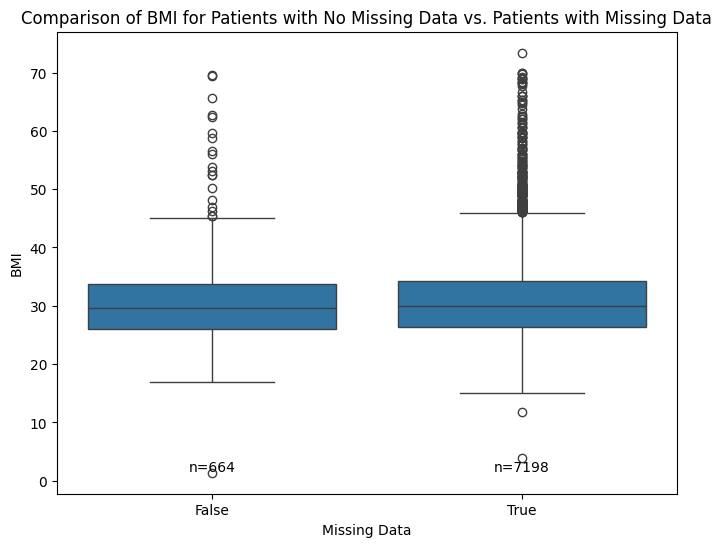

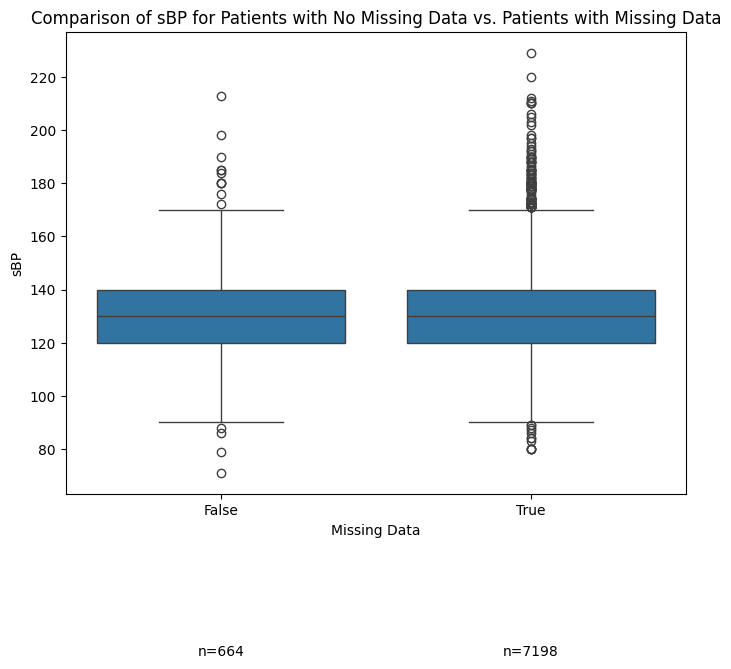

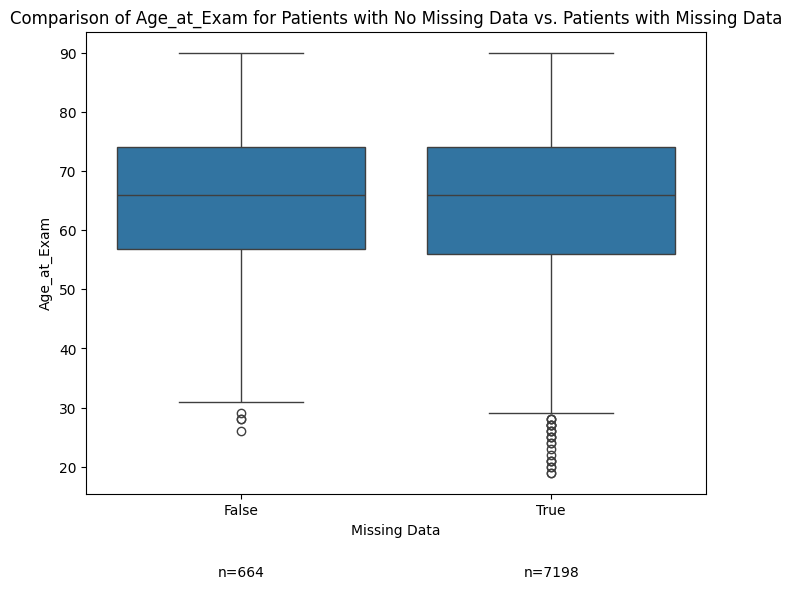

In [ ]:
# Create a new column to indicate whether a row has missing data (defined as having missing data for at least 1 variable)
data['Has_Missing_Data'] = data.isnull().any(axis=1)

# Columns to compare
cont_var = ['BMI', 'sBP', 'Age_at_Exam']
prop_var = ['Diabetes', 'Depression', 'Sex']

# Proportion of patients with diabetes and other categorical variables
for var in prop_var:
    plt.figure(figsize=(8, 6))
    prop_data = data.groupby(['Has_Missing_Data', var]).size().unstack()
    prop_data = prop_data.div(prop_data.sum(axis=1), axis=0)  # Calculate proportions
    prop_data.plot(kind='bar', stacked=True, color=['#1f77b4', '#ff7f0e'], rot=0)

    # Add counts as annotations to the bars
    for p in plt.gca().patches:
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy()
        plt.text(x + width / 2, y + height / 2, f'{int(height * 100)}%', ha='center', va='center')

    plt.title(f'Proportion of {var} among Patients with and without Missing Data')
    plt.xlabel('Missing Data')
    plt.ylabel('Proportion')
    plt.legend(title=var, loc='upper right')
    plt.show()

# Side-by-side boxplots for continuous variables
for var in cont_var:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x='Has_Missing_Data', y=var, data=data)

    # Add counts as annotations above the boxes
    counts = data.groupby('Has_Missing_Data').size().values
    for i, count in enumerate(counts):
        plt.text(i, 1.02, f'n={count}', ha='center', va='bottom')

    plt.title(f'Comparison of {var} for Patients with No Missing Data vs. Patients with Missing Data')
    plt.xlabel('Missing Data')
    plt.ylabel(var)
    plt.show()

SEQUENTIAL DATA

In [ ]:
# Calculate number of patients with sequential records

# Create a new column 'Consecutive_Count' to store the consecutive count for each patient ID
data['Consecutive_Count'] = data.groupby('Patient_ID').cumcount() + 1

# Count the occurrences of patient IDs with multiple records
patient_id_counts = data['Patient_ID'].value_counts()

# Count the occurrences of unique IDs for each sequential count
result = patient_id_counts.value_counts().sort_index(ascending=False)

# Display the result with title
print("Number of Sequences, Number of IDs")
for count, num_ids in result.items():
    print(f"{count}, {num_ids}")


# Calculate the result for (>= 2 sequences)
result_greater_than_2 = (8*2) + (7*2) + (6*3) + (5*9) + (4*28) + (3*154) + (2*764)

# Calculate the result for (all data)
result_all_data = (8*2) + (7*2) + (6*3) + (5*9) + (4*28) + (3*154) + (2*764) + (5667)

# Print the results with labels
print("Result for (>= 2 sequences):", result_greater_than_2)
print("Result for (all data):", result_all_data)

Number of Sequences, Number of IDs
8, 2
7, 2
6, 3
5, 9
4, 28
3, 154
2, 764
1, 5667
Result for (>= 2 sequences): 2195
Result for (all data): 7862


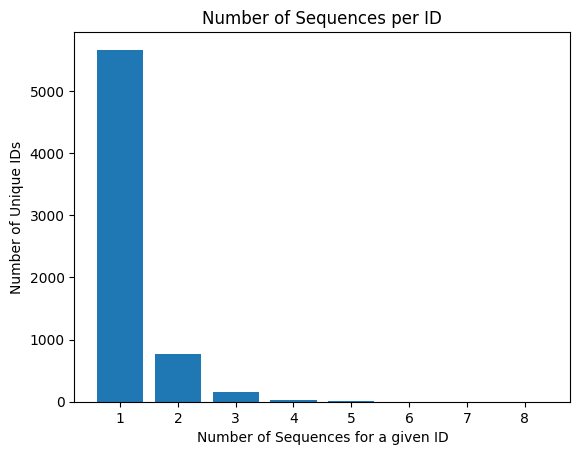

In [ ]:
# Plot the bar graph to show things visually
plt.bar(result.index, result.values, color='#1f77b4')
plt.xlabel('Number of Sequences for a given ID')
plt.ylabel('Number of Unique IDs')
plt.title('Number of Sequences per ID')
plt.show()

In [ ]:
# Print the dimension of the dataset
print(data.shape) # 7862, 70 - same as all data - everying accounted for!

(7862, 71)


In [ ]:
# Calculate number of patients with sequential records

# Count the occurrences of patient IDs with multiple records
patient_id_counts = data['Patient_ID'].value_counts()

# Count the occurrences of unique IDs for each sequential count
result = patient_id_counts.value_counts().sort_index(ascending=False)

# Get the sum of IDs that have 2 or more rows of data
sum_ids_2_or_more = result[result.index >= 2].sum()

print("Sum of IDs with 2 or more rows of data:", sum_ids_2_or_more)

# Filter only the IDs with 2 or more rows
ids_2_or_more = patient_id_counts[patient_id_counts >= 2].index

# Create a mask to select rows with those IDs
mask = data['Patient_ID'].isin(ids_2_or_more)

# Get the total number of rows associated with patients who have 2 or more rows
total_rows_2_or_more = len(data[mask])

# Print the total number of rows associated with patients with 2 or more rows
print("Total number of rows associated with patients with 2 or more rows:", total_rows_2_or_more)

Sum of IDs with 2 or more rows of data: 962
Total number of rows associated with patients with 2 or more rows: 2195


In [ ]:
# Drop the newly created columns used for the descriptive analysis
data = data.drop(['Has_Missing_Data', 'Consecutive_Count'], axis=1)

## Section B2 - Data Representativity

In [ ]:
# Distribution and Representativity of Data

# Using groupby to calculate the average age by gender
avg_age_by_sex = data.groupby('Sex')['Age_at_Exam'].mean().reset_index()

# Create an interactive donut chart
fig_donut = px.pie(avg_age_by_sex, names='Sex', values='Age_at_Exam', title='Average Age by Gender', hole=0.5)

# Customizing the color and theme
fig_donut.update_traces(textinfo='percent+label', pull=[0, 0], marker=dict(colors=['#82153d', '#0d7b94']))
fig_donut.update_layout(template="plotly_white")

# Show the plot
fig_donut.show(renderer="colab")

# Distribution of Age by Gender
fig_box = px.box(data, x='Sex', y='Age_at_Exam', title='Box Plot of Age Grouped by Gender',
                 color='Sex', points="outliers", color_discrete_sequence=['#0d7b94', '#82153d'])
fig_box.update_layout(template="plotly_white")
fig_box.show()

In [ ]:
counts = data['Diabetes'].value_counts()

# Define your color sequence
colors = ['#1c3a73', '#7cb1c2']

fig = px.pie(
    names=counts.index,
    values=counts.values,
    hole=0.5,  # size of the hole, 0.5 means 50%
    title='Distribution of Pre-Diabetes (1) and Diabetes (2)',
    color_discrete_sequence=colors  # apply your colors here
)

# Update layout for better appearance
fig.update_layout(
    margin=dict(t=50, b=0, l=0, r=0),  # Adjust top margin to make room for title
    legend=dict(
        orientation="v",
        yanchor="top",
        y=0.5,
        xanchor="left",
        x=1.05,
        title='Diabetes Status'
    ),
    title=dict(
        text='Distribution of Pre-Diabetes (1) and Diabetes (2)',
        x=0.45,  # Centering the title
        xanchor='center',
        y=0.95,  # Adjusting y position to place title above chart
        yanchor='top',
        font=dict(size=16)
    ),
    width=500,
    height=350
)

fig.show()

In [ ]:
counts = data['Depression'].value_counts()

# Define colour
colors = ['#1c3a73', '#7cb1c2']

fig = px.pie(
    names=counts.index,
    values=counts.values,
    hole=0.5,  # size of the hole, 0.5 means 50%
    title='Distribution of Classes in "Depression"',
    color_discrete_sequence=colors  # apply colours
)

# Update layout for better appearance
fig.update_layout(
    margin=dict(t=50, b=0, l=0, r=0),  # Adjust top margin to make room for title
    legend=dict(
        orientation="v",
        yanchor="top",
        y=0.5,
        xanchor="left",
        x=1.05,
        title='Depression'
    ),
    title=dict(
        text='Distribution of Classes in "Depression (1=Yes)',
        x=0.45,  # Centering the title
        xanchor='center',
        y=0.95,  # Adjusting y position to place title above chart
        yanchor='top',
        font=dict(size=16)
    ),
    width=500,
    height=350
)

fig.show()

In [ ]:
# Group the data by the "depression" variable
grouped_data = data.groupby('Depression')

variables = ["A1c"]

# Calculate summary statistics for each group
summary_stats_depres = grouped_data[variables].agg(['mean', 'std', 'min', 'max'])

print(summary_stats_depres)

# no significant differences between groups when stratified by outcome of interest

                 A1c                     
                mean       std  min   max
Depression                               
0           6.519864  0.940578  4.4  14.3
1           6.451056  0.921603  4.8  13.8


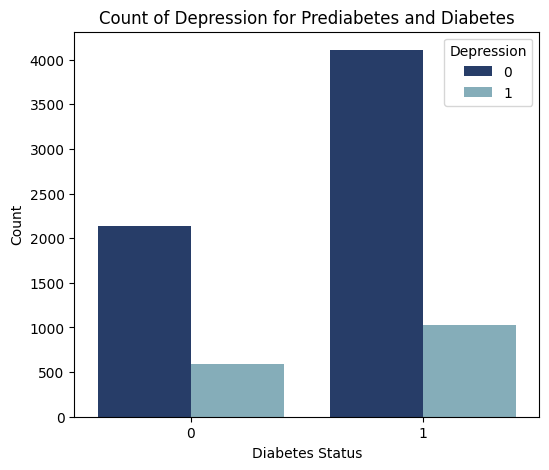

In [ ]:
# Define a list of colors
colors = ['#1c3a73', '#7cb1c2']

# Create the grouped bar chart using seaborn's countplot function
plt.figure(figsize=(6, 5))
sns.countplot(data=data, x='Diabetes', hue='Depression', palette=colors)

plt.xlabel('Diabetes Status')
plt.ylabel('Count')
plt.title('Count of Depression for Prediabetes and Diabetes')
plt.legend(title='Depression')
plt.show()

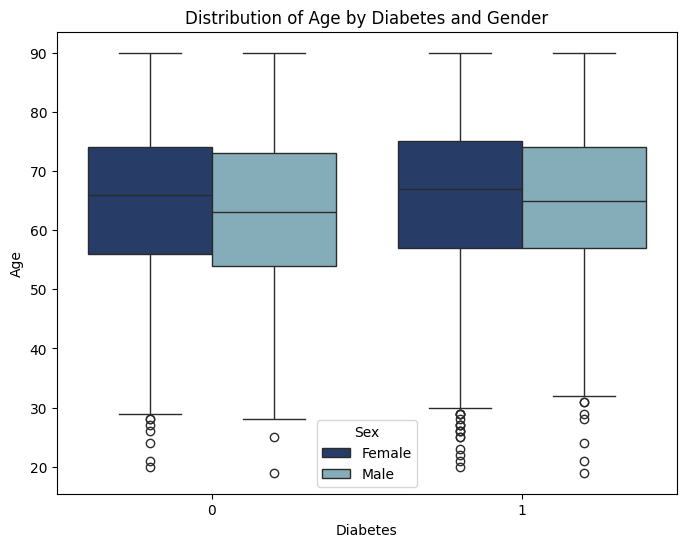

In [ ]:
# Define a custom color palette
custom_palette = ['#1c3a73', '#7cb1c2']

# Create the boxplot with the custom color palette
plt.figure(figsize=(8, 6))
sns.boxplot(data=data, x='Diabetes', y='Age_at_Exam', hue='Sex', palette=custom_palette)

# Set labels and title
plt.xlabel('Diabetes')
plt.ylabel('Age')
plt.title('Distribution of Age by Diabetes and Gender')

# Show the plot
plt.show()

## Section B3 - Taking a Closer Look at Continous Variables

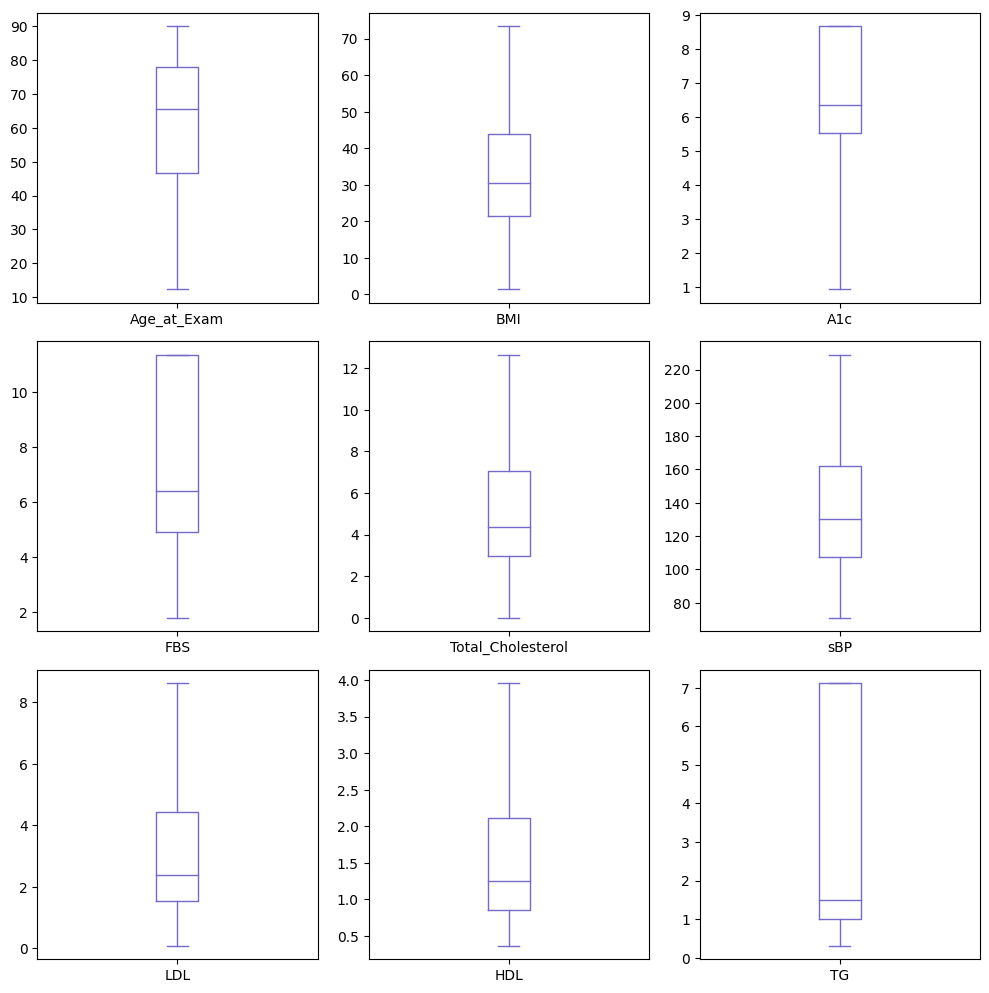

In [ ]:
# Specify the continuous variables to include
continuous_variables = ['Age_at_Exam', 'BMI', 'A1c', 'FBS', 'Total_Cholesterol', 'sBP', 'LDL', 'HDL', 'TG']

# Plot boxplots
description[continuous_variables].plot(kind='box', subplots=True, layout=(3, 3), figsize=(10, 10), color='#7569c9', sym='')
plt.tight_layout()
plt.show()


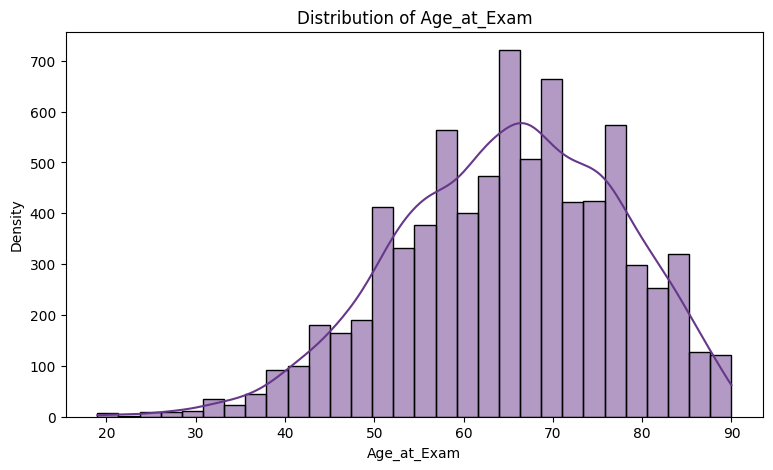

<Figure size 900x500 with 0 Axes>

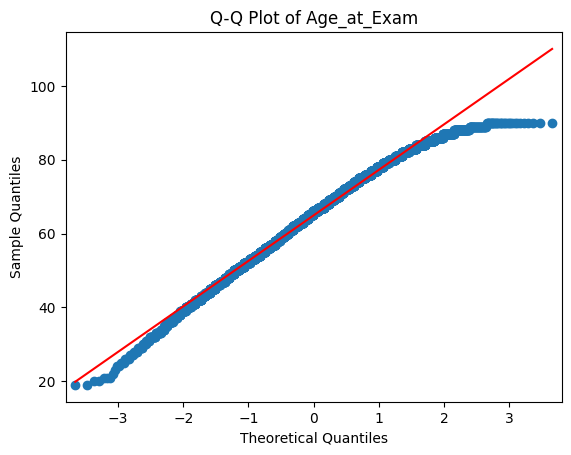

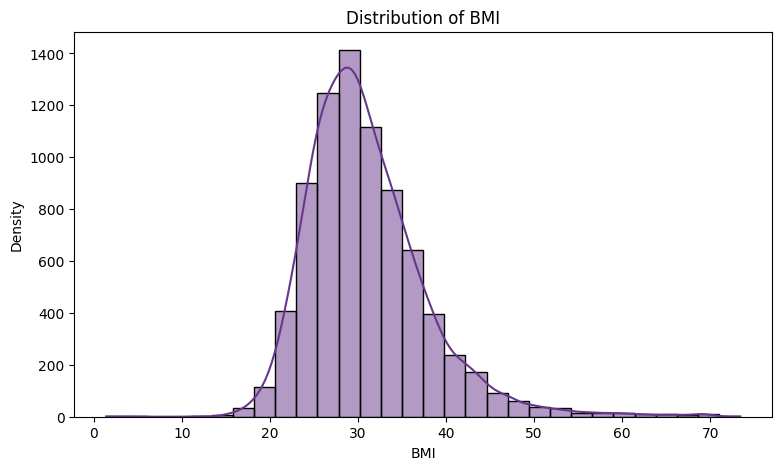

<Figure size 900x500 with 0 Axes>

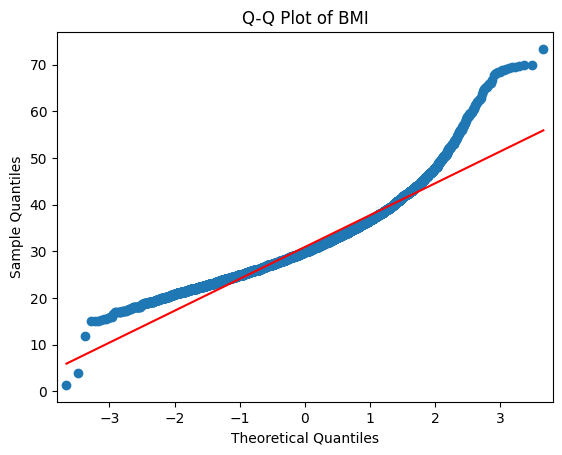

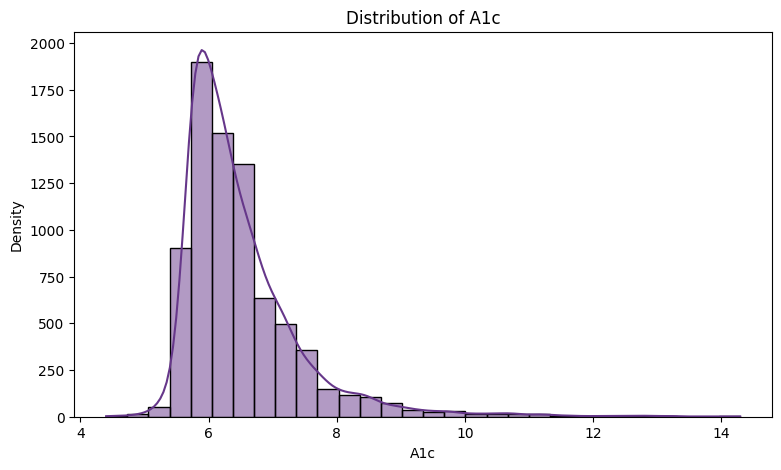

<Figure size 900x500 with 0 Axes>

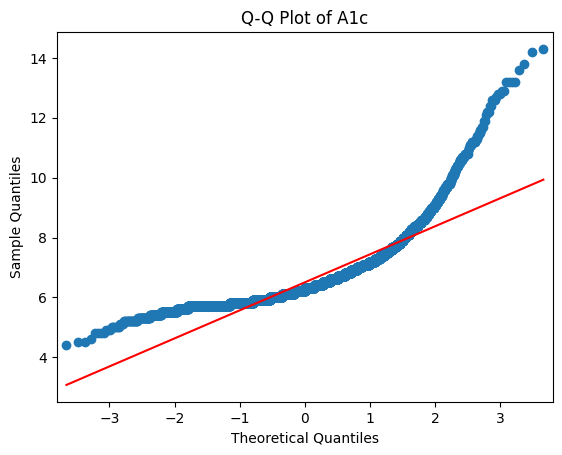

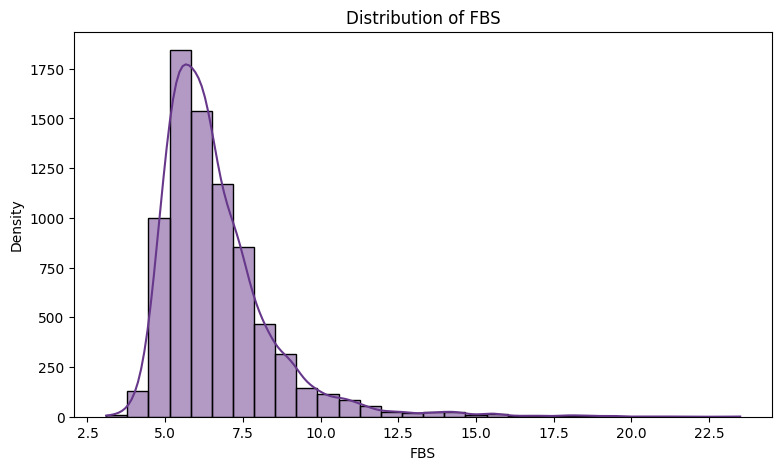

<Figure size 900x500 with 0 Axes>

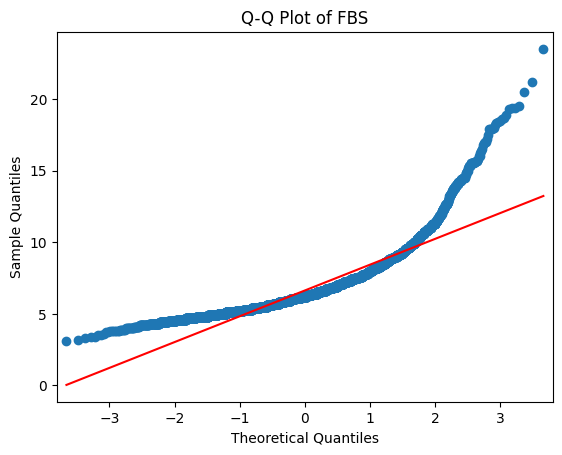

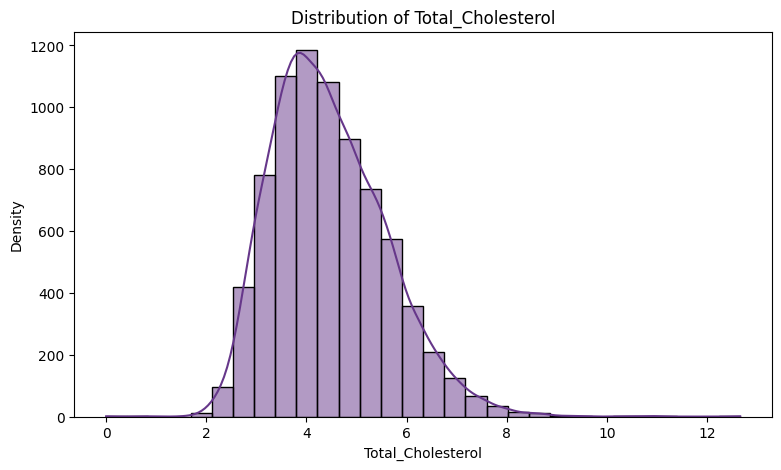

<Figure size 900x500 with 0 Axes>

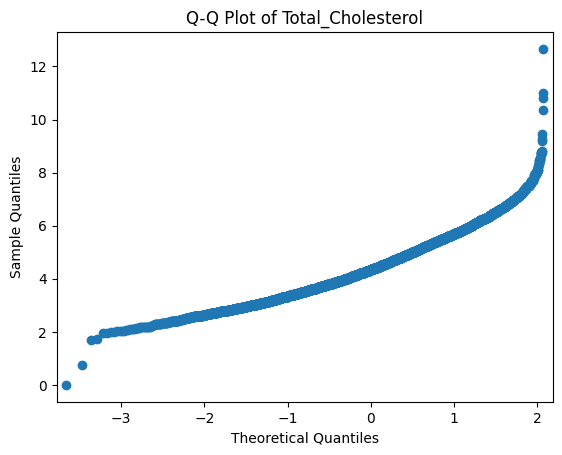

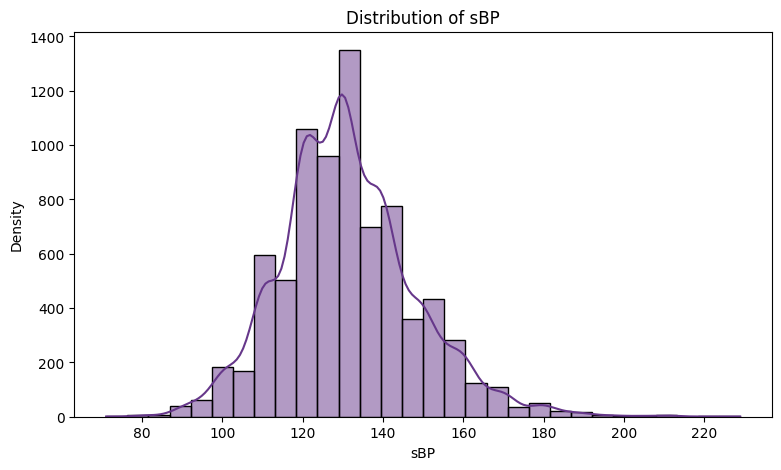

<Figure size 900x500 with 0 Axes>

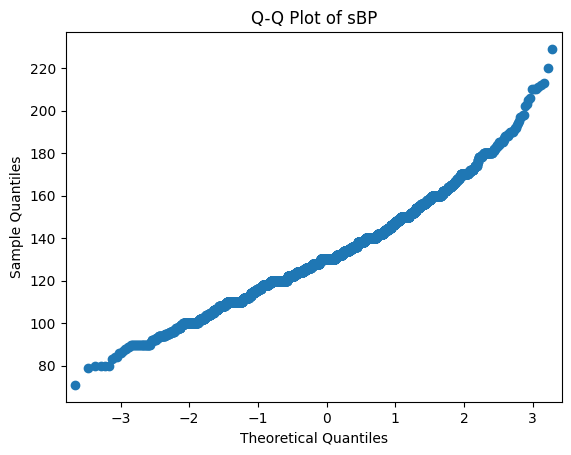

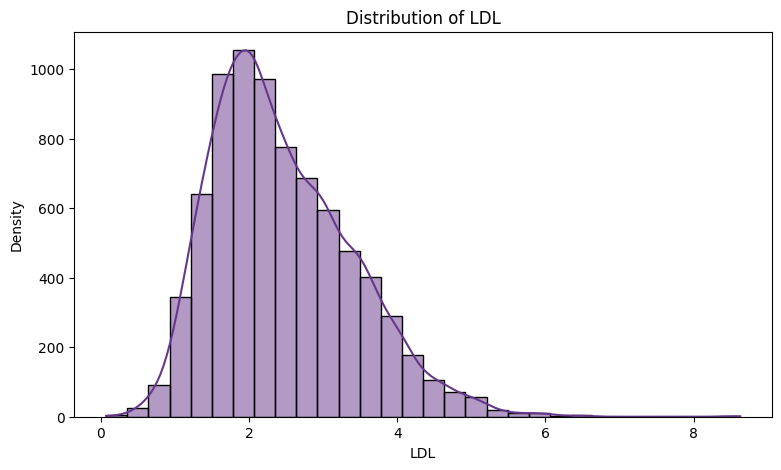

<Figure size 900x500 with 0 Axes>

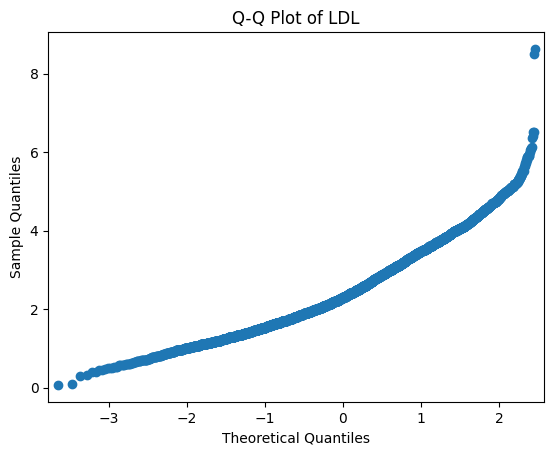

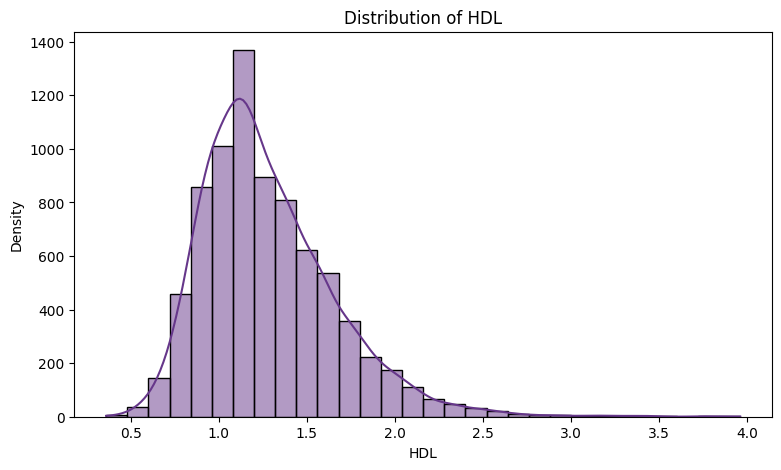

<Figure size 900x500 with 0 Axes>

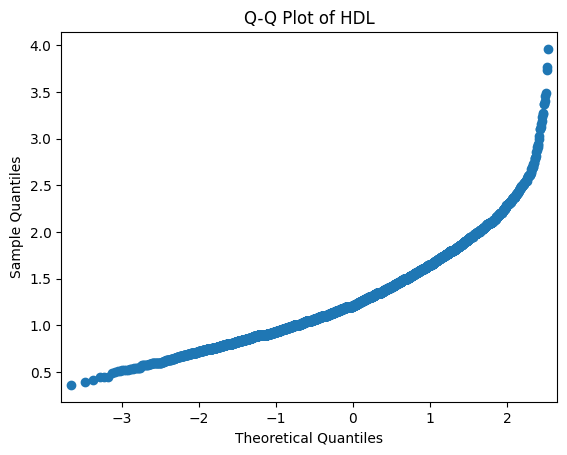

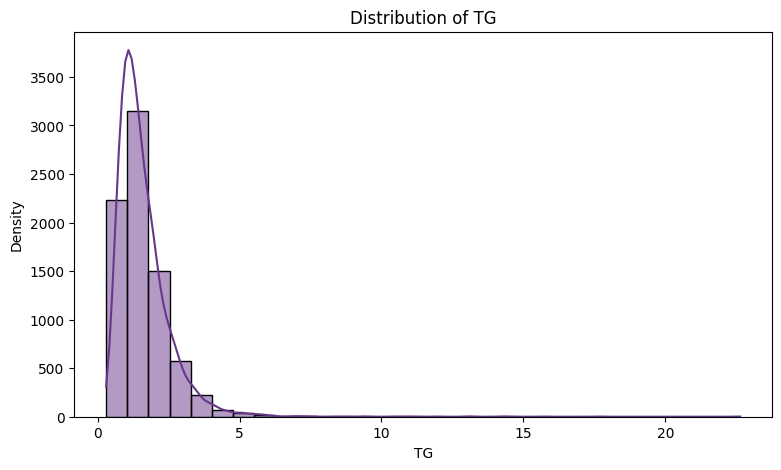

<Figure size 900x500 with 0 Axes>

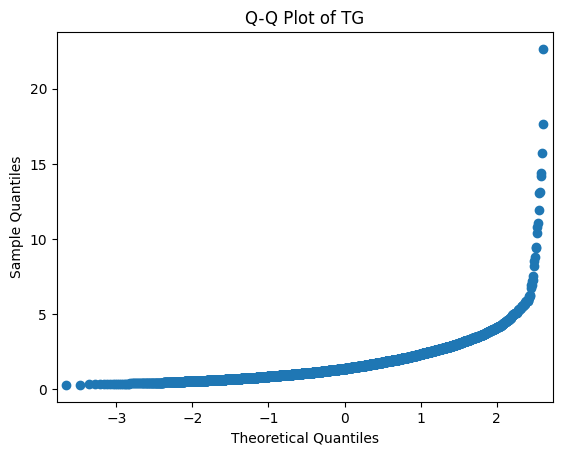

In [ ]:
for variable in continuous_variables:
    # Create a new figure for each variable
    plt.figure(figsize=(9, 5))

    # Histogram with a smoothed line (kernel density estimate)
    sns.histplot(data[variable], bins=30, kde=True, color='#66378a')
    plt.title(f'Distribution of {variable}')
    plt.xlabel(variable)
    plt.ylabel('Density')
    plt.show()

    # Q-Q plot
    plt.figure(figsize=(9, 5))
    sm.qqplot(data[variable], line='s', color='#66378a')
    plt.title(f'Q-Q Plot of {variable}')
    plt.show()

<Figure size 900x500 with 0 Axes>

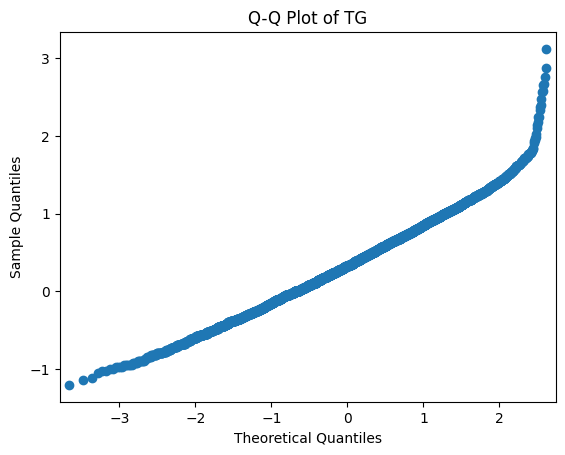

In [ ]:
continuous_log = ['TG']

data_norm = data  # Create a copy of the original data

# Re-express data as log, made loop in case we need to transofrom other vars in future
for var in continuous_log:
    data_norm[var] = np.log(data_norm[var])

##qq plots
for var in continuous_log:


    plt.figure(figsize=(9, 5))
    sm.qqplot(data_norm[var], line='s', color='#66378a')
    plt.title(f'Q-Q Plot of {var}')
    plt.show()

data_norm.head()

#link back to main data - SWITCH
data = data_norm

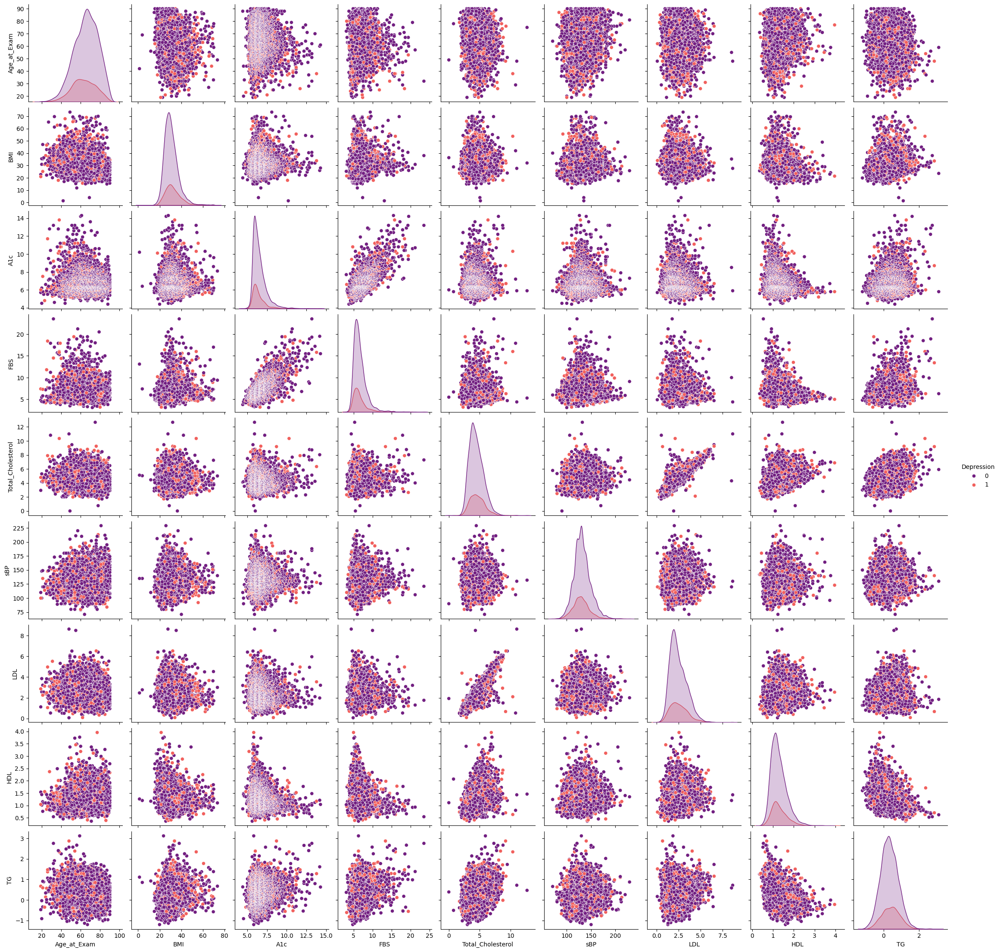

In [ ]:
#TEMPORARILY HIDE TO CODE RUNS FASTER WHEN SWITCHING USERS

# Subset the data to include only the specified continuous variables
pairwise_df = data[continuous_variables + ['Depression']]

# Create a pairwise plot
sns.pairplot(pairwise_df, hue='Depression', palette="magma")
plt.show()

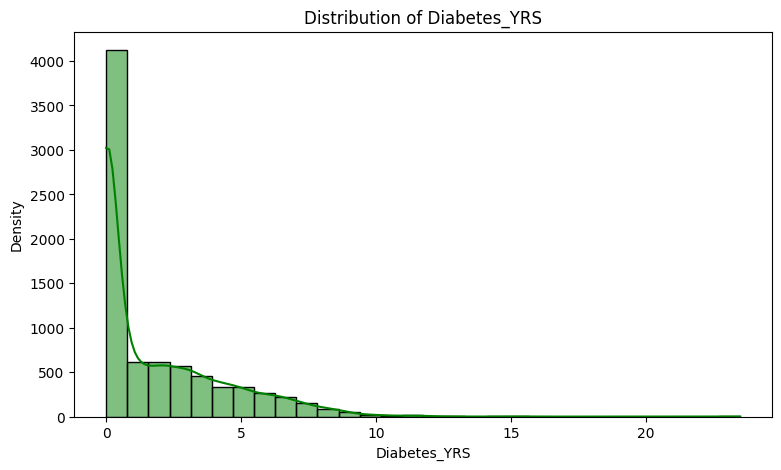

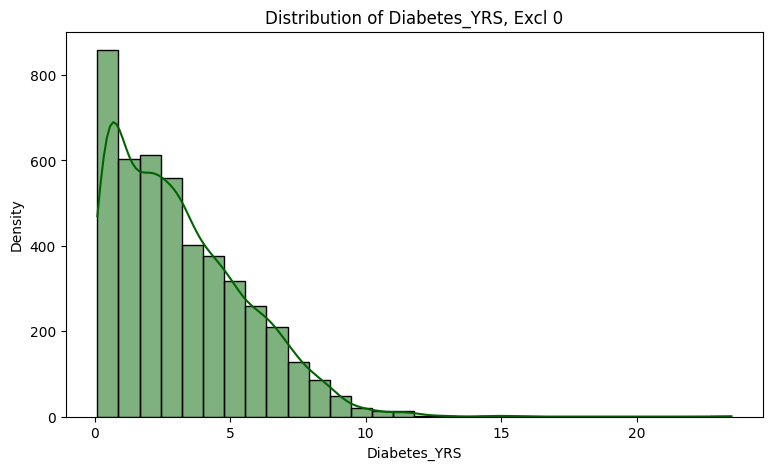

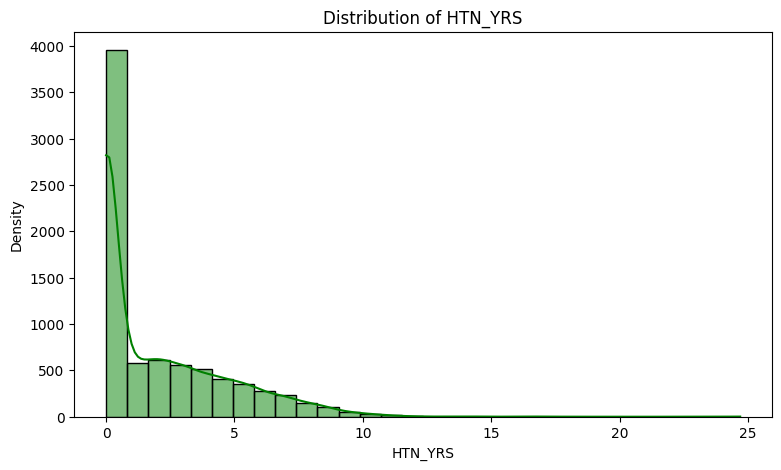

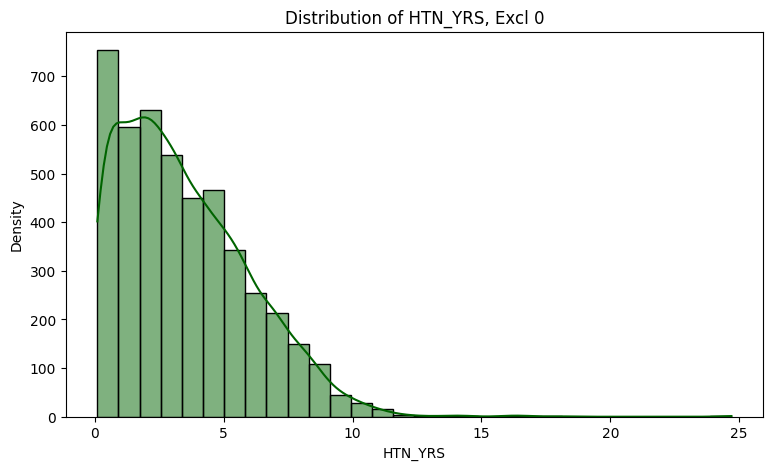

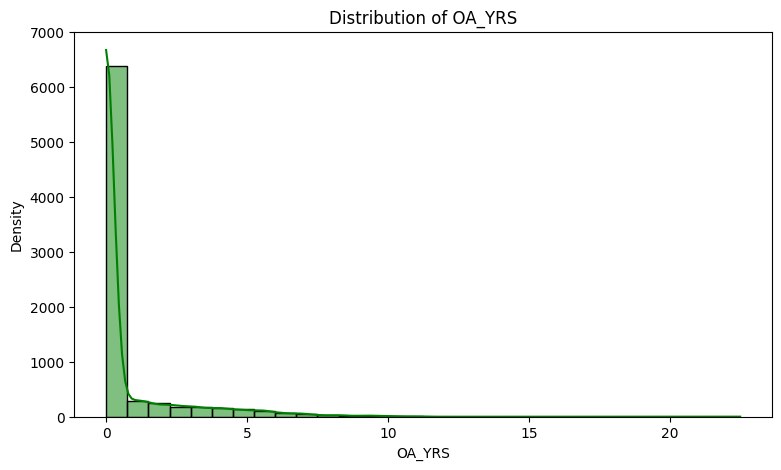

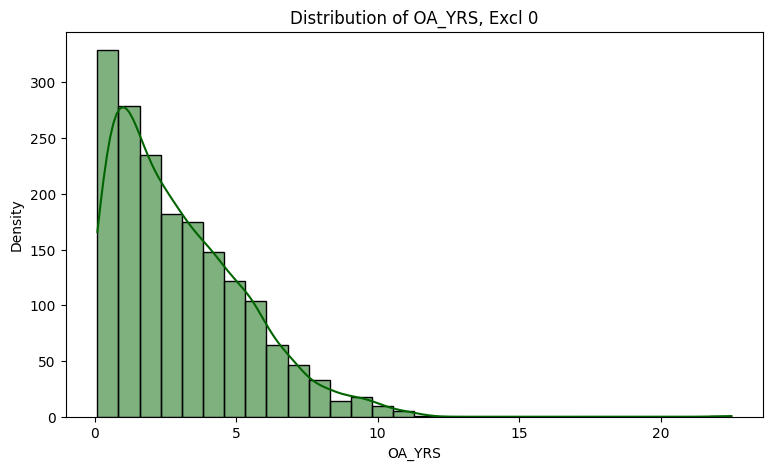

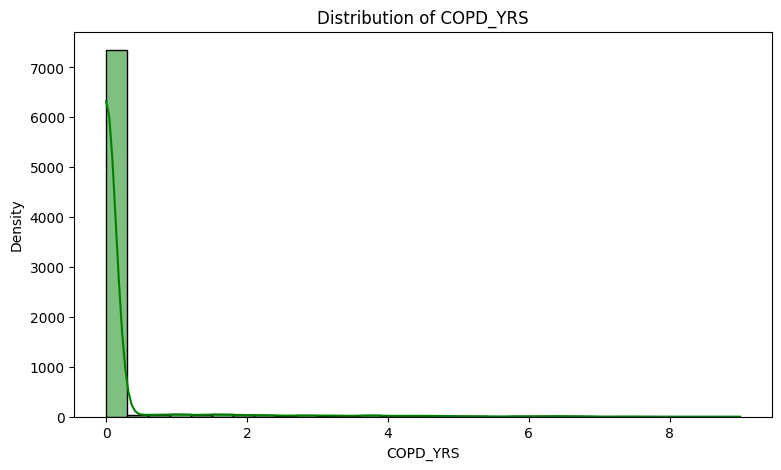

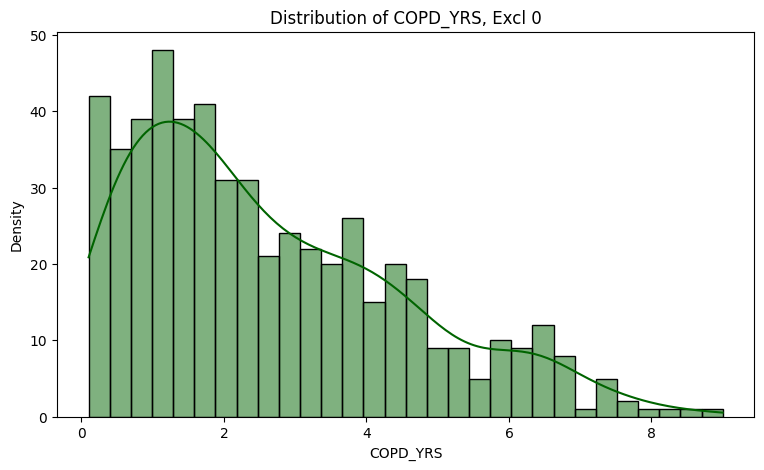

In [ ]:
conditiontime_variables = ["Diabetes_YRS", "HTN_YRS", "OA_YRS", "COPD_YRS"]


for variable in conditiontime_variables:
    # Create a new figure for each variable
    plt.figure(figsize=(9, 5))
    # Histogram with a smoothed line (kernel density estimate)
    sns.histplot(data[variable], bins=30, kde=True, color='green')
    plt.title(f'Distribution of {variable}')
    plt.xlabel(variable)
    plt.ylabel('Density')
    plt.show()

    # Create a new figure - without 0
    plt.figure(figsize=(9, 5))
    # Filter the data to exclude values equal to 0
    filtered_data = data[data[variable] > 0]
    # Histogram of the filtered data
    sns.histplot(filtered_data[variable], bins=30, kde=True, color='darkgreen')
    plt.title(f'Distribution of {variable}, Excl 0')
    plt.xlabel(variable)
    plt.ylabel('Density')
    plt.show()

## Section B4 - Taking a Closer Look at Categorical Variables

In [ ]:
### FREQUENCY AMONG CATEGORICAL VARIABLES

# Cat var
categorical = ["Diabetes", "Depression", "HTN", "OA", "COPD"]

# Def colours
colors = ['#1c3a73', '#7cb1c2']

# Overall - both sexes
yes, no = np.zeros(len(categorical)), np.zeros(len(categorical))

for c in categorical:
   yes[categorical.index(c)] = np.sum(data[c] == 1)
   no[categorical.index(c)] = np.sum(data[c] == 0)

fig = px.bar(x=categorical, y=[no, yes], labels={'x': 'Attribute', 'y': 'Number of Patients'},
             title="Categorical Comorbidity Variables - Overall", color_discrete_sequence=colors)
fig.update_layout(xaxis_title="Attribute", yaxis_title="Number of Patients")
fig.update_traces(marker_line_width=0)
fig.update_layout(height=400, width=600)
fig.show()

# By Diabetes
cat_no_diabetes = data.loc[data["Diabetes"] == 0]
cat_diabetes = data.loc[data["Diabetes"] == 1]

cat_no_diabetes_counts = cat_no_diabetes[categorical].apply(pd.value_counts).T
cat_diabetes_counts = cat_diabetes[categorical].apply(pd.value_counts).T

fig = px.bar(cat_no_diabetes_counts, barmode='stack', title="Categorical Variables by Diabetes Status: Pre-Diabetes", color_discrete_sequence=colors)
fig.update_layout(xaxis_title="Attribute", yaxis_title="Number of Patients")
fig.update_traces(marker_line_width=0)
fig.update_layout(height=400, width=600)
fig.show()

fig = px.bar(cat_diabetes_counts, barmode='stack', title="Categorical Variables by Diabetes Status: Diabetes", color_discrete_sequence=colors)
fig.update_layout(xaxis_title="Attribute", yaxis_title="Number of Patients")
fig.update_traces(marker_line_width=0)
fig.update_layout(height=400, width=600)
fig.show()

# By Depression
cat_no_depression = data.loc[data["Depression"] == 0]
cat_depression = data.loc[data["Depression"] == 1]

cat_no_depression_counts = cat_no_depression[categorical].apply(pd.value_counts).T
cat_depression_counts = cat_depression[categorical].apply(pd.value_counts).T

fig = px.bar(cat_no_depression_counts, barmode='stack', title="Categorical Variables by Depression Status: No Depression", color_discrete_sequence=colors)
fig.update_layout(xaxis_title="Attribute", yaxis_title="Number of Patients")
fig.update_traces(marker_line_width=0)
fig.update_layout(height=400, width=600)
fig.show()

fig = px.bar(cat_depression_counts, barmode='stack', title="Categorical Variables by Depression Status: Depression", color_discrete_sequence=colors)
fig.update_layout(xaxis_title="Attribute", yaxis_title="Number of Patients")
fig.update_traces(marker_line_width=0)
fig.update_layout(height=400, width=600)
fig.show()

#all have count at least 5


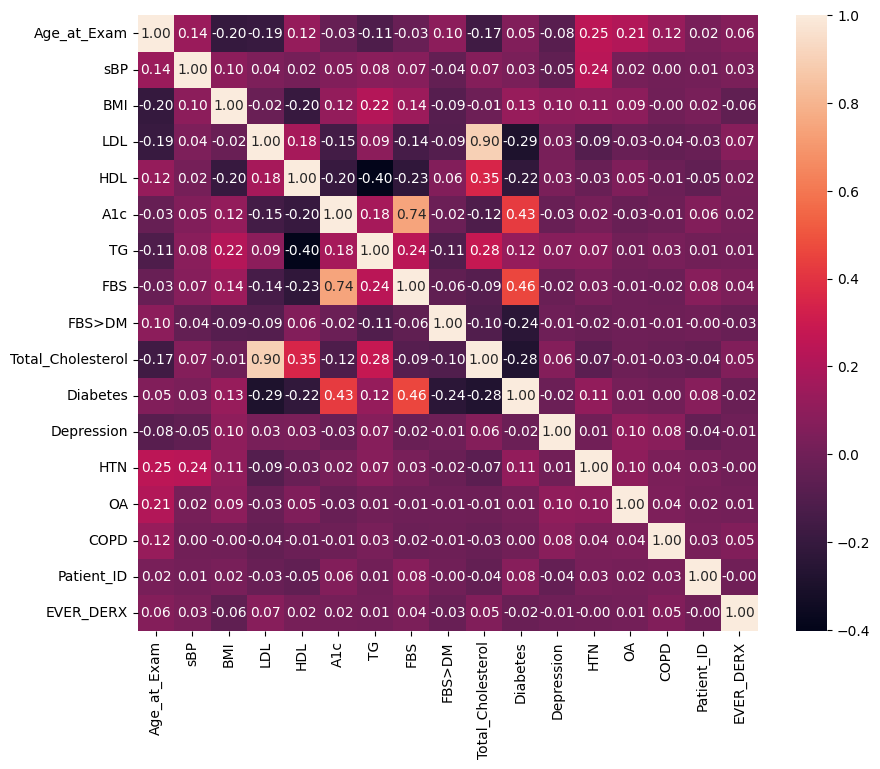

In [ ]:
# Exclude variables that start with 'HTRX_' or 'CSRX_', end with '_YRS', and 'Diabetes2'
filtered_data = data.loc[:, ~data.columns.str.startswith('HTRX_') & ~data.columns.str.startswith('CSRX_') & ~data.columns.str.endswith('_YRS') & (data.columns != 'Diabetes2')]

# Calculate the correlation matrix
corr_matrix = filtered_data.corr()

# Plot the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f")
plt.show()

#LDL is correlated with cholesterol, A1c is correlated with Fasting Blood Sugar (FBS)
#we will pick *LDL over cholesterol as it appears to be more frequently collected in clinic (may reduce potential training-serving skew)
#Both A1C and FBS do not have missing data, so we will select *A1c vs FBS solely due to its utility as a marker of bloood sugar conrol in past 3 months

In [ ]:
#ADDRESSING HIGH CO-LINEARITY
#as mentioned above, these were co-linear, as these values are also expected to be co-linear (clinically), we will remove one from each pair
data.drop(['FBS', 'Total_Cholesterol'], axis=1, inplace=True)

#will also drop the diabetes 2 variable since it infers the same infromation as the Diabetes variable
data.drop(['Diabetes2'], axis=1, inplace=True)

In [ ]:
data.head()

,Age_at_Exam,sBP,BMI,LDL,HDL,A1c,TG,FBS>DM,Diabetes,Depression,HTN,OA,COPD,Sex,Patient_ID,EVER_DERX,HTRX_ACEBUTOLOL,HTRX_ALISKIREN,HTRX_AMLODIPINE,HTRX_ATENOLOL,HTRX_BENAZEPRIL,HTRX_BISOPROLOL,HTRX_CANDESARTAN,HTRX_CARVEDILOL,HTRX_CILAZAPRIL,HTRX_DILTIAZEM,HTRX_DIURETIC,HTRX_DOXAZOSIN,HTRX_ENALAPRIL,HTRX_EPROSARTAN,HTRX_FELODIPINE,HTRX_FOSINOPRIL,HTRX_FUROSEMIDE,HTRX_HYDROCHLOROTHIAZIDE,HTRX_IRBESARTAN,HTRX_LABETALOL,HTRX_LISINOPRIL,HTRX_LOSARTAN,HTRX_METOPROLOL,HTRX_NADOLOL,HTRX_NIFEDIPINE,HTRX_OLMESARTAN MEDOXOMIL,HTRX_PERINDOPRIL,HTRX_POTASSIUM-SPARING AGENTS,HTRX_PROPRANOLOL,HTRX_QUINAPRIL,HTRX_RAMIPRIL,HTRX_SOTALOL,HTRX_SPIRONOLACTONE,HTRX_TELMISARTAN,HTRX_TIMOLOL,HTRX_TRANDOLAPRIL,HTRX_VALSARTAN,HTRX_VERAPAMIL,CSRX_ANTIBIOTICS,CSRX_ANTIINFECTIVES,CSRX_DEXAMETHASONE,CSRX_HYDROCORTISONE,CSRX_METHYLPREDNISOLONE,CSRX_PREDNISOLONE,CSRX_PREDNISONE,OBS_DATE,Diabetes_YRS,HTN_YRS,OA_YRS,COPD_YRS
0,75,154.0,27.000000,2.35,1.59,5.7,0.270027,1,0,0,1,1,0,Female,4001000000288198,NaN,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,2013-06-18,0.0,4.0,4.0,0.0
1,46,110.0,21.000000,2.56,1.35,5.7,-0.116534,1,0,1,0,0,1,Female,4001000000290369,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2015-02-06,0.0,0.0,0.0,4.2
2,57,110.0,27.475629,4.20,2.55,5.7,-0.342490,1,0,0,1,1,0,Female,4001000000291156,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2013-07-31,0.0,2.2,2.2,0.0
3,44,110.0,35.000000,3.72,1.15,5.7,0.048790,1,0,0,0,0,0,Male,4001000000291570,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2013-07-12,0.0,0.0,0.0,0.0
4,45,116.0,29.000000,3.66,1.56,5.7,-0.210721,1,0,0,1,0,0,Female,4001000000288296,NaN,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2012-10-01,0.0,2.4,0.0,0.0


# Section C - Feature Engineering pt 2 K-means Clustering: Medication Groups

Cluster medication profiles for HTN and Corticosteroids - All Patients

In [ ]:
# Convert sex variable to 1 and 0
data['Sex'].replace({'Female' : 1, 'Male' : 0}, inplace=True)

['HTRX_ACEBUTOLOL', 'HTRX_ALISKIREN', 'HTRX_AMLODIPINE', 'HTRX_ATENOLOL', 'HTRX_BENAZEPRIL', 'HTRX_BISOPROLOL', 'HTRX_CANDESARTAN', 'HTRX_CARVEDILOL', 'HTRX_CILAZAPRIL', 'HTRX_DILTIAZEM', 'HTRX_DIURETIC', 'HTRX_DOXAZOSIN', 'HTRX_ENALAPRIL', 'HTRX_EPROSARTAN', 'HTRX_FELODIPINE', 'HTRX_FOSINOPRIL', 'HTRX_FUROSEMIDE', 'HTRX_HYDROCHLOROTHIAZIDE', 'HTRX_IRBESARTAN', 'HTRX_LABETALOL', 'HTRX_LISINOPRIL', 'HTRX_LOSARTAN', 'HTRX_METOPROLOL', 'HTRX_NADOLOL', 'HTRX_NIFEDIPINE', 'HTRX_OLMESARTAN MEDOXOMIL', 'HTRX_PERINDOPRIL', 'HTRX_POTASSIUM-SPARING AGENTS', 'HTRX_PROPRANOLOL', 'HTRX_QUINAPRIL', 'HTRX_RAMIPRIL', 'HTRX_SOTALOL', 'HTRX_SPIRONOLACTONE', 'HTRX_TELMISARTAN', 'HTRX_TIMOLOL', 'HTRX_TRANDOLAPRIL', 'HTRX_VALSARTAN', 'HTRX_VERAPAMIL', 'CSRX_ANTIBIOTICS', 'CSRX_ANTIINFECTIVES', 'CSRX_DEXAMETHASONE', 'CSRX_HYDROCORTISONE', 'CSRX_METHYLPREDNISOLONE', 'CSRX_PREDNISOLONE', 'CSRX_PREDNISONE']
45


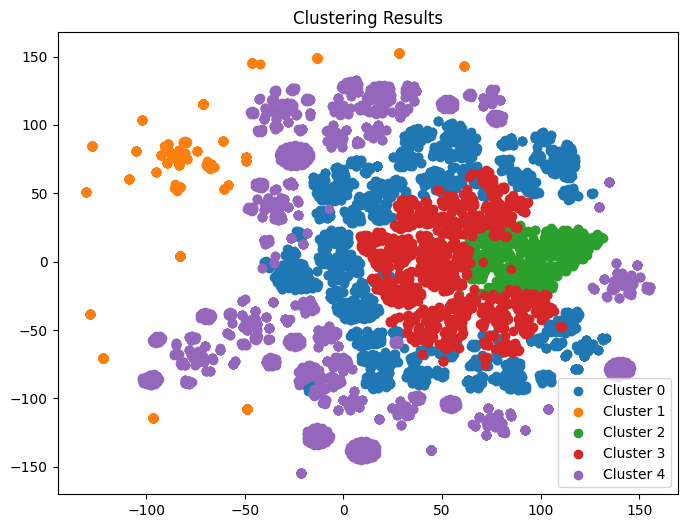

In [ ]:
from sklearn.metrics import pairwise_distances
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

htrx_csrx_variables = [col for col in data.columns if col.startswith('HTRX') or col.startswith('CSRX')]

print(htrx_csrx_variables)
print(len(htrx_csrx_variables))

binary_data = data[htrx_csrx_variables].to_numpy()

# Calculate the Hamming distance matrix
hamming_distance = pairwise_distances(binary_data, metric='hamming')

# Apply K-Means clustering with K=5
kmeans = KMeans(n_clusters=5, random_state=0)
labels = kmeans.fit_predict(hamming_distance)

# Visualize the clustering results using a scatter plot (you may choose a suitable projection technique)
# Example: Using t-SNE for visualization (you need to import it)
from sklearn.manifold import TSNE

# Reduce dimensionality for visualization (adjust the number of components as needed)
tsne = TSNE(n_components=2, random_state=0)
projected_data = tsne.fit_transform(hamming_distance)

# Plot the clusters
plt.figure(figsize=(8, 6))
for i in range(5):
    plt.scatter(projected_data[labels == i, 0], projected_data[labels == i, 1], label=f'Cluster {i}')
plt.title('Clustering Results')
plt.legend()
plt.show()

In [ ]:
data['Med_Cluster'] = labels
data.head(10)

,Age_at_Exam,sBP,BMI,LDL,HDL,A1c,TG,FBS>DM,Diabetes,Depression,HTN,OA,COPD,Sex,Patient_ID,EVER_DERX,HTRX_ACEBUTOLOL,HTRX_ALISKIREN,HTRX_AMLODIPINE,HTRX_ATENOLOL,HTRX_BENAZEPRIL,HTRX_BISOPROLOL,HTRX_CANDESARTAN,HTRX_CARVEDILOL,HTRX_CILAZAPRIL,HTRX_DILTIAZEM,HTRX_DIURETIC,HTRX_DOXAZOSIN,HTRX_ENALAPRIL,HTRX_EPROSARTAN,HTRX_FELODIPINE,HTRX_FOSINOPRIL,HTRX_FUROSEMIDE,HTRX_HYDROCHLOROTHIAZIDE,HTRX_IRBESARTAN,HTRX_LABETALOL,HTRX_LISINOPRIL,HTRX_LOSARTAN,HTRX_METOPROLOL,HTRX_NADOLOL,HTRX_NIFEDIPINE,HTRX_OLMESARTAN MEDOXOMIL,HTRX_PERINDOPRIL,HTRX_POTASSIUM-SPARING AGENTS,HTRX_PROPRANOLOL,HTRX_QUINAPRIL,HTRX_RAMIPRIL,HTRX_SOTALOL,HTRX_SPIRONOLACTONE,HTRX_TELMISARTAN,HTRX_TIMOLOL,HTRX_TRANDOLAPRIL,HTRX_VALSARTAN,HTRX_VERAPAMIL,CSRX_ANTIBIOTICS,CSRX_ANTIINFECTIVES,CSRX_DEXAMETHASONE,CSRX_HYDROCORTISONE,CSRX_METHYLPREDNISOLONE,CSRX_PREDNISOLONE,CSRX_PREDNISONE,OBS_DATE,Diabetes_YRS,HTN_YRS,OA_YRS,COPD_YRS,Med_Cluster
0,75,154.0,27.000000,2.35,1.59,5.7,0.270027,1,0,0,1,1,0,1,4001000000288198,NaN,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,2013-06-18,0.0,4.0,4.0,0.0,0
1,46,110.0,21.000000,2.56,1.35,5.7,-0.116534,1,0,1,0,0,1,1,4001000000290369,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2015-02-06,0.0,0.0,0.0,4.2,1
2,57,110.0,27.475629,4.20,2.55,5.7,-0.342490,1,0,0,1,1,0,1,4001000000291156,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2013-07-31,0.0,2.2,2.2,0.0,4
3,44,110.0,35.000000,3.72,1.15,5.7,0.048790,1,0,0,0,0,0,0,4001000000291570,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2013-07-12,0.0,0.0,0.0,0.0,1
4,45,116.0,29.000000,3.66,1.56,5.7,-0.210721,1,0,0,1,0,0,1,4001000000288296,NaN,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2012-10-01,0.0,2.4,0.0,0.0,4
5,71,118.0,23.000000,2.96,1.48,5.7,-0.400478,1,0,1,1,1,0,0,4001000000293815,NaN,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,2014-01-14,0.0,1.5,0.0,0.0,0
6,67,130.0,30.000000,2.70,1.00,5.7,0.122218,1,0,0,1,1,0,0,4001000000297216,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2013-04-29,0.0,0.2,0.8,0.0,1
7,30,118.0,37.000000,2.38,1.30,5.7,0.625938,1,0,1,0,0,0,1,4001000000293578,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2014-02-04,0.0,0.0,0.0,0.0,1
8,56,124.0,26.000000,3.06,2.35,5.7,-0.544727,1,0,1,1,0,0,1,4001000000316429,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,2012-05-16,0.0,3.4,0.0,0.0,4
9,66,160.0,22.000000,3.70,2.17,5.7,-0.105361,1,0,0,0,0,0,1,4001000000314362,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2010-07-12,0.0,0.0,0.0,0.0,1


# Section D: Splitting Data, Class Rebalancing, and Imputation - For All Models

**PIPELINE: (In Order That It Was Done)**

VARIABLE ENCODING


*   Convert Columns Counting Disease Years into rounded Integer (from float)
*   One Hot Encode Medication Cluster Variable

SPLIT DATA


*   80% Train, 20% Test
*   Y Label = Depression

IMPUTATION


*   Use MICE Imputation for variables with missing continous data, small % was missing and there was limited evidence of MAR during data exploration phase.

NORMALIZE DATA

ADDRESS CLASS IMBALANCE IN TRAINING SET


*   Random Undersampling of majority class with TomekLinks, then SMOTE Upsampling of minority class.










In [ ]:
# Create a copy of the data
data_processed = data.copy()

In [ ]:
import numpy as np
import torch

# Set seeds for reproducibility
seed_value = 42

# Set seed for NumPy
np.random.seed(seed_value)

# Set seed for PyTorch
torch.manual_seed(seed_value)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed_value)

In [ ]:
# Convert years with condition into an ordinal variable - (count of years, integer)
# List of columns to round to the nearest whole number
columns_to_round = ['Diabetes_YRS', 'HTN_YRS', 'OA_YRS', 'COPD_YRS']

# Round the specified columns in the main dataset
data_processed[columns_to_round] = data_processed[columns_to_round].round()

# Ensure the specified columns are of integer type
data_processed[columns_to_round] = data_processed[columns_to_round].astype(int)

In [ ]:
data_processed = pd.get_dummies(data_processed, columns=['Med_Cluster'], prefix='Med_Cluster')

In [ ]:
print("Column Names:", data_processed.columns)

Column Names: Index(['Age_at_Exam', 'sBP', 'BMI', 'LDL', 'HDL', 'A1c', 'TG', 'FBS>DM',
       'Diabetes', 'Depression', 'HTN', 'OA', 'COPD', 'Sex', 'Patient_ID',
       'EVER_DERX', 'HTRX_ACEBUTOLOL', 'HTRX_ALISKIREN', 'HTRX_AMLODIPINE',
       'HTRX_ATENOLOL', 'HTRX_BENAZEPRIL', 'HTRX_BISOPROLOL',
       'HTRX_CANDESARTAN', 'HTRX_CARVEDILOL', 'HTRX_CILAZAPRIL',
       'HTRX_DILTIAZEM', 'HTRX_DIURETIC', 'HTRX_DOXAZOSIN', 'HTRX_ENALAPRIL',
       'HTRX_EPROSARTAN', 'HTRX_FELODIPINE', 'HTRX_FOSINOPRIL',
       'HTRX_FUROSEMIDE', 'HTRX_HYDROCHLOROTHIAZIDE', 'HTRX_IRBESARTAN',
       'HTRX_LABETALOL', 'HTRX_LISINOPRIL', 'HTRX_LOSARTAN', 'HTRX_METOPROLOL',
       'HTRX_NADOLOL', 'HTRX_NIFEDIPINE', 'HTRX_OLMESARTAN MEDOXOMIL',
       'HTRX_PERINDOPRIL', 'HTRX_POTASSIUM-SPARING AGENTS', 'HTRX_PROPRANOLOL',
       'HTRX_QUINAPRIL', 'HTRX_RAMIPRIL', 'HTRX_SOTALOL',
       'HTRX_SPIRONOLACTONE', 'HTRX_TELMISARTAN', 'HTRX_TIMOLOL',
       'HTRX_TRANDOLAPRIL', 'HTRX_VALSARTAN', 'HTRX_VERAPAMIL',
 

In [ ]:
label_column = ['Depression']
depression_med_column = ['EVER_DERX']
binary_columns = ['FBS>DM', 'Diabetes', 'HTN', 'OA', 'COPD', 'Sex',
                  'HTRX_ACEBUTOLOL', 'HTRX_ALISKIREN', 'HTRX_AMLODIPINE', 'HTRX_ATENOLOL',
                  'HTRX_BENAZEPRIL', 'HTRX_BISOPROLOL', 'HTRX_CANDESARTAN',
                  'HTRX_CARVEDILOL', 'HTRX_CILAZAPRIL', 'HTRX_DILTIAZEM', 'HTRX_DIURETIC',
                  'HTRX_DOXAZOSIN', 'HTRX_ENALAPRIL', 'HTRX_EPROSARTAN',
                  'HTRX_FELODIPINE', 'HTRX_FOSINOPRIL', 'HTRX_FUROSEMIDE',
                  'HTRX_HYDROCHLOROTHIAZIDE', 'HTRX_IRBESARTAN', 'HTRX_LABETALOL',
                  'HTRX_LISINOPRIL', 'HTRX_LOSARTAN', 'HTRX_METOPROLOL', 'HTRX_NADOLOL',
                  'HTRX_NIFEDIPINE', 'HTRX_OLMESARTAN MEDOXOMIL', 'HTRX_PERINDOPRIL',
                  'HTRX_POTASSIUM-SPARING AGENTS', 'HTRX_PROPRANOLOL', 'HTRX_QUINAPRIL',
                  'HTRX_RAMIPRIL', 'HTRX_SOTALOL', 'HTRX_SPIRONOLACTONE',
                  'HTRX_TELMISARTAN', 'HTRX_TIMOLOL', 'HTRX_TRANDOLAPRIL',
                  'HTRX_VALSARTAN', 'HTRX_VERAPAMIL', 'CSRX_ANTIBIOTICS',
                  'CSRX_ANTIINFECTIVES', 'CSRX_DEXAMETHASONE', 'CSRX_HYDROCORTISONE',
                  'CSRX_METHYLPREDNISOLONE', 'CSRX_PREDNISOLONE', 'CSRX_PREDNISONE',]
med_clust_columns = ['Med_Cluster_0', 'Med_Cluster_1', 'Med_Cluster_2', 'Med_Cluster_3', 'Med_Cluster_4']
ordinal_columns = ['Diabetes_YRS', 'HTN_YRS', 'OA_YRS', 'COPD_YRS']
numeric_columns = ['Age_at_Exam', 'sBP', 'BMI', 'LDL', 'HDL', 'A1c', 'TG']

#these are defined but will not be included after scaling - can be used for recursive model selection
id_columns = ['Patient_ID']
date_columns = ['OBS_DATE']

In [ ]:
# Count the number of missing values (NaN or None) in each column of the 'data_processed' DataFrame
pd.set_option('display.max_rows', None) #set max rows
missing_value_counts = data_processed.isnull().sum()
missing_value_counts

# Calculate the percentage of missing values
total_values = len(data_processed)
percentage_missing = (missing_value_counts / total_values) * 100


In [ ]:
# Calculate class imbalance for the target variable
class_imbalance = data_processed[label_column].value_counts()
total_samples = len(data_processed)

# Print class imbalance with percentage for the target variable
print("Class Imbalance for Depression (Label):")
for class_label, count in class_imbalance.items():
    percentage = (count / total_samples) * 100
    print(f"{class_label}: {count} samples ({percentage:.2f}%)")

Class Imbalance for Depression (Label):
(0,): 6242 samples (79.39%)
(1,): 1620 samples (20.61%)


In [ ]:
# Split the data into training and testing sets
# Model the data and select the value of lambda that maximizes discrimination
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

X = data_processed.drop(label_column, axis=1)
y = data_processed[label_column]

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Extract 'depression_med_column' for both training and test datasets
Z_train = X_train[depression_med_column].copy()
Z_test = X_test[depression_med_column].copy()

In [ ]:
# Data imputation after splitting to prevent data leakage, advanced imputation strategies will be utilized

from impyute.imputation.cs import mice

continuous_variables_missing = ['sBP', 'LDL', 'HDL', 'TG']

def mice_imputation(data, continuous_variables):
    # Copy the data to avoid modifying the original
    data_imputed = data.copy()

    # Extract the features with missing values
    features_with_missing = data_imputed[continuous_variables]

    # Perform MICE imputation
    imputed_values = mice(features_with_missing.values)

    # Assign the imputed values back to the DataFrame
    data_imputed[continuous_variables] = imputed_values

    return data_imputed


X_train_imputed = mice_imputation(X_train, continuous_variables_missing)
X_test_imputed = mice_imputation(X_test, continuous_variables_missing)

In [ ]:
# Check for missing values after MICE imputation on the training set
missing_value_counts_train = X_train_imputed.isnull().sum()

# Check for missing values after MICE imputation on the testing set
missing_value_counts_test = X_test_imputed.isnull().sum()



In [ ]:
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Assuming 'X_train_imputed' and 'X_test_imputed' are your DataFrames
# Assuming 'binary_columns', 'med_clust_columns', 'ordinal_columns', 'numeric_columns' are defined

# List of columns to scale
columns_to_scale_train = binary_columns + med_clust_columns + ordinal_columns + numeric_columns
columns_to_scale_test = binary_columns + med_clust_columns + ordinal_columns + numeric_columns

# Extract the columns for scaling from the training data
X_train_to_scale = X_train_imputed[columns_to_scale_train]

# Extract the columns for scaling from the test data
X_test_to_scale = X_test_imputed[columns_to_scale_test]

# Create an instance of StandardScaler
scaler = StandardScaler()

# Fit and transform the scaler on the training data
X_train_scaled = scaler.fit_transform(X_train_to_scale)

# Transform the test data
X_test_scaled = scaler.transform(X_test_to_scale)

# Convert the scaled arrays back to DataFrames with column names
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=columns_to_scale_train)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=columns_to_scale_test)


In [ ]:
X_train_scaled_df.head()

,FBS>DM,Diabetes,HTN,OA,COPD,Sex,HTRX_ACEBUTOLOL,HTRX_ALISKIREN,HTRX_AMLODIPINE,HTRX_ATENOLOL,HTRX_BENAZEPRIL,HTRX_BISOPROLOL,HTRX_CANDESARTAN,HTRX_CARVEDILOL,HTRX_CILAZAPRIL,HTRX_DILTIAZEM,HTRX_DIURETIC,HTRX_DOXAZOSIN,HTRX_ENALAPRIL,HTRX_EPROSARTAN,HTRX_FELODIPINE,HTRX_FOSINOPRIL,HTRX_FUROSEMIDE,HTRX_HYDROCHLOROTHIAZIDE,HTRX_IRBESARTAN,HTRX_LABETALOL,HTRX_LISINOPRIL,HTRX_LOSARTAN,HTRX_METOPROLOL,HTRX_NADOLOL,HTRX_NIFEDIPINE,HTRX_OLMESARTAN MEDOXOMIL,HTRX_PERINDOPRIL,HTRX_POTASSIUM-SPARING AGENTS,HTRX_PROPRANOLOL,HTRX_QUINAPRIL,HTRX_RAMIPRIL,HTRX_SOTALOL,HTRX_SPIRONOLACTONE,HTRX_TELMISARTAN,HTRX_TIMOLOL,HTRX_TRANDOLAPRIL,HTRX_VALSARTAN,HTRX_VERAPAMIL,CSRX_ANTIBIOTICS,CSRX_ANTIINFECTIVES,CSRX_DEXAMETHASONE,CSRX_HYDROCORTISONE,CSRX_METHYLPREDNISOLONE,CSRX_PREDNISOLONE,CSRX_PREDNISONE,Med_Cluster_0,Med_Cluster_1,Med_Cluster_2,Med_Cluster_3,Med_Cluster_4,Diabetes_YRS,HTN_YRS,OA_YRS,COPD_YRS,Age_at_Exam,sBP,BMI,LDL,HDL,A1c,TG
0,0.325952,0.720983,0.66416,-0.704494,-0.345309,0.957188,-0.081995,-0.068063,-0.559904,3.214270,-0.045512,-0.298652,5.042258,-0.112789,-0.082972,-0.259576,-0.462701,-0.102985,-0.196585,-0.047234,-0.097315,-0.097315,-0.343865,1.590963,-0.302112,-0.066874,-0.195273,-0.237202,-0.391008,-0.070382,-0.254655,-0.139471,-0.379303,-0.154705,-0.10455,-0.132185,-0.652498,-0.082972,-0.178408,-0.228088,-0.106093,-0.114939,-0.296753,-0.097315,-0.158962,-0.23306,-0.223028,2.22104,-0.216668,-0.063175,-0.299283,1.866156,-0.715641,-0.218672,-0.381494,-0.60129,1.311997,1.129194,-0.395995,-0.223248,0.561229,1.878023,0.115695,0.259180,-0.238290,1.143239,0.978399
1,-3.067939,0.720983,0.66416,-0.704494,-0.345309,0.957188,-0.081995,-0.068063,-0.559904,-0.311113,-0.045512,-0.298652,-0.198324,-0.112789,-0.082972,-0.259576,-0.462701,-0.102985,5.086853,-0.047234,-0.097315,-0.097315,-0.343865,-0.628550,-0.302112,-0.066874,-0.195273,-0.237202,-0.391008,-0.070382,-0.254655,-0.139471,-0.379303,-0.154705,-0.10455,-0.132185,-0.652498,-0.082972,-0.178408,-0.228088,-0.106093,-0.114939,-0.296753,-0.097315,-0.158962,-0.23306,-0.223028,-0.45024,-0.216668,-0.063175,3.341319,-0.535861,-0.715641,-0.218672,-0.381494,1.66309,-0.760531,2.277685,-0.395995,-0.223248,0.073338,-0.650852,-0.132361,0.099166,-0.132808,0.617236,0.326102
2,0.325952,-1.386995,0.66416,1.419458,-0.345309,0.957188,-0.081995,-0.068063,1.786022,-0.311113,-0.045512,3.348380,-0.198324,-0.112789,-0.082972,-0.259576,-0.462701,-0.102985,-0.196585,-0.047234,-0.097315,-0.097315,-0.343865,1.590963,-0.302112,-0.066874,-0.195273,-0.237202,-0.391008,-0.070382,-0.254655,-0.139471,-0.379303,-0.154705,-0.10455,-0.132185,-0.652498,-0.082972,-0.178408,-0.228088,-0.106093,-0.114939,3.369807,-0.097315,-0.158962,-0.23306,-0.223028,-0.45024,-0.216668,-0.063175,-0.299283,1.866156,-0.715641,-0.218672,-0.381494,-0.60129,-0.760531,0.746364,-0.395995,-0.223248,-0.251923,0.525369,-0.249093,0.451196,-0.264660,-0.855573,1.212031
3,-3.067939,0.720983,0.66416,1.419458,-0.345309,0.957188,-0.081995,-0.068063,1.786022,-0.311113,-0.045512,-0.298652,-0.198324,-0.112789,-0.082972,-0.259576,-0.462701,-0.102985,-0.196585,-0.047234,-0.097315,-0.097315,-0.343865,-0.628550,-0.302112,-0.066874,-0.195273,4.215820,-0.391008,-0.070382,-0.254655,-0.139471,-0.379303,-0.154705,-0.10455,-0.132185,-0.652498,-0.082972,-0.178408,-0.228088,-0.106093,-0.114939,-0.296753,-0.097315,-0.158962,-0.23306,-0.223028,-0.45024,-0.216668,-0.063175,-0.299283,-0.535861,-0.715641,-0.218672,-0.381494,1.66309,-0.760531,-0.784957,-0.395995,-0.223248,-0.170608,1.348724,3.150731,0.909902,-0.660218,1.458841,1.047957
4,-3.067939,0.720983,0.66416,-0.704494,2.895957,0.957188,-0.081995,-0.068063,1.786022,-0.311113,-0.045512,3.348380,-0.198324,8.866092,-0.082972,-0.259576,-0.462701,-0.102985,-0.196585,-0.047234,-0.097315,-0.097315,2.908117,1.590963,-0.302112,-0.066874,-0.195273,-0.237202,2.557492,-0.070382,-0.254655,-0.139471,-0.379303,-0.154705,-0.10455,-0.132185,1.532571,-0.082972,5.605134,-0.228088,-0.106093,-0.114939,3.369807,10.275856,-0.158962,-0.23306,-0.2

In [ ]:
# Addressing class imbalance with a balanced combination of undersampling and oversampling - ONLY FOR TRAINING SET

from imblearn.pipeline import Pipeline
from imblearn.under_sampling import TomekLinks, RandomUnderSampler
from imblearn.over_sampling import SMOTE

# for data: 'X_train_scaled_df' and 'y_train'

# Create an instance of TomekLinks
tl = TomekLinks()

# Create an instance of RandomUnderSampler with a sampling strategy of 0.5 for 50% undersampling
rus = RandomUnderSampler(sampling_strategy=0.5)

# Create an instance of SMOTE
smote = SMOTE()

# Create a pipeline with Tomek Links undersampling, Random Undersampling, and SMOTE oversampling
resampling_pipeline = Pipeline([
    ('tomek', tl),     # TomekLinks undersampling
    ('rus', rus),      # Random Undersampling
    ('smote', smote)   # SMOTE oversampling
])

# Fit and apply the pipeline on the training data
X_train_resampled, y_train_resampled = resampling_pipeline.fit_resample(X_train_scaled_df, y_train)



In [ ]:
# Before undersampling
original_distribution = y_train.value_counts()
print("Original Label Distribution:")
print(original_distribution)

# After undersampling
resampled_distribution = pd.Series(y_train_resampled.iloc[:, 0]).value_counts()
print("\nResampled Label Distribution:")
print(resampled_distribution)

Original Label Distribution:
Depression
0             4999
1             1290
dtype: int64

Resampled Label Distribution:
0    2580
1    2580
Name: Depression, dtype: int64


In [ ]:
(X_train_resampled.shape)

(5160, 67)

In [ ]:
(X_test_scaled_df.shape)

(1573, 67)

In [ ]:
(y_train_resampled.shape)

(5160, 1)

In [ ]:
(y_test.shape)

(1573, 1)

In [ ]:
# FINAL DATASETS - FOR CROSS SECTIONAL: X_train_resampled, X_test_scaled_df, y_train_resampled, y_test

# Section E: Cross-Sectional Models

## Section E1 - Logistic Regression with SFM

In [ ]:
# FINAL DATASETS - FOR CROSS SECTIONAL: X_train_resampled, X_test_scaled_df, y_train_resampled, y_test

In [ ]:
# Apply recursive feature selection
from sklearn.metrics import make_scorer, f1_score
from sklearn.model_selection import StratifiedKFold
# from sklearn.feature_selection import RFECV
from sklearn.feature_selection import SelectFromModel


#setting custom scorer
f1_scoring = make_scorer(f1_score)

In [ ]:
# Create Logistic Regression classifier object
log_reg_model = LogisticRegression()

# Fit Logistic Regression model to get feature importances
log_reg_model.fit(X_train_resampled, y_train_resampled)

# Create SelectFromModel object using the trained Logistic Regression model
sfm_lr = SelectFromModel(log_reg_model, threshold='mean')  # You can adjust the threshold as needed

# Transform the training data to select features
X_train_selected_lr = sfm_lr.transform(X_train_resampled)

# Print the selected features
selected_LR_features = X_train_resampled.columns[sfm_lr.get_support()]
print("Selected Features - Logistic Regression:")
print(selected_LR_features)


Selected Features - Logistic Regression:
Index(['HTN', 'OA', 'COPD', 'Sex', 'HTRX_ATENOLOL', 'HTRX_EPROSARTAN',
       'HTRX_FELODIPINE', 'HTRX_FUROSEMIDE', 'HTRX_HYDROCHLOROTHIAZIDE',
       'HTRX_LISINOPRIL', 'HTRX_LOSARTAN', 'HTRX_NADOLOL', 'HTRX_NIFEDIPINE',
       'HTRX_PROPRANOLOL', 'HTRX_VALSARTAN', 'CSRX_HYDROCORTISONE',
       'CSRX_METHYLPREDNISOLONE', 'Med_Cluster_1', 'COPD_YRS', 'Age_at_Exam',
       'sBP', 'BMI', 'LDL', 'HDL', 'A1c', 'TG'],
      dtype='object')


In [ ]:
print(len(selected_features))

21


Best alpha for L1 penalty: (0.06812920690579612, 0.3627906976744186)
Best alpha for L2 penalty: (0.01, 0.3635658914728682)


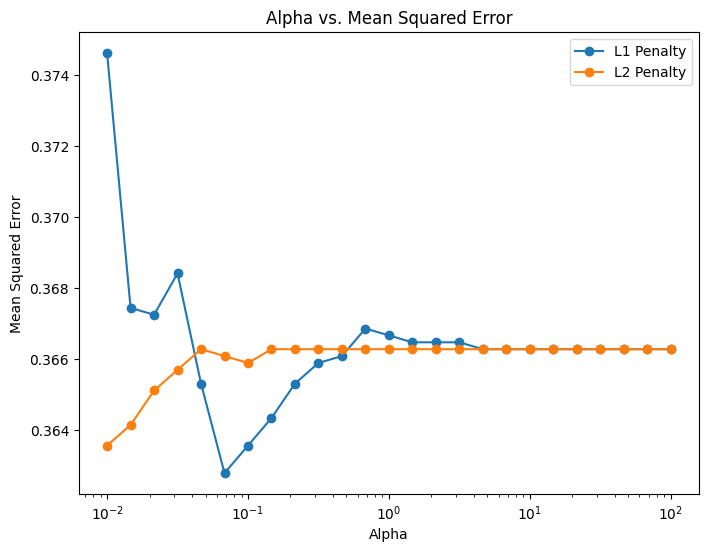

In [ ]:
#GRID SEARCH FOR BEST REGULARIZATION
from sklearn.model_selection import cross_val_score

np.random.seed(78)

alpha_min = 0.01
alpha_max = 100
num_alphas = 25  # The number of alpha vals

# Generate the alpha values using np.logspace
alphas = np.logspace(np.log10(alpha_min), np.log10(alpha_max), num_alphas)

# Lists to store mean MSE scores for L1 and L2
mean_mse_scores_l1 = []
mean_mse_scores_l2 = []

# Convert the selected features to a DataFrame
X_train_selected = X_train_resampled[selected_LR_features]

for alpha in alphas:
    # L1 penalty
    log_reg_l1 = LogisticRegression(penalty='l1', C=alpha, solver='liblinear')
    mse_scores_l1 = -cross_val_score(log_reg_l1, X_train_selected, y_train_resampled, cv=10, scoring='neg_mean_squared_error')
    mean_mse_l1 = np.mean(mse_scores_l1)
    mean_mse_scores_l1.append((alpha, mean_mse_l1))

    # L2 penalty
    log_reg_l2 = LogisticRegression(penalty='l2', C=alpha, solver='liblinear')
    mse_scores_l2 = -cross_val_score(log_reg_l2, X_train_selected, y_train_resampled, cv=10, scoring='neg_mean_squared_error')
    mean_mse_l2 = np.mean(mse_scores_l2)
    mean_mse_scores_l2.append((alpha, mean_mse_l2))

# Find the best alpha values for both L1 and L2
best_alpha_l1 = min(mean_mse_scores_l1, key=lambda x: x[1])
best_alpha_l2 = min(mean_mse_scores_l2, key=lambda x: x[1])

print('Best alpha for L1 penalty:', best_alpha_l1)
print('Best alpha for L2 penalty:', best_alpha_l2)

# Plot resultt
alphas_l1, mse_values_l1 = zip(*mean_mse_scores_l1)
alphas_l2, mse_values_l2 = zip(*mean_mse_scores_l2)

plt.figure(figsize=(8, 6))
plt.semilogx(alphas_l1, mse_values_l1, marker='o', linestyle='-', label='L1 Penalty')
plt.semilogx(alphas_l2, mse_values_l2, marker='o', linestyle='-', label='L2 Penalty')
plt.title('Alpha vs. Mean Squared Error')
plt.xlabel('Alpha')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.show()

In [ ]:
# Training logistic regression model
#we used the ridge regression method
log_reg = LogisticRegression(penalty='l1', C=0.068129, solver='liblinear')
log_reg.fit(X_train_selected, y_train_resampled)

LogisticRegression(C=0.068129, penalty='l1', solver='liblinear')

In [ ]:
(X_train_selected.shape)

(5160, 26)

TRAINING SET ----------------------------------------------------------
Confusion Matrix:
[[1650  930]
 [ 905 1675]]

Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.64      0.64      2580
           1       0.64      0.65      0.65      2580

    accuracy                           0.64      5160
   macro avg       0.64      0.64      0.64      5160
weighted avg       0.64      0.64      0.64      5160


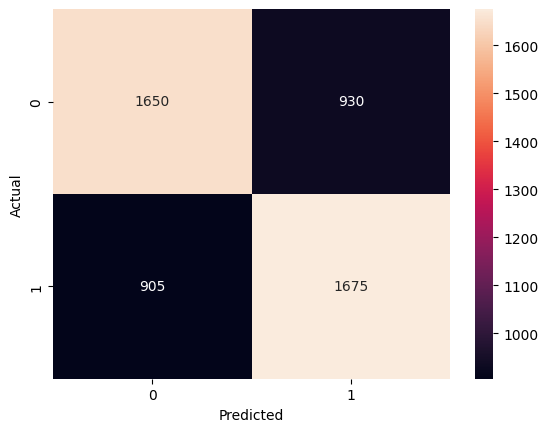

Test ROC-AUC: 0.6963


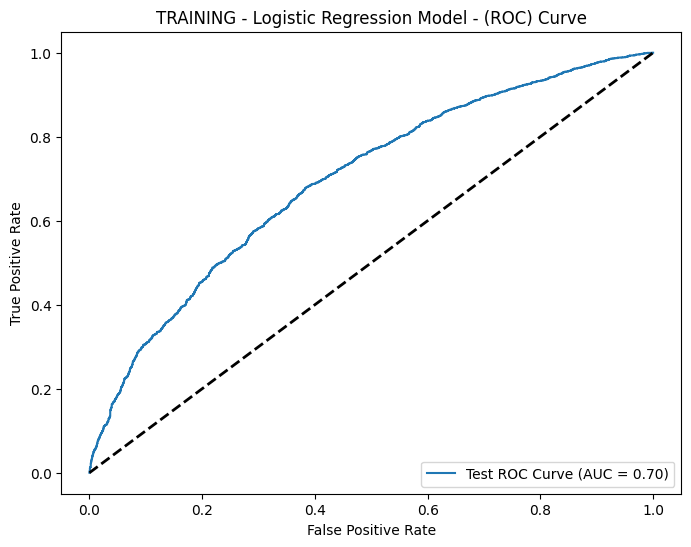

TEST SET --------------------------------------------------------------
Confusion Matrix:
[[743 500]
 [105 225]]

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.60      0.71      1243
           1       0.31      0.68      0.43       330

    accuracy                           0.62      1573
   macro avg       0.59      0.64      0.57      1573
weighted avg       0.76      0.62      0.65      1573


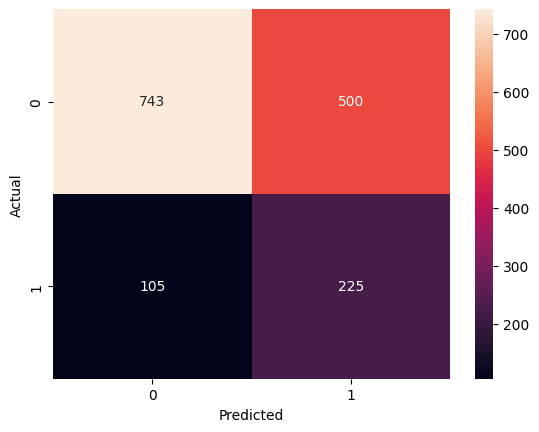

Test ROC-AUC: 0.6922


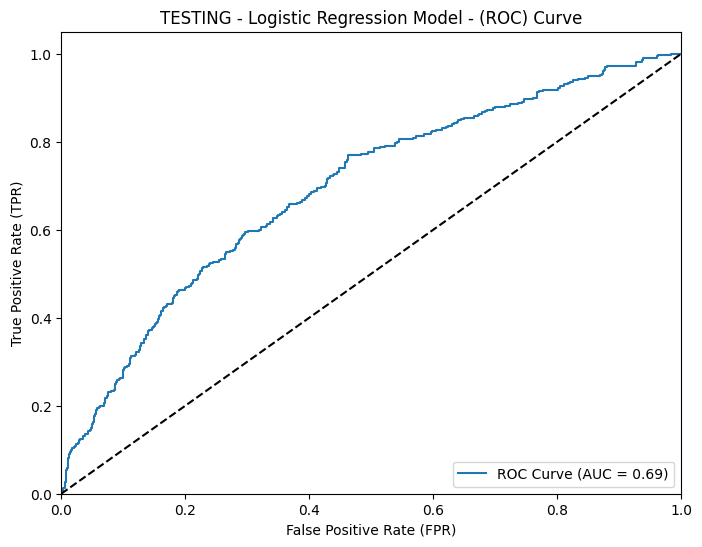

In [ ]:
# FINAL DATASETS - FOR CROSS SECTIONAL: X_train_resampled, X_test_scaled_df, y_train_resampled, y_test
from sklearn.metrics import roc_curve, roc_auc_score

# Convert the selected features to a DataFrame
X_train_selected = X_train_resampled[selected_LR_features]

# Convert the selected features to a DataFrame
X_test_selected = X_test_scaled_df[selected_LR_features]

# Predictive Ability - TRAINING SET ============================================
print("TRAINING SET ----------------------------------------------------------")

# Use the model to make predictions on the training data
y_pred_train_proba_LR = log_reg.predict_proba(X_train_selected)[:, 1]  # probability of 1 (outcome)

# Apply the new threshold
threshold = 0.5
y_pred = (y_pred_train_proba_LR >= threshold).astype(int)

# Evaluate the model
conf_matrix = confusion_matrix(y_train_resampled, y_pred)
class_report = classification_report(y_train_resampled, y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

# Visualizing confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# Calculate ROC-AUC on the train set
roc_auc_train_LR = roc_auc_score(y_train_resampled, y_pred_train_proba_LR)
print(f"Test ROC-AUC: {roc_auc_train_LR:.4f}")

# Calculate ROC curve on the train set
fpr_LR, tpr_LR, _ = roc_curve(y_train_resampled, y_pred_train_proba_LR)

# Plot ROC curve for the train set
plt.figure(figsize=(8, 6))
plt.plot(fpr_LR, tpr_LR, label=f'Test ROC Curve (AUC = {roc_auc_train_LR:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('TRAINING - Logistic Regression Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Predictive Ability - TEST SET ================================================
print("TEST SET --------------------------------------------------------------")

# Use the model to make predictions on the testing data
y_pred_test_proba_LR = log_reg.predict_proba(X_test_selected)[:, 1]  # probability of 1 (outcome)

# Apply the new threshold
threshold = 0.5
y_pred = (y_pred_test_proba_LR >= threshold).astype(int)

# Evaluate the model
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

# Visualizing confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


# Calculate ROC-AUC on the train set
roc_auc_test_LR = roc_auc_score(y_test, y_pred_test_proba_LR)
print(f"Test ROC-AUC: {roc_auc_test_LR:.4f}")

# Visualizing ROC at the new probability threshold
fpr_LR_T, tpr_LR_T, thresholds = roc_curve(y_test, y_pred_test_proba_LR)
roc_auc = roc_auc_score(y_test, y_pred_test_proba_LR)
# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_LR_T, tpr_LR_T, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Plot diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('TESTING - Logistic Regression Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

## Section E2 Naive Bayes Model

In [ ]:
# FINAL DATASETS - FOR CROSS SECTIONAL: X_train_resampled, X_test_scaled_df, y_train_resampled, y_test

In [ ]:
import copy
# Make copies of the datasets
X_train_resampled_copy = copy.deepcopy(X_train_resampled)
X_test_scaled_df_copy = copy.deepcopy(X_test_scaled_df)
y_train_resampled_copy = copy.deepcopy(y_train_resampled)
y_test_copy = copy.deepcopy(y_test)

In [ ]:
# Merge X and y for the test set
train_merged = pd.concat([X_train_resampled_copy, y_train_resampled_copy], axis=1)

# Resetting indices before concatenation for the test set
X_test_scaled_df_copy_reset = X_test_scaled_df_copy.reset_index(drop=True)
y_test_copy_reset = y_test_copy.reset_index(drop=True)

# Merge X and y for the test set
test_merged = pd.concat([X_test_scaled_df_copy_reset, y_test_copy_reset], axis=1)



In [ ]:
# Convert negative values to 0 and positive values to 1 in the training set
train_merged[binary_columns] = (train_merged[binary_columns] > 0).astype(int)

# Convert negative values to 0 and positive values to 1 in the test set
test_merged[binary_columns] = (test_merged[binary_columns] > 0).astype(int)


In [ ]:
def get_scores(Y, Y_pred):
    """
    Computes various evaluation metrics for model predictions.

    Parameters:
    - Y: Actual target values.
    - Y_pred: Predicted target values by the model.

    Returns:
    - conf_matrix: Confusion matrix showing true positives, true negatives, false positives, and false negatives.
    - class_report: Classification report detailing precision, recall, and F1-score for each class.
    - auc: Area Under the Curve (AUC) value for the model's predictions.
    - acc: Accuracy of the model's predictions.
    """
    conf_matrix = confusion_matrix(Y, Y_pred)
    class_report = classification_report(Y, Y_pred)
    auc = roc_auc_score(Y, Y_pred)
    acc = accuracy_score(Y, Y_pred)

    return conf_matrix, class_report, auc, acc

def print_scores(conf_matrix, class_report, auc, acc):
    """
    Prints the evaluation metrics in a structured format.

    Parameters:
    - conf_matrix: Confusion matrix from get_scores function.
    - class_report: Classification report from get_scores function.
    - auc: AUC value from get_scores function.
    - acc: Accuracy value from get_scores function.
    """
    print('AUC : ', auc)
    print('Accuracy : ', acc)
    print("Confusion Matrix:")
    print(conf_matrix)
    print("\nClassification Report:")
    print(class_report)

AUC :  0.6519379844961241
Accuracy :  0.6519379844961241
Confusion Matrix:
[[1734  846]
 [ 950 1630]]

Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.67      0.66      2580
           1       0.66      0.63      0.64      2580

    accuracy                           0.65      5160
   macro avg       0.65      0.65      0.65      5160
weighted avg       0.65      0.65      0.65      5160


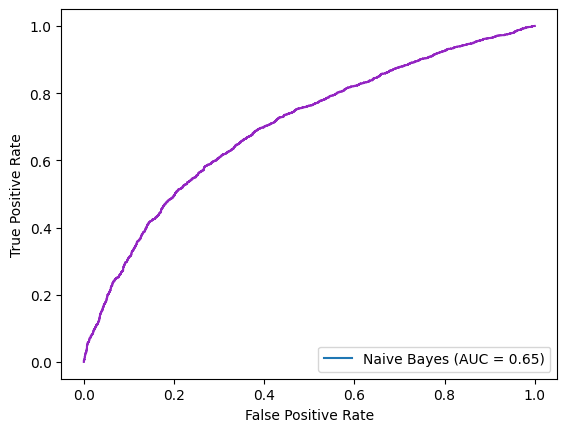

In [ ]:
from sklearn.naive_bayes import GaussianNB, CategoricalNB, MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, RocCurveDisplay
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, accuracy_score

# Train a Gaussian Naive Bayes model for numerical columns
gnb = GaussianNB()
gnb = gnb.fit(train_merged[numeric_columns].to_numpy(), train_merged[label_column])

# Train a Categorical Naive Bayes model for categorical columns
cnb = CategoricalNB()
cnb = cnb.fit(train_merged[binary_columns].to_numpy(), train_merged[label_column])

# Get joint log probabilities for each model
gnb_log_pred = gnb.predict_log_proba(train_merged[numeric_columns])
cnb_log_pred = cnb.predict_log_proba(train_merged[binary_columns])

# Combine the log probabilities, adjusting for the multiplication of P(Y) term
y_hat_prob = gnb_log_pred + cnb_log_pred

# Convert log probabilities back to probabilities
y_hat_prob = np.exp(y_hat_prob)
y_hat_prob = y_hat_prob / y_hat_prob.sum(1, keepdims=True)  # normalize to get valid probabilities

# Get the predicted class labels
y_hat = np.argmax(y_hat_prob, axis=1)

# Evaluate the combined model using custom functions
conf_matrix, class_report, auc, acc = get_scores(train_merged[label_column], y_hat)
print_scores(conf_matrix, class_report, auc, acc)

# Plot the ROC curve
fpr, tpr, thresholds = roc_curve(train_merged[label_column], y_hat_prob[:, 1])
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc, estimator_name='Naive Bayes')
display.plot()
ax = plt.gca()
ax.get_lines()[0].set_color('#9325c2')


y_pred_train_proba_NB = y_hat_prob
roc_auc_train_NB = roc_auc
fpr_NB = fpr
tpr_NB = tpr

In [ ]:
# Check for missing values in numeric columns
missing_numeric = test_merged[numeric_columns].isnull().sum()
print("Missing values in numeric columns:")
print(missing_numeric[missing_numeric > 0])

# Check for missing values in binary columns
missing_binary = test_merged[binary_columns].isnull().sum()
print("Missing values in binary columns:")
print(missing_binary[missing_binary > 0])


Missing values in numeric columns:
Series([], dtype: int64)
Missing values in binary columns:
Series([], dtype: int64)


AUC :  0.6412845266827568
Accuracy :  0.645899554990464
Confusion Matrix:
[[807 436]
 [121 209]]

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.65      0.74      1243
           1       0.32      0.63      0.43       330

    accuracy                           0.65      1573
   macro avg       0.60      0.64      0.59      1573
weighted avg       0.76      0.65      0.68      1573


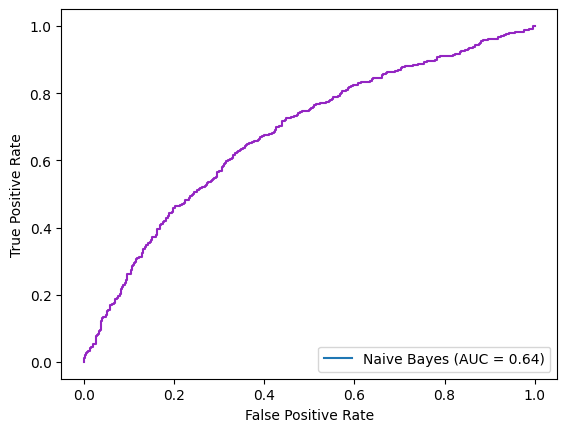

In [ ]:
# Predict the joint log probabilities for each model on the test set
gnb_log_pred = gnb.predict_log_proba(test_merged[numeric_columns])
cnb_log_pred = cnb.predict_log_proba(test_merged[binary_columns])

# Combine the log probabilities, adjusting for the multiplication of P(Y) term
y_hat_prob = gnb_log_pred + cnb_log_pred

# Convert log probabilities back to probabilities
y_hat_prob = np.exp(y_hat_prob)
y_hat_prob = y_hat_prob / y_hat_prob.sum(1, keepdims=True)  # normalize to get valid probabilities

# Get the predicted class labels for the test set
y_hat_test = np.argmax(y_hat_prob, axis=1)

# Evaluate the combined model on the test set using custom functions
conf_matrix_test, class_report_test, auc_test, acc_test = get_scores(test_merged[label_column], y_hat_test)
print_scores(conf_matrix_test, class_report_test, auc_test, acc_test)

# Plot the ROC curve for the test set
fpr_test, tpr_test, thresholds_test = roc_curve(test_merged[label_column], y_hat_prob[:, 1])
display_test = RocCurveDisplay(fpr=fpr_test, tpr=tpr_test, roc_auc=auc_test, estimator_name='Naive Bayes')
display_test.plot()
ax_test = plt.gca()
ax_test.get_lines()[0].set_color('#9325c2')


y_pred_test_proba_NB = y_hat_prob
roc_auc_test_NB = auc_test
fpr_NB_T = fpr_test
tpr_NB_T = tpr_test

## Section E3 - Random Forest with SFM

In [ ]:
# FINAL DATASETS - FOR CROSS SECTIONAL: X_train_resampled, X_test_scaled_df, y_train_resampled, y_test

In [ ]:
!pip install category_encoders

import pandas as pd
import numpy as np
import warnings
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
import scipy.stats as stats
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay, auc, roc_curve
from sklearn.metrics import roc_auc_score, accuracy_score
import plotly.express as px
from category_encoders import OneHotEncoder, TargetEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV


from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import accuracy_score

warnings.filterwarnings('ignore')

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel

# Create Random Forest classifier object
rf_model = RandomForestClassifier()

# Fit Random Forest model to get feature importances
rf_model.fit(X_train_resampled, y_train_resampled)

# Create SelectFromModel object using the trained Random Forest model
sfm_rf = SelectFromModel(rf_model, threshold='mean')  # You can adjust the threshold as needed

# Transform the training data to select features
X_train_selected_rf = sfm_rf.transform(X_train_resampled)

# Print the selected features
sub_features = X_train_resampled.columns[sfm_rf.get_support()]
print("Selected Features - Random Forest:")
print(sub_features)

Selected Features - Random Forest:
Index(['Diabetes', 'OA', 'Sex', 'HTRX_HYDROCHLOROTHIAZIDE', 'HTRX_RAMIPRIL',
       'CSRX_HYDROCORTISONE', 'Diabetes_YRS', 'HTN_YRS', 'OA_YRS',
       'Age_at_Exam', 'sBP', 'BMI', 'LDL', 'HDL', 'A1c', 'TG'],
      dtype='object')


In [ ]:
#update number of features for X training and test sets
# FINAL DATASETS Y - FOR CROSS SECTIONAL: y_train_resampled, y_test
X_train_RF_selected = X_train_resampled[sub_features]
X_test_RF_selected = X_test_scaled_df[sub_features]

In [ ]:
# Initialize a Random Forest classifier
# The criterion 'entropy' measures the quality of a split by how mixed the classes are in two groups
# class_weight NONE since we already re-balanced classes
# oob_score is set to True to use out-of-bag samples to estimate the generalization accuracy
random_forest = RandomForestClassifier(criterion='entropy', class_weight=None, oob_score=True)

# Creating a pipeline which first applies the column transformer preprocessing, then fits the Random Forest model
model = Pipeline([
    ('random_forest', random_forest)
])


RF_model = model.fit(X_train_RF_selected, y_train_resampled)

# Predicting the target variable on the training set and evaluating the model's accuracy.
Y_pred = RF_model.predict(X_train_RF_selected)
print('accuracy score training')
print(accuracy_score(y_train_resampled, Y_pred))

# Predicting the target variable on the test set and evaluating the model's accuracy.
Y_pred = RF_model.predict(X_test_RF_selected)
print('accuracy score test')
print(accuracy_score(y_test, Y_pred))

accuracy score training
1.0
accuracy score test
0.7342657342657343


In [ ]:
# Calculate a combined score considering both performance and overfitting
k = 0.001  # Adjust this value based on the relative importance of overfitting reduction
results['combined_score'] = results['mean_test_score'] - k * (1 - results['mean_train_score'])

# Sorting results by the combined score
sorted_results = results.sort_values(by='combined_score', ascending=False)

# Print the best hyperparameters based on the combined score
best_params_combined = sorted_results.iloc[0]['params']
print("Best Hyperparameters considering both performance and overfitting:")
print(best_params_combined)

# Best Hyperparameters considering both performance and overfitting:
# {'max_depth': 14, 'max_features': 'auto', 'min_samples_leaf': 40, 'min_samples_split': 60, 'n_estimators': 200}

Best Hyperparameters considering both performance and overfitting:
{'max_depth': 14, 'max_features': 'auto', 'min_samples_leaf': 40, 'min_samples_split': 60, 'n_estimators': 200}


In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Best parameters obtained from the grid search
best_params = {
    'max_depth': 14,
    'max_features': 'auto',
    'min_samples_leaf': 40,
    'min_samples_split': 60,
    'n_estimators': 200
}

# Create a RandomForestClassifier instance
random_forest = RandomForestClassifier(criterion='entropy', oob_score=True)

# Set the best hyperparameters
random_forest.set_params(**best_params)

# Fit the model on your training data
RF2_model = random_forest.fit(X_train_RF_selected, y_train_resampled)

# Predicting the target variable on the training set and evaluating the model's accuracy.
Y_pred_train = RF2_model.predict(X_train_RF_selected)
print('Accuracy score on training set:', accuracy_score(y_train_resampled, Y_pred_train))

# Predicting the target variable on the test set and evaluating the model's accuracy.
Y_pred_test = RF2_model.predict(X_test_RF_selected)
print('Accuracy score on test set:', accuracy_score(y_test, Y_pred_test))


Accuracy score on training set: 0.748062015503876
Accuracy score on test set: 0.6865861411315957


TRAINING SET ----------------------------------------------------------
Confusion Matrix:
[[2037  543]
 [ 757 1823]]

Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.79      0.76      2580
           1       0.77      0.71      0.74      2580

    accuracy                           0.75      5160
   macro avg       0.75      0.75      0.75      5160
weighted avg       0.75      0.75      0.75      5160


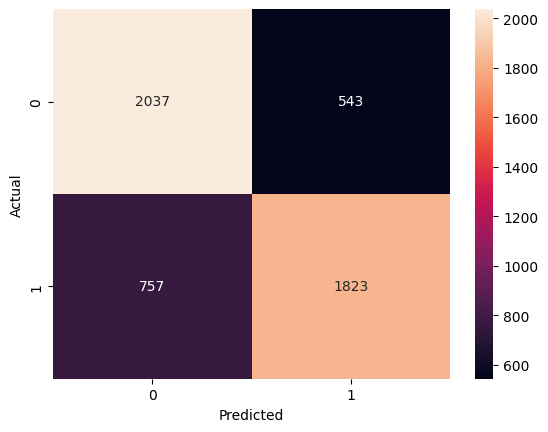

Test ROC-AUC: 0.8343


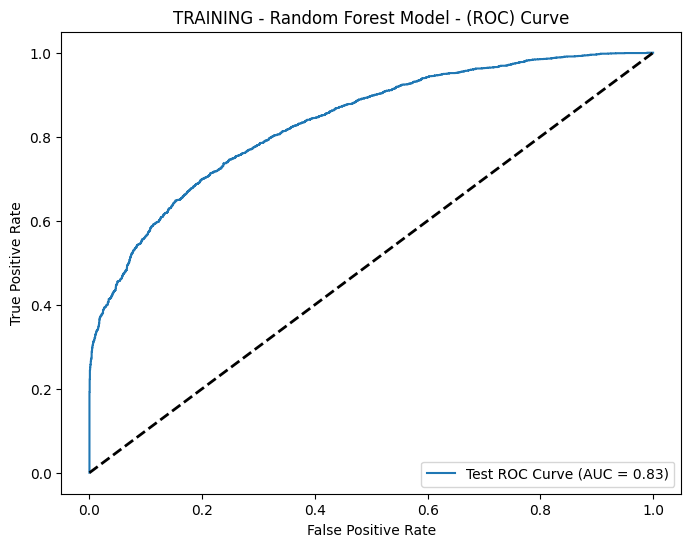

TEST SET --------------------------------------------------------------
Confusion Matrix:
[[901 342]
 [151 179]]

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.72      0.79      1243
           1       0.34      0.54      0.42       330

    accuracy                           0.69      1573
   macro avg       0.60      0.63      0.60      1573
weighted avg       0.75      0.69      0.71      1573


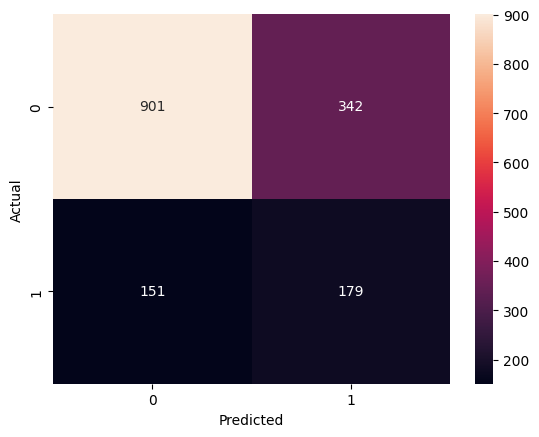

Test ROC-AUC: 0.6889


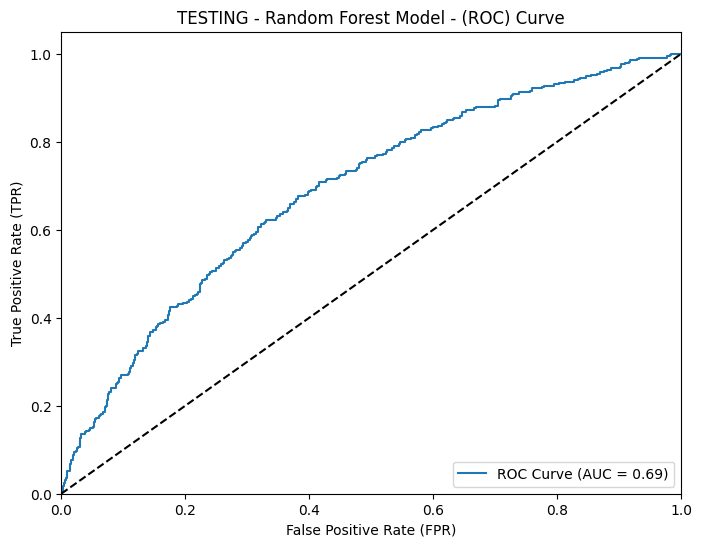

In [ ]:

from sklearn.metrics import roc_curve, roc_auc_score

# FINAL DATASETS Y - FOR CROSS SECTIONAL: X_train_RF_selected, X_test_RF_selected, y_train_resampled, y_test

# Predictive Ability - TRAINING SET ============================================
print("TRAINING SET ----------------------------------------------------------")

# Use the model to make predictions on the training data
y_pred_train_proba_RF = RF2_model.predict_proba(X_train_RF_selected)[:, 1]  # probability of 1 (outcome)

# Apply the new threshold
threshold = 0.5
y_pred = (y_pred_train_proba_RF >= threshold).astype(int)

# Evaluate the model
conf_matrix = confusion_matrix(y_train_resampled, y_pred)
class_report = classification_report(y_train_resampled, y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

# Visualizing confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# Calculate ROC-AUC on the train set
roc_auc_train_RF = roc_auc_score(y_train_resampled, y_pred_train_proba_RF)
print(f"Test ROC-AUC: {roc_auc_train_RF:.4f}")

# Calculate ROC curve on the train set
fpr_RF, tpr_RF, _ = roc_curve(y_train_resampled, y_pred_train_proba_RF)

# Plot ROC curve for the train set
plt.figure(figsize=(8, 6))
plt.plot(fpr_RF, tpr_RF, label=f'Test ROC Curve (AUC = {roc_auc_train_RF:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('TRAINING - Random Forest Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Predictive Ability - TEST SET ================================================
print("TEST SET --------------------------------------------------------------")

# Use the model to make predictions on the testing data
y_pred_test_proba_RF = RF2_model.predict_proba(X_test_RF_selected)[:, 1]  # probability of 1 (outcome)

# Apply the new threshold
threshold = 0.5
y_pred = (y_pred_test_proba_RF >= threshold).astype(int)

# Evaluate the model
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

# Visualizing confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


# Calculate ROC-AUC on the train set
roc_auc_test_RF = roc_auc_score(y_test, y_pred_test_proba_RF)
print(f"Test ROC-AUC: {roc_auc_test_RF:.4f}")

# Visualizing ROC at the new probability threshold
fpr_RF_T, tpr_RF_T, thresholds = roc_curve(y_test, y_pred_test_proba_RF)
roc_auc = roc_auc_score(y_test, y_pred_test_proba_RF)
# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_RF_T, tpr_RF_T, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Plot diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('TESTING - Random Forest Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

## Section E4 - ADA BOOST with SFM

In [ ]:
# FINAL DATASETS - FOR CROSS SECTIONAL: X_train_resampled, X_test_scaled_df, y_train_resampled, y_test

In [ ]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

# Define your base estimator (a decision tree stump)
base_estimator = DecisionTreeClassifier(max_depth=1)

# Create AdaBoost classifier object
adaboost_model = AdaBoostClassifier(
    base_estimator=base_estimator,
    n_estimators=50,
    learning_rate=1.0
)

# Fit AdaBoost model to get feature importances
adaboost_model.fit(X_train_resampled, y_train_resampled)

# Create SelectFromModel object using the trained AdaBoost model
sfm = SelectFromModel(adaboost_model, threshold='mean')  # You can adjust the threshold as needed

# Transform the training data to select features
X_train_selected = sfm.transform(X_train_resampled)

# Print the selected features
selected_features = X_train_resampled.columns[sfm.get_support()]
print("Selected Features:")
print(selected_features)

Selected Features:
Index(['Diabetes', 'HTN', 'OA', 'COPD', 'Sex', 'HTRX_FUROSEMIDE',
       'HTRX_HYDROCHLOROTHIAZIDE', 'HTRX_LOSARTAN', 'HTRX_RAMIPRIL',
       'HTRX_VALSARTAN', 'CSRX_HYDROCORTISONE', 'CSRX_METHYLPREDNISOLONE',
       'Med_Cluster_0', 'HTN_YRS', 'COPD_YRS', 'Age_at_Exam', 'sBP', 'BMI',
       'LDL', 'A1c', 'TG'],
      dtype='object')


In [ ]:
print(len(selected_features))

21


In [ ]:
#update number of features for X training and test sets
# FINAL DATASETS Y - FOR CROSS SECTIONAL: y_train_resampled, y_test
X_train_ADA_selected = X_train_resampled[selected_features]
X_test_ADA_selected = X_test_scaled_df[selected_features]

In [ ]:
from sklearn.model_selection import GridSearchCV

# Define your base estimator (a decision tree stump)
base_estimator = DecisionTreeClassifier(max_depth=1)

# Create AdaBoost classifier object
adaboost_model = AdaBoostClassifier(
    base_estimator=base_estimator,
    n_estimators=50,
    learning_rate=1.0
)

# Define the hyperparameter grid
param_dist = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.1, 0.5, 1.0]
}

# Use StratifiedKFold for cross-validation
cv_adaboost = StratifiedKFold(5)

# Create GridSearchCV object
grid_search_adaboost = GridSearchCV(
    estimator=adaboost_model,
    param_grid=param_dist,
    cv=cv_adaboost,
    scoring='accuracy',  # Use an appropriate scoring metric
)

# Fit GridSearchCV on your data
grid_search_adaboost.fit(X_train_ADA_selected, y_train_resampled)

# Extracting the results of the Grid Search into a DataFrame for analysis
results_adaboost = pd.DataFrame(grid_search_adaboost.cv_results_)

# Display the best hyperparameters
print("Best Hyperparameters:")
print(grid_search_adaboost.best_params_)
#1 min 6 sec

# Best Hyperparameters:
# {'learning_rate': 1.0, 'n_estimators': 150}

Best Hyperparameters:
{'learning_rate': 1.0, 'n_estimators': 150}


In [ ]:
# Best parameters obtained from the grid search
best_params_adaboost = {
    'learning_rate': 1.0,
    'n_estimators': 150
}

# Define your base estimator (a decision tree stump)
base_estimator = DecisionTreeClassifier(max_depth=1)

# Create AdaBoost classifier instance
adaboost_model_best = AdaBoostClassifier(
    base_estimator=base_estimator,
    **best_params_adaboost
)

# Fit the model on your training data
adaboost_model_best.fit(X_train_ADA_selected, y_train_resampled)

# Predicting the target variable on the training set and evaluating the model's accuracy.
Y_pred_train_adaboost = adaboost_model_best.predict(X_train_ADA_selected)
print('Accuracy score on training set:', accuracy_score(y_train_resampled, Y_pred_train_adaboost))

# Predicting the target variable on the test set and evaluating the model's accuracy.
Y_pred_test_adaboost = adaboost_model_best.predict(X_test_ADA_selected)
print('Accuracy score on test set:', accuracy_score(y_test, Y_pred_test_adaboost))

Accuracy score on training set: 0.7401162790697674
Accuracy score on test set: 0.7012078830260648


TRAINING SET ----------------------------------------------------------
Confusion Matrix:
[[2031  549]
 [ 792 1788]]

Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.79      0.75      2580
           1       0.77      0.69      0.73      2580

    accuracy                           0.74      5160
   macro avg       0.74      0.74      0.74      5160
weighted avg       0.74      0.74      0.74      5160


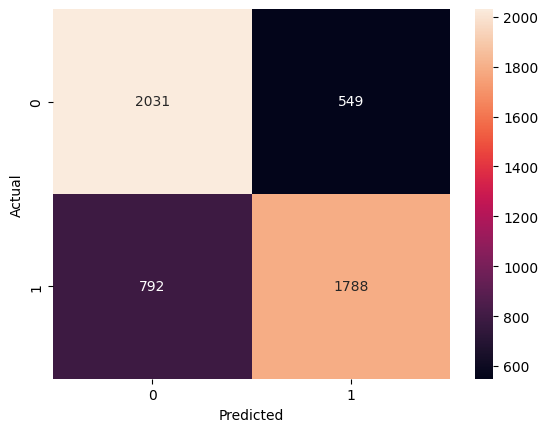

Test ROC-AUC: 0.8257


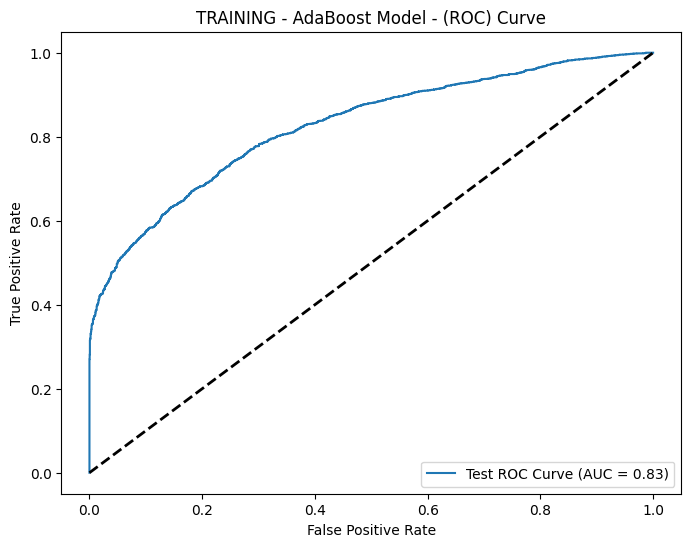

TEST SET --------------------------------------------------------------
Confusion Matrix:
[[937 306]
 [164 166]]

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.75      0.80      1243
           1       0.35      0.50      0.41       330

    accuracy                           0.70      1573
   macro avg       0.60      0.63      0.61      1573
weighted avg       0.75      0.70      0.72      1573


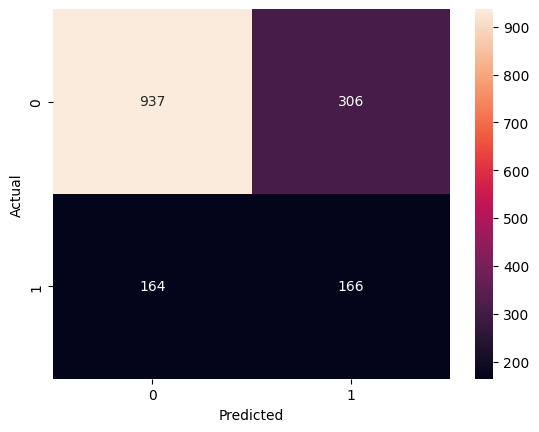

Test ROC-AUC: 0.6827


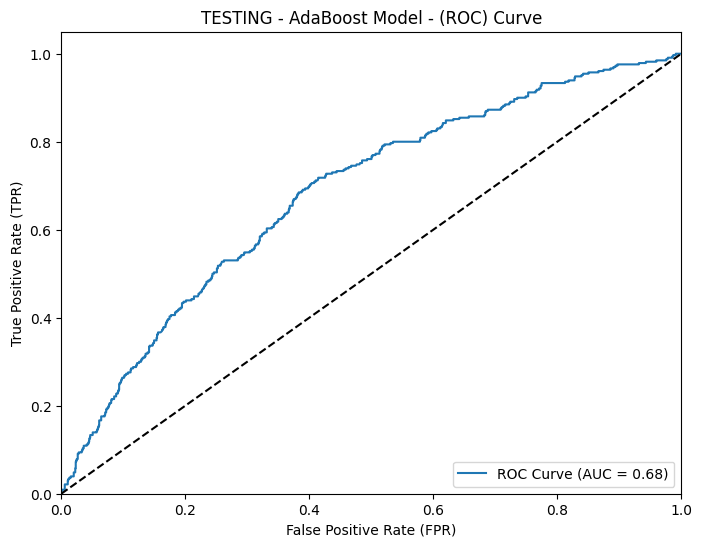

In [ ]:
# FINAL DATASETS Y - FOR CROSS SECTIONAL: X_train_ADA_selected, X_test_ADA_selected, y_train_resampled, y_test

# Predictive Ability - TRAINING SET ============================================
print("TRAINING SET ----------------------------------------------------------")

# Use the model to make predictions on the training data
y_pred_train_proba_ADA = adaboost_model_best.predict_proba(X_train_ADA_selected)[:, 1]  # probability of 1 (outcome)

# Apply the new threshold
threshold = 0.5
y_pred = (y_pred_train_proba_ADA >= threshold).astype(int)

# Evaluate the model
conf_matrix = confusion_matrix(y_train_resampled, y_pred)
class_report = classification_report(y_train_resampled, y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

# Visualizing confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# Calculate ROC-AUC on the train set
roc_auc_train_ADA = roc_auc_score(y_train_resampled, y_pred_train_proba_ADA)
print(f"Test ROC-AUC: {roc_auc_train_ADA:.4f}")

# Calculate ROC curve on the train set
fpr_ADA, tpr_ADA, _ = roc_curve(y_train_resampled, y_pred_train_proba_ADA)

# Plot ROC curve for the train set
plt.figure(figsize=(8, 6))
plt.plot(fpr_ADA, tpr_ADA, label=f'Test ROC Curve (AUC = {roc_auc_train_ADA:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('TRAINING - AdaBoost Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Predictive Ability - TEST SET ================================================
print("TEST SET --------------------------------------------------------------")

# Use the model to make predictions on the testing data
y_pred_test_proba_ADA = adaboost_model_best.predict_proba(X_test_ADA_selected)[:, 1]  # probability of 1 (outcome)

# Apply the new threshold
threshold = 0.5
y_pred = (y_pred_test_proba_ADA >= threshold).astype(int)

# Evaluate the model
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

# Visualizing confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


# Calculate ROC-AUC on the train set
roc_auc_test_ADA = roc_auc_score(y_test, y_pred_test_proba_ADA)
print(f"Test ROC-AUC: {roc_auc_test_ADA:.4f}")

# Visualizing ROC at the new probability threshold
fpr_ADA_T, tpr_ADA_T, thresholds = roc_curve(y_test, y_pred_test_proba_ADA)
roc_auc = roc_auc_score(y_test, y_pred_test_proba_ADA)
# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_ADA_T, tpr_ADA_T, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Plot diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('TESTING - AdaBoost Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

## Section E5 - XG Boost with SFM

In [ ]:
from xgboost import XGBClassifier
from sklearn.feature_selection import SelectFromModel

# Create XGBoost classifier object
xgboost_model = XGBClassifier(
    n_estimators=50,
    learning_rate=0.1,  # You can adjust the learning rate as needed
    max_depth=3  # You can adjust the max depth as needed
)

# Fit XGBoost model to get feature importances
xgboost_model.fit(X_train_resampled, y_train_resampled)

# Create SelectFromModel object using the trained XGBoost model
sfm = SelectFromModel(xgboost_model, threshold='mean')  # You can adjust the threshold as needed

# Transform the training data to select features
X_train_selected = sfm.transform(X_train_resampled)

# Print the selected features
selected_features = X_train_resampled.columns[sfm.get_support()]
print("Selected Features:")
print(selected_features)


Selected Features:
Index(['Diabetes', 'HTN', 'OA', 'COPD', 'Sex', 'HTRX_ATENOLOL',
       'HTRX_BISOPROLOL', 'HTRX_FUROSEMIDE', 'HTRX_HYDROCHLOROTHIAZIDE',
       'HTRX_METOPROLOL', 'HTRX_NIFEDIPINE', 'HTRX_PERINDOPRIL',
       'HTRX_RAMIPRIL', 'CSRX_ANTIINFECTIVES', 'CSRX_HYDROCORTISONE',
       'CSRX_METHYLPREDNISOLONE', 'CSRX_PREDNISONE', 'Med_Cluster_0',
       'Med_Cluster_2', 'Med_Cluster_4', 'Diabetes_YRS', 'OA_YRS',
       'Age_at_Exam', 'sBP', 'BMI', 'HDL', 'A1c', 'TG'],
      dtype='object')


In [ ]:
print(len(selected_features))

28


In [ ]:
# Update number of features for X training and test sets
# FINAL DATASETS Y - FOR CROSS-SECTIONAL: y_train_resampled, y_test
X_train_XGB_selected = X_train_resampled[selected_features]
X_test_XGB_selected = X_test_scaled_df[selected_features]


In [ ]:
from sklearn.model_selection import StratifiedKFold, GridSearchCV

# Create XGBoost classifier object
xgboost_model = XGBClassifier()

# Define the hyperparameter grid
param_dist = {
    'n_estimators': [40, 60, 80],
    'learning_rate': [0.01, 0.05],
    'max_depth': [2, 3]
}

# Use StratifiedKFold for cross-validation
cv_xgboost = StratifiedKFold(n_splits=5)

# Create GridSearchCV object
grid_search_xgboost = GridSearchCV(
    estimator=xgboost_model,
    param_grid=param_dist,
    cv=cv_xgboost,
    scoring='accuracy',
)

# Fit GridSearchCV on your data
grid_search_xgboost.fit(X_train_XGB_selected, y_train_resampled)

# Extracting the results of the Grid Search into a DataFrame for analysis
results_xgboost = pd.DataFrame(grid_search_xgboost.cv_results_)

# Display the best hyperparameters
print("Best Hyperparameters:")
print(grid_search_xgboost.best_params_)

Best Hyperparameters:
{'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 80}


In [ ]:
from sklearn.metrics import accuracy_score

# Best parameters obtained from the grid search
best_params_xgboost = {
    'learning_rate': 0.05,
    'n_estimators': 80,
    'max_depth': 3
}

# Create XGBoost classifier instance
xgboost_model_best = XGBClassifier(
    **best_params_xgboost
)

# Fit the model on your training data
xgboost_model_best.fit(X_train_XGB_selected, y_train_resampled)

# Predicting the target variable on the training set and evaluating the model's accuracy.
Y_pred_train_xgboost = xgboost_model_best.predict(X_train_XGB_selected)
print('Accuracy score on training set:', accuracy_score(y_train_resampled, Y_pred_train_xgboost))

# Predicting the target variable on the test set and evaluating the model's accuracy.
Y_pred_test_xgboost = xgboost_model_best.predict(X_test_XGB_selected)
print('Accuracy score on test set:', accuracy_score(y_test, Y_pred_test_xgboost))


Accuracy score on training set: 0.7281007751937985
Accuracy score on test set: 0.7082008900190718


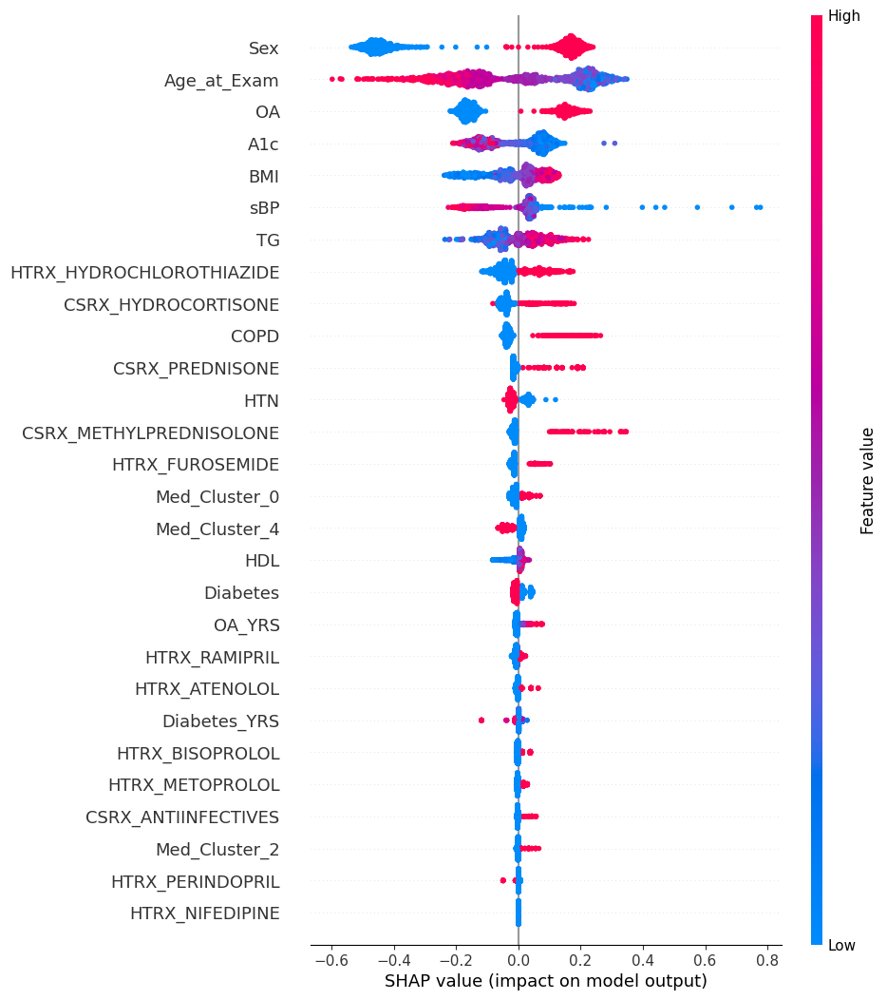

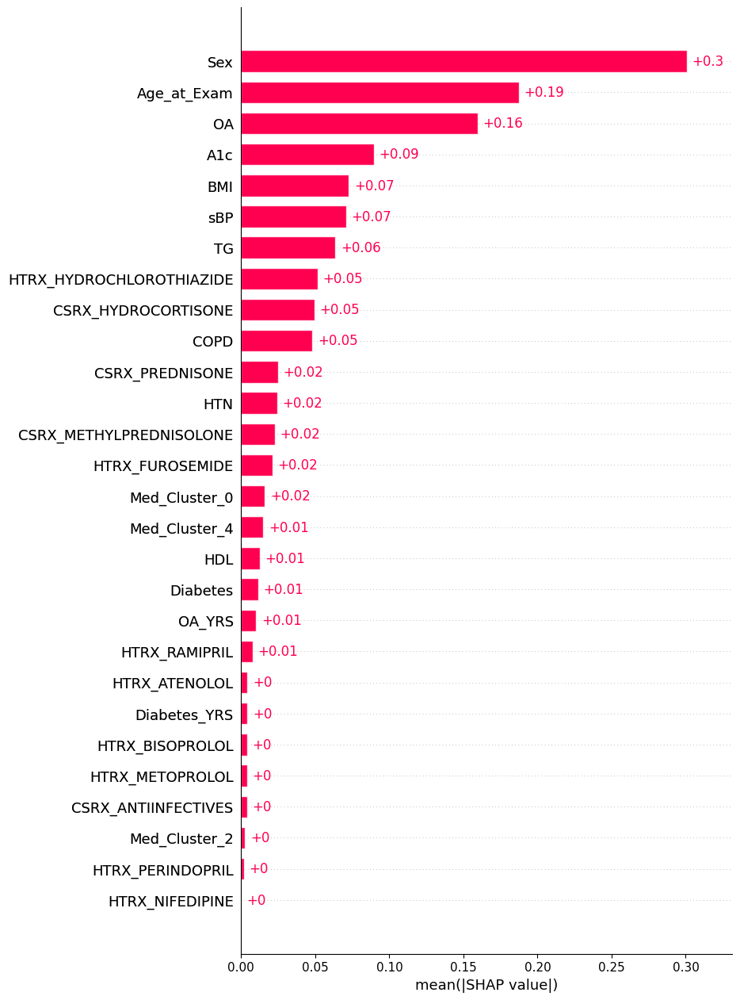

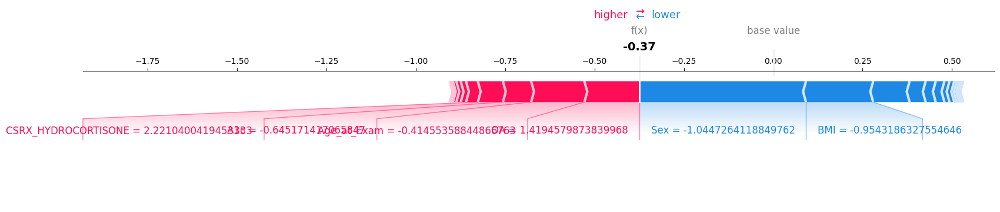

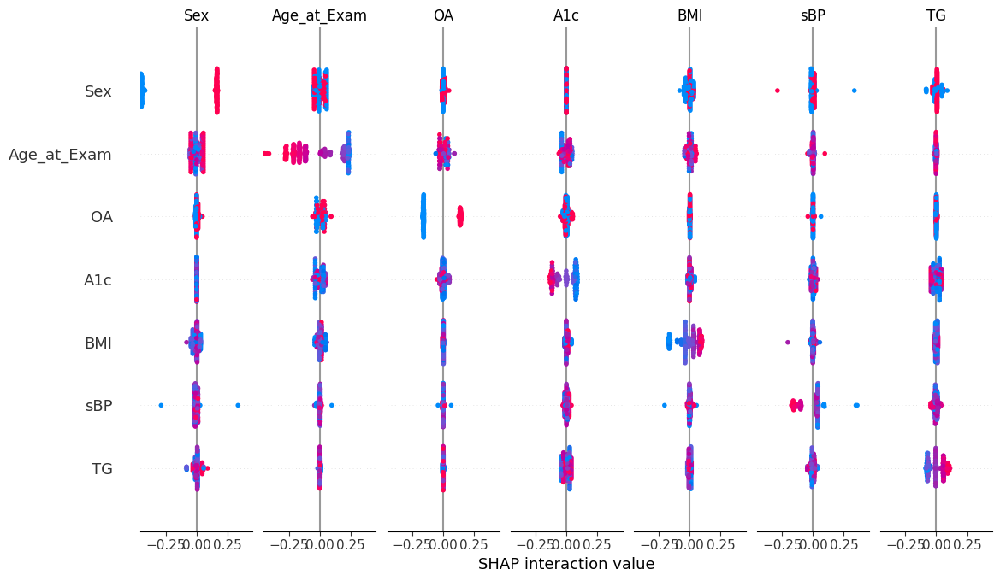

In [ ]:
import shap
import matplotlib.pyplot as plt


# SHAP
explainer = shap.Explainer(xgboost_model_best)
shap_values = explainer(X_test_XGB_selected)
shap.plots.beeswarm(shap_values, max_display=30)
shap.plots.bar(shap_values, max_display=30)
shap.plots.force(shap_values[0], matplotlib=True, show=True)  # Changed 'False' to 'True'
shap_interaction_values = explainer.shap_interaction_values(X_test_XGB_selected.iloc[:200, :])
shap.summary_plot(shap_interaction_values, X_test_XGB_selected.iloc[:200, :])
plt.show()  # Added this line to display the summary plot


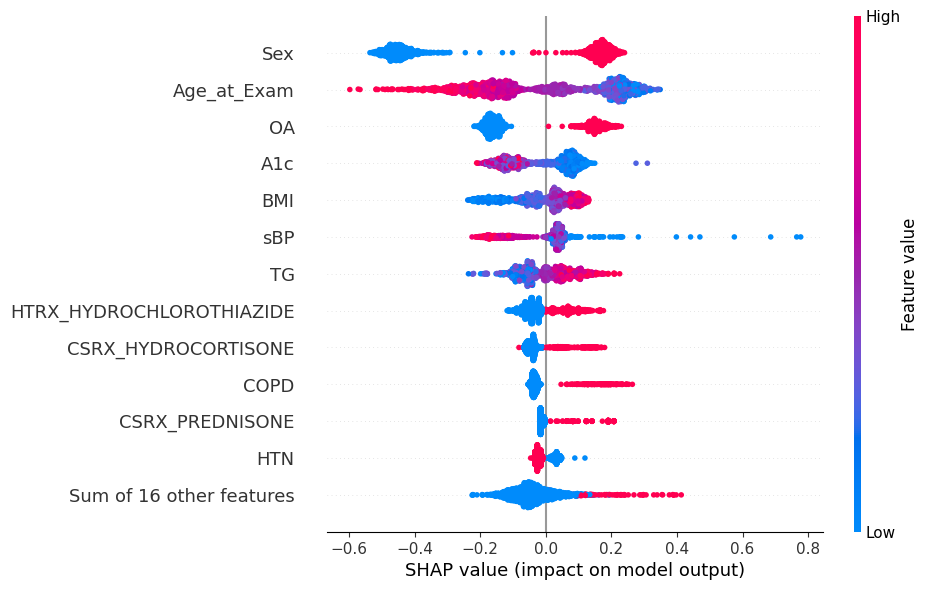

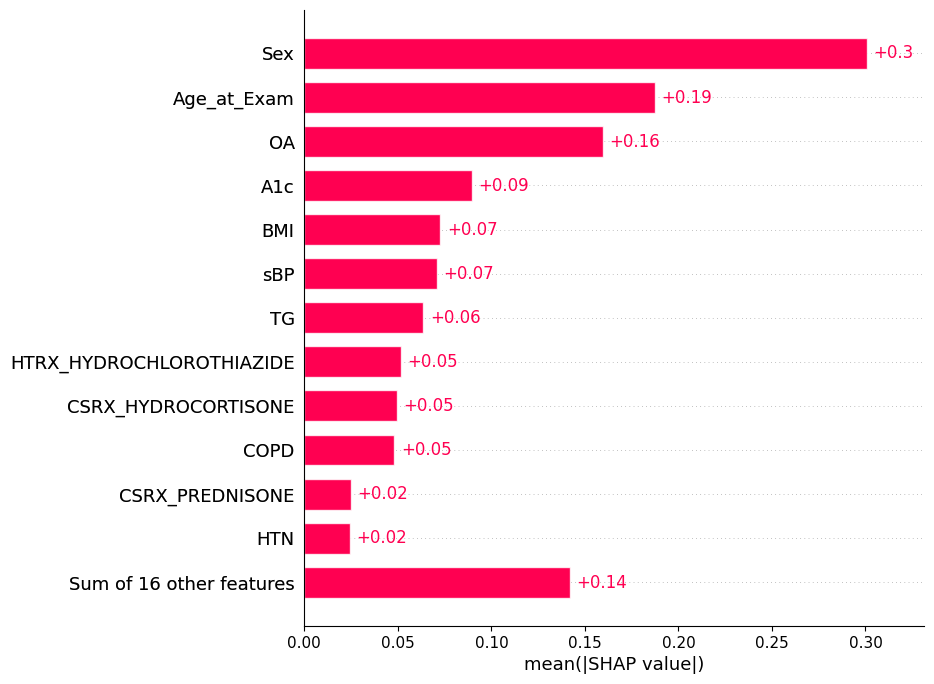

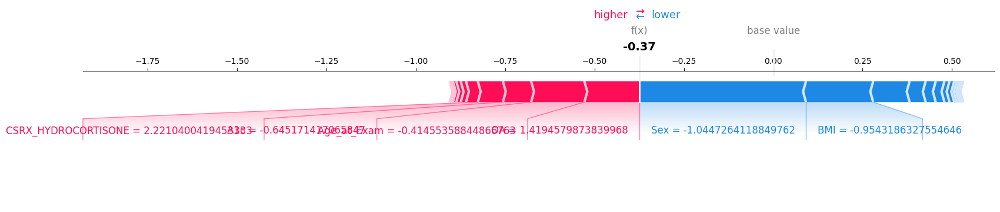

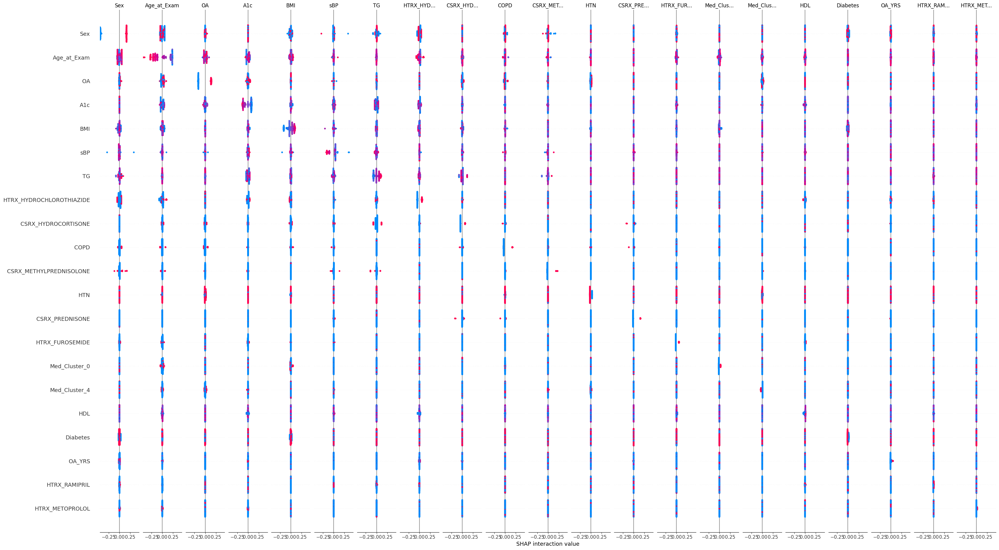

In [ ]:

# SHAP TOP 12

# SHAP
explainer = shap.Explainer(xgboost_model_best)
shap_values = explainer(X_test_XGB_selected)

# Display top 20 features in each plot
shap.plots.beeswarm(shap_values, max_display=13)
shap.plots.bar(shap_values, max_display=13)
shap.plots.force(shap_values[0], matplotlib=True, show=True)  # Changed 'False' to 'True'

# Display top 20 features in the summary plot
shap_interaction_values = explainer.shap_interaction_values(X_test_XGB_selected.iloc[:200, :])
shap.summary_plot(shap_interaction_values, X_test_XGB_selected.iloc[:200, :], max_display=21)

plt.show()  # Added this line to display the summary plot


TRAINING SET ----------------------------------------------------------
Confusion Matrix:
[[2048  532]
 [ 871 1709]]

Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.79      0.74      2580
           1       0.76      0.66      0.71      2580

    accuracy                           0.73      5160
   macro avg       0.73      0.73      0.73      5160
weighted avg       0.73      0.73      0.73      5160


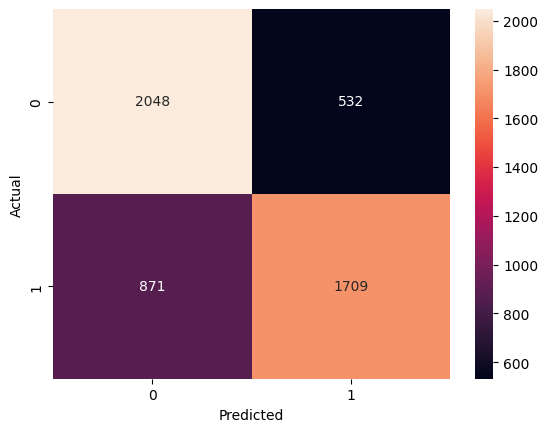

Test ROC-AUC: 0.8136


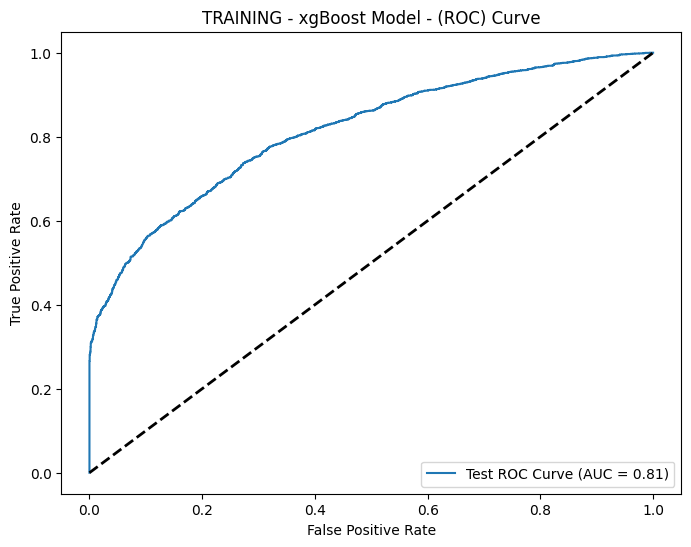

TEST SET --------------------------------------------------------------
Confusion Matrix:
[[940 303]
 [156 174]]

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.76      0.80      1243
           1       0.36      0.53      0.43       330

    accuracy                           0.71      1573
   macro avg       0.61      0.64      0.62      1573
weighted avg       0.75      0.71      0.73      1573


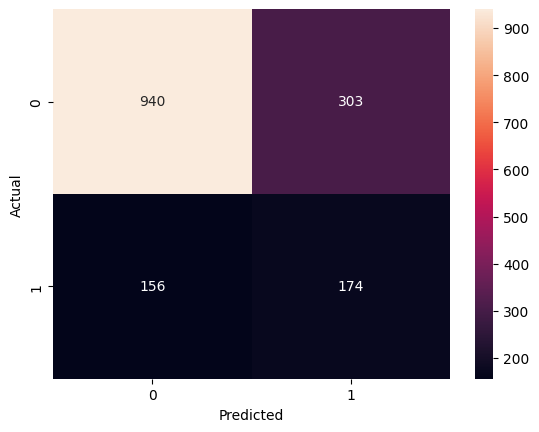

Test ROC-AUC: 0.6961


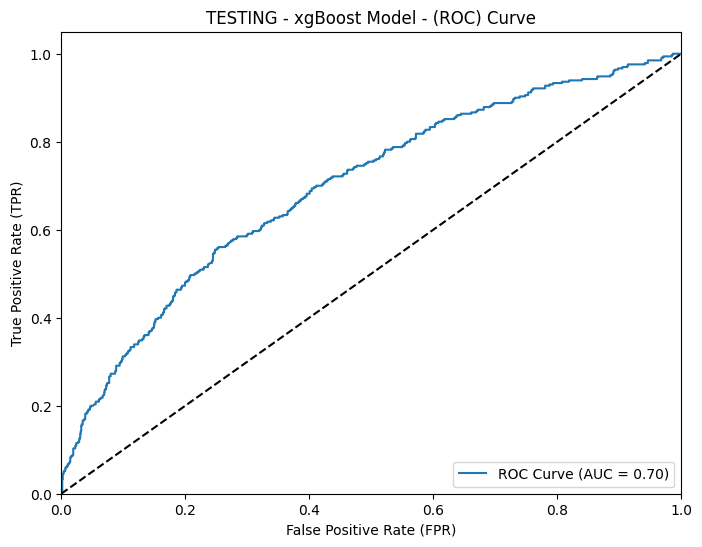

In [ ]:
# FINAL DATASETS Y - FOR CROSS SECTIONAL: X_train_XGB_selected, X_test_XGB_selected, y_train_resampled, y_test

# Predictive Ability - TRAINING SET ============================================
print("TRAINING SET ----------------------------------------------------------")

# Use the model to make predictions on the training data
y_pred_train_proba_KS = xgboost_model_best.predict_proba(X_train_XGB_selected)[:, 1]  # probability of 1 (outcome)

# Apply the new threshold
threshold = 0.5
y_pred = (y_pred_train_proba_KS >= threshold).astype(int)

# Evaluate the model
conf_matrix = confusion_matrix(y_train_resampled, y_pred)
class_report = classification_report(y_train_resampled, y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

# Visualizing confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# Calculate ROC-AUC on the train set
roc_auc_train_KS = roc_auc_score(y_train_resampled, y_pred_train_proba_KS)
print(f"Test ROC-AUC: {roc_auc_train_KS:.4f}")

# Calculate ROC curve on the train set
fpr_KS, tpr_KS, _ = roc_curve(y_train_resampled, y_pred_train_proba_KS)

# Plot ROC curve for the train set
plt.figure(figsize=(8, 6))
plt.plot(fpr_KS, tpr_KS, label=f'Test ROC Curve (AUC = {roc_auc_train_KS:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('TRAINING - xgBoost Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Predictive Ability - TEST SET ================================================
print("TEST SET --------------------------------------------------------------")

# Use the model to make predictions on the testing data
y_pred_test_proba_KS = xgboost_model_best.predict_proba(X_test_XGB_selected)[:, 1]  # probability of 1 (outcome)

# Apply the new threshold
threshold = 0.5
y_pred = (y_pred_test_proba_KS >= threshold).astype(int)

# Evaluate the model
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

# Visualizing confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


# Calculate ROC-AUC on the train set
roc_auc_test_KS = roc_auc_score(y_test, y_pred_test_proba_KS)
print(f"Test ROC-AUC: {roc_auc_test_KS:.4f}")

# Visualizing ROC at the new probability threshold
fpr_KS_T, tpr_KS_T, thresholds = roc_curve(y_test, y_pred_test_proba_KS)
roc_auc = roc_auc_score(y_test, y_pred_test_proba_KS)
# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_KS_T, tpr_KS_T, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Plot diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('TESTING - xgBoost Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


#SAVE TEST OUTPUTS
y_pred_train_proba_XGB = y_pred_train_proba_KS
roc_auc_train_XGB = roc_auc_train_KS
fpr_XGB = fpr_KS
tpr_XGB = tpr_KS
y_pred_test_proba_XGB = y_pred_test_proba_KS
roc_auc_test_XGB = roc_auc_test_KS
fpr_XGB_T = fpr_KS_T
tpr_XGB_T = tpr_KS_T

## Section E6 - Neural Networks

In [ ]:
# FINAL DATASETS - FOR CROSS SECTIONAL: X_train_resampled, X_test_scaled_df, y_train_resampled, y_test

In [ ]:
# importing PyTorch library as 't' for convenience
import torch as t

# importing other necessary libraries
import numpy as np
from torch.nn.functional import sigmoid, relu, tanh
from torch.optim import Adam
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
from torch.utils.data import TensorDataset, DataLoader

# importing PyTorch modules for building neural networks
from torch.nn import Tanh, Linear, Sequential, Sigmoid, Dropout

In [ ]:
(X_train_resampled.shape)

(5160, 67)

**Initializing NN Parameters**

In [ ]:
# Define the number of neurons in the first and second hidden layers
hidden_units_layer_1 = 15
hidden_units_layer_2 = 15
hidden_units_layer_3 = 15
hidden_units_layer_4 = 15

# FIRST LAYER: Define weights and biases for the first layer
W1 = t.randn((67, hidden_units_layer_1), requires_grad=True)
B1 = t.zeros((1, hidden_units_layer_1), requires_grad=True)

# SECOND LAYER: Define weights and biases for the second layer
W2 = t.randn((hidden_units_layer_1, hidden_units_layer_2), requires_grad=True)
B2 = t.zeros((1, hidden_units_layer_2), requires_grad=True)

# THIRD LAYER: Define weights and biases for the third layer
W3 = t.randn((hidden_units_layer_2, hidden_units_layer_3), requires_grad=True)
B3 = t.zeros((1, hidden_units_layer_3), requires_grad=True)

# 4th LAYER: Define weights and biases for the fourth layer
W4 = t.randn((hidden_units_layer_3, hidden_units_layer_4), requires_grad=True)
B4 = t.zeros((1, hidden_units_layer_4), requires_grad=True)

# 5th LAYER: Define weights and biases for the output layer
W5 = t.randn((hidden_units_layer_4, 1), requires_grad=True)
B5 = t.zeros((1, 1), requires_grad=True)

**Implementing the Forward Pass of NN**

In [ ]:
# Define the forward pass of the neural network
def forward(input):
    # First hidden layer with tanh activation
    out = tanh(input @ W1 + B1)

    # Second hidden layer with tanh activation
    out = tanh(out @ W2 + B2)

    # Third hidden layer with tanh activation
    out = tanh(out @ W3 + B3)

    # 4th hidden layer with tanh activation
    out = tanh(out @ W4 + B4)

    # Output layer with sigmoid activation (since it's a binary classification problem)
    out = sigmoid(out @ W5 + B5)
    return out

**Preparing Data and Training Utilities for NN Training**

In [ ]:
# Extract the target variable for training and testing
Y_train_NN = y_train_resampled.to_numpy()
Y_test_NN = y_test.to_numpy()

# Extract the features for training and testing
X_train_NN = X_train_resampled.to_numpy()
X_test_NN = X_test_scaled_df.to_numpy()

**Training Loop for the NN**

In [ ]:
import torch as t
import torch.nn as nn
from torch.optim import Adam
from torch.utils.data import DataLoader, TensorDataset

# Define your neural network architecture
class MyModel(nn.Module):
    def __init__(self, input_size, hidden_size1, hidden_size2, output_size):
        super(MyModel, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size1)
        self.relu1 = nn.ReLU()
        self.dropout1 = nn.Dropout(p=0.7)  # Adjust dropout probability as needed
        self.bn1 = nn.BatchNorm1d(hidden_size1)
        self.fc2 = nn.Linear(hidden_size1, hidden_size2)
        self.relu2 = nn.ReLU()
        self.dropout2 = nn.Dropout(p=0.7)
        self.bn2 = nn.BatchNorm1d(hidden_size2)
        self.fc3 = nn.Linear(hidden_size2, output_size)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.fc1(x)
        x = self.bn1(x)
        x = self.relu1(x)
        x = self.dropout1(x)
        x = self.fc2(x)
        x = self.bn2(x)
        x = self.relu2(x)
        x = self.dropout2(x)
        x = self.fc3(x)
        x = self.sigmoid(x)
        return x

# Convert the training data to PyTorch tensors
X = t.Tensor(X_train_NN).type(t.float32)
Y = t.Tensor(Y_train_NN).type(t.float32)

# Create a dataset from tensors to be used with DataLoader
train_dataset = TensorDataset(X, Y)

# Define training hyperparameters
input_size = X.shape[1]  # Adjust input size based on your data
hidden_size1 = 64  # Adjust as needed
hidden_size2 = 32  # Adjust as needed
output_size = 1  # Adjust as needed
epochs = 400
learning_rate = 0.001
batch_size = 100
weight_decay = 0.001  # Set your desired weight decay value

# DataLoader provides batches of data for training
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Create an instance of the model
model = MyModel(input_size, hidden_size1, hidden_size2, output_size)

# Define the optimizer (Adam) and include all weights and biases
optimizer = Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

# Define the loss function (Binary Cross-Entropy Loss)
loss_fn = nn.BCELoss()

train_loss_list = []

# Train the model for a specified number of epochs
for epoch in range(epochs):
    # Reduce the learning rate every 500 epochs
    if epoch % 500 == 0:
        learning_rate *= 0.9

    per_epoch_loss_list = []

    # Iterate over all batches of data
    for batch_idx, (X_batch, Y_batch) in enumerate(train_data_loader):
        # Forward pass: Compute predictions
        probs = model(X_batch)

        # Compute the loss
        loss = loss_fn(probs.view(-1, 1), Y_batch)

        # Add L2 regularization term to the loss
        l2_term = sum([(w ** 2).sum() for w in model.parameters()])
        loss += weight_decay * l2_term

        # Backward pass: Compute gradient and update weights
        optimizer.zero_grad()
        loss.backward()

        # Implement gradient clipping
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        # Update weights
        optimizer.step()

        # Record the loss for this batch
        per_epoch_loss_list.append(loss.item())

    # Record the average loss for this epoch
    average_loss = sum(per_epoch_loss_list) / len(per_epoch_loss_list)
    train_loss_list.append(average_loss)

 


Text(0, 0.5, 'loss')

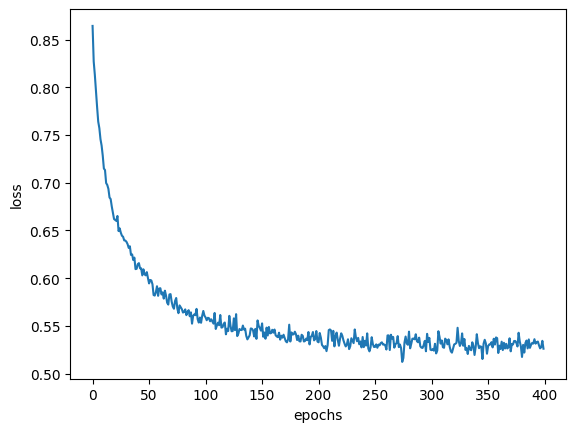

In [ ]:
# Plot the training loss over epochs
plt.plot([i for i in range(len(train_loss_list))], train_loss_list)
plt.xlabel('epochs')
plt.ylabel('loss')

In [ ]:
from sklearn.metrics import roc_auc_score

# Evaluate Model Performance on Validation Data

# Disable gradient calculations for evaluation using t.no_grad()
with t.no_grad():
    # Prepare the validation data
    X_val = t.Tensor(X_test_NN).type(t.float32)  # Convert validation features to a PyTorch tensor
    Y_val = t.Tensor(Y_test_NN).type(t.float32)  # Convert validation labels to a PyTorch tensor

    # Calculate predictions on the validation data
    probs_val = model(X_val)  # Pass validation data through the trained model
    probs_val = probs_val.view(-1, 1).numpy()  # Convert PyTorch tensor to NumPy array

    # Calculate AUC for validation data
    auc_val = roc_auc_score(Y_val.numpy(), probs_val)

    # Print the validation AUC
    print("Validation AUC:", auc_val)

    # Now, evaluate the model on the training data
    X_train = t.Tensor(X_train_NN).type(t.float32)  # Convert training features to a PyTorch tensor
    Y_train = t.Tensor(Y_train_NN).type(t.float32)  # Convert training labels to a PyTorch tensor

    # Calculate predictions on the training data
    probs_train = model(X_train)  # Pass training data through the trained model
    probs_train = probs_train.view(-1, 1).numpy()  # Convert PyTorch tensor to NumPy array

    # Calculate AUC for training data
    auc_train = roc_auc_score(Y_train.numpy(), probs_train)

    # Print the training AUC
    print("Training AUC:", auc_train)


Validation AUC: 0.6474706843170238
Training AUC: 0.8500464966047714


TEST SET --------------------------------------------------------------
Confusion Matrix:
[[524 719]
 [ 63 267]]

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.42      0.57      1243
           1       0.27      0.81      0.41       330

    accuracy                           0.50      1573
   macro avg       0.58      0.62      0.49      1573
weighted avg       0.76      0.50      0.54      1573


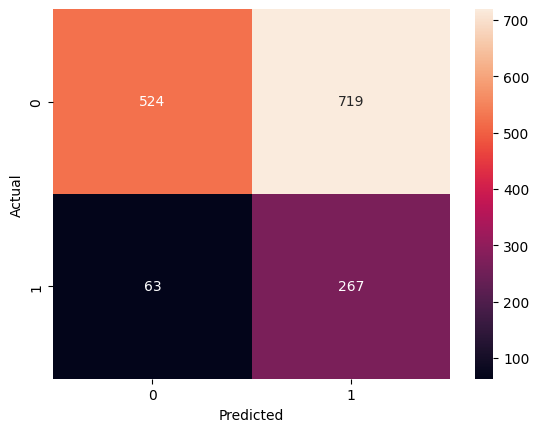

Validation AUC: 0.6840768911967624


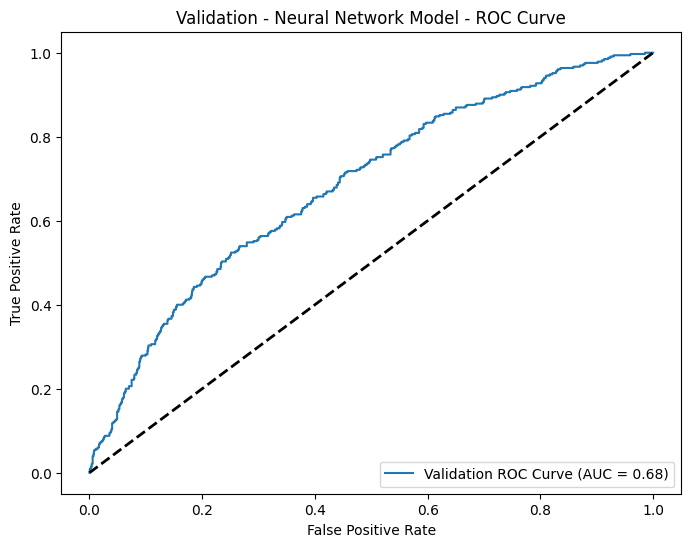

TRAINING SET --------------------------------------------------------------
Confusion Matrix (Training Set):
[[1763  817]
 [ 516 2064]]

Classification Report (Training Set):
              precision    recall  f1-score   support

         0.0       0.77      0.68      0.73      2580
         1.0       0.72      0.80      0.76      2580

    accuracy                           0.74      5160
   macro avg       0.75      0.74      0.74      5160
weighted avg       0.75      0.74      0.74      5160


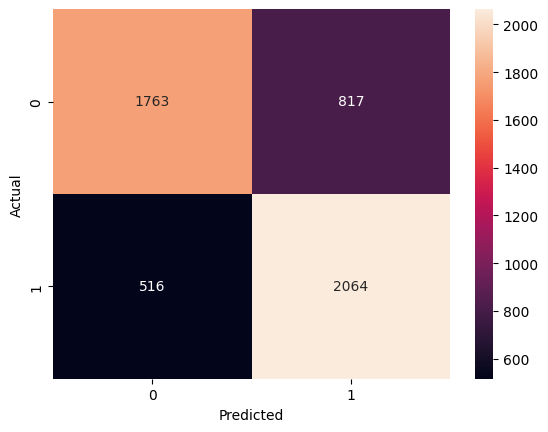

Training AUC: 0.8455851511327445


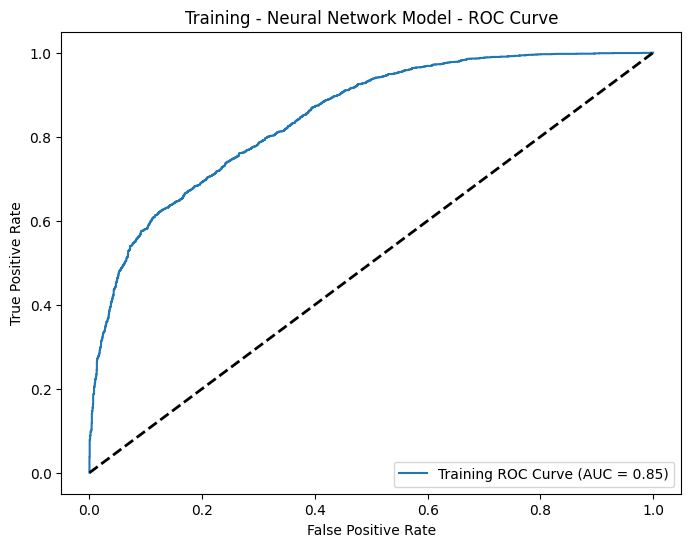

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns
import torch as t

# Evaluate Model Performance on Validation Data

# Disable gradient calculations for evaluation using t.no_grad()
with t.no_grad():
    # Prepare the validation data =============================================
    print("TEST SET --------------------------------------------------------------")
    X_val = t.Tensor(X_test_NN).type(t.float32)  # Convert validation features to a PyTorch tensor
    Y_val = t.Tensor(Y_test_NN).type(t.float32)  # Convert validation labels to a PyTorch tensor

    # Calculate predictions on the validation data
    y_pred_test_proba_2NN = model(X_val)  # Pass validation data through the trained model
    y_pred_test_proba_2NN = y_pred_test_proba_2NN.view(-1, 1).numpy()  # Convert PyTorch tensor to NumPy array

    # Apply the threshold
    threshold = 0.5
    y_pred_test = (y_pred_test_proba_2NN >= threshold).astype(int)

    # Evaluate the model
    conf_matrix_test = confusion_matrix(y_test, y_pred_test)
    class_report_test = classification_report(y_test, y_pred_test)

    print("Confusion Matrix:")
    print(conf_matrix_test)
    print("\nClassification Report:")
    print(class_report_test)

    # Visualize confusion matrix
    sns.heatmap(conf_matrix_test, annot=True, fmt='d')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

    # Calculate AUC for validation data
    auc_test_2NN = roc_auc_score(Y_val.numpy(), y_pred_test_proba_2NN)

    # Print the validation AUC
    print("Validation AUC:", auc_test_2NN)

    # Plot ROC curve for the validation set
    fpr_test_2NN, tpr_test_2NN, _ = roc_curve(Y_val.numpy(), y_pred_test_proba_2NN)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr_test_2NN, tpr_test_2NN, label=f'Validation ROC Curve (AUC = {auc_test_2NN:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Validation - Neural Network Model - ROC Curve')
    plt.legend(loc='lower right')
    plt.show()


      # Now, evaluate the model on the training data =============================
    print("TRAINING SET --------------------------------------------------------------")
    X_train = t.Tensor(X_train_NN).type(t.float32)  # Convert training features to a PyTorch tensor
    Y_train = t.Tensor(Y_train_NN).type(t.float32)  # Convert training labels to a PyTorch tensor

    # Calculate predictions on the training data
    probs_train_2NN = model(X_train)  # Pass training data through the trained model
    probs_train_2NN = probs_train_2NN.view(-1, 1).numpy()  # Convert PyTorch tensor to NumPy array

    # Apply the threshold
    y_pred_train = (probs_train_2NN >= threshold).astype(int)

    # Evaluate the model on the training set
    conf_matrix_train = confusion_matrix(Y_train.numpy(), y_pred_train)
    class_report_train = classification_report(Y_train.numpy(), y_pred_train)

    print("Confusion Matrix (Training Set):")
    print(conf_matrix_train)
    print("\nClassification Report (Training Set):")
    print(class_report_train)

    # Visualize confusion matrix for training set
    sns.heatmap(conf_matrix_train, annot=True, fmt='d')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

    # Calculate AUC for training data
    auc_train_2NN = roc_auc_score(Y_train.numpy(), probs_train_2NN)

    # Print the training AUC
    print("Training AUC:", auc_train_2NN)

    # Plot ROC curve for the training set
    fpr_train_2NN, tpr_train_2NN, _ = roc_curve(Y_train.numpy(), probs_train_2NN)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr_train_2NN, tpr_train_2NN, label=f'Training ROC Curve (AUC = {auc_train_2NN:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Training - Neural Network Model - ROC Curve')
    plt.legend(loc='lower right')
    plt.show()

## Section E7 - Model Performance

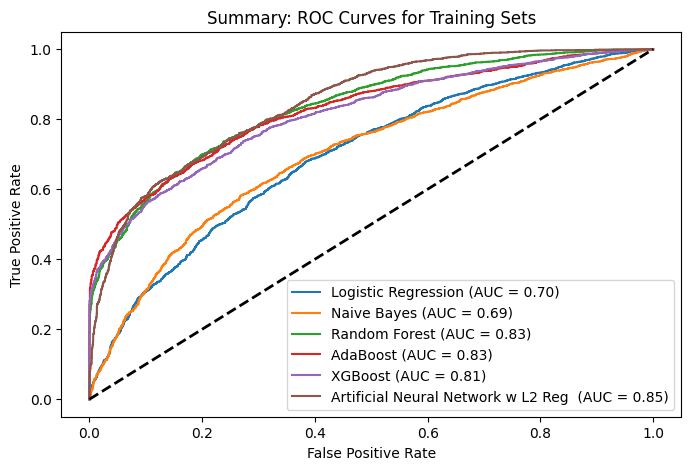

In [ ]:
# Creating a figure
plt.figure(figsize=(8, 5))

# Plotting the ROC curves for training sets (all models)
plt.title('Summary: ROC Curves for Training Sets')
plt.plot(fpr_LR, tpr_LR, label=f'Logistic Regression (AUC = {roc_auc_train_LR:.2f})')
plt.plot(fpr_NB, tpr_NB, label=f'Naive Bayes (AUC = {roc_auc_train_NB:.2f})')
plt.plot(fpr_RF, tpr_RF, label=f'Random Forest (AUC = {roc_auc_train_RF:.2f})')
plt.plot(fpr_ADA, tpr_ADA, label=f'AdaBoost (AUC = {roc_auc_train_ADA:.2f})')
plt.plot(fpr_XGB, tpr_XGB, label=f'XGBoost (AUC = {roc_auc_train_XGB:.2f})')
#plt.plot(fpr_train_BNN, tpr_train_BNN, label=f'Artificial Neural Network (AUC = {auc_train_BNN:.2f})')
plt.plot(fpr_train_2NN, tpr_train_2NN, label=f'Artificial Neural Network w L2 Reg  (AUC = {auc_train_2NN:.2f})')
# Plotting the diagonal line (random classifier)
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')

# Display the graph
plt.show()


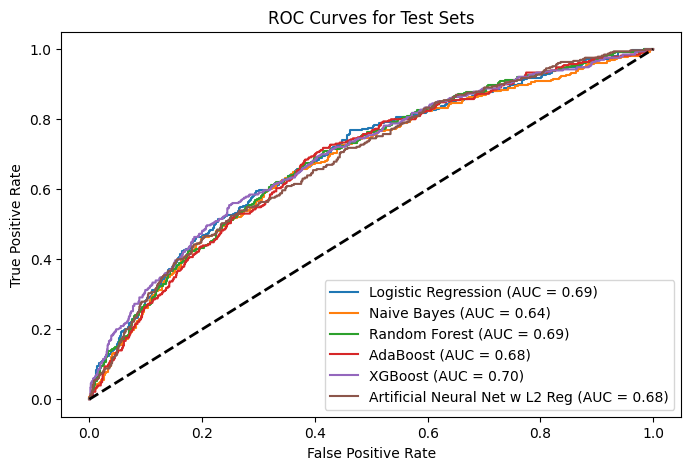

In [ ]:
# Creating a figure
plt.figure(figsize=(8, 5))

# Plotting the ROC curves for training sets (all models)
plt.title('ROC Curves for Test Sets')
plt.plot(fpr_LR_T, tpr_LR_T, label=f'Logistic Regression (AUC = {roc_auc_test_LR:.2f})')
plt.plot(fpr_NB_T, tpr_NB_T, label=f'Naive Bayes (AUC = {roc_auc_test_NB:.2f})')
plt.plot(fpr_RF_T, tpr_RF_T, label=f'Random Forest (AUC = {roc_auc_test_RF:.2f})')
plt.plot(fpr_ADA_T, tpr_ADA_T, label=f'AdaBoost (AUC = {roc_auc_test_ADA:.2f})')
plt.plot(fpr_XGB_T, tpr_XGB_T, label=f'XGBoost (AUC = {roc_auc_test_XGB:.2f})')
#plt.plot(fpr_test_BNN, tpr_test_BNN, label=f'Artificial Neural Net (AUC = {auc_test_BNN:.2f})')
plt.plot(fpr_test_2NN, tpr_test_2NN, label=f'Artificial Neural Net w L2 Reg (AUC = {auc_test_2NN:.2f})')
# Plotting the diagonal line (random classifier)
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')

# Display the graph
plt.show()

Mounted at /content/gdrive


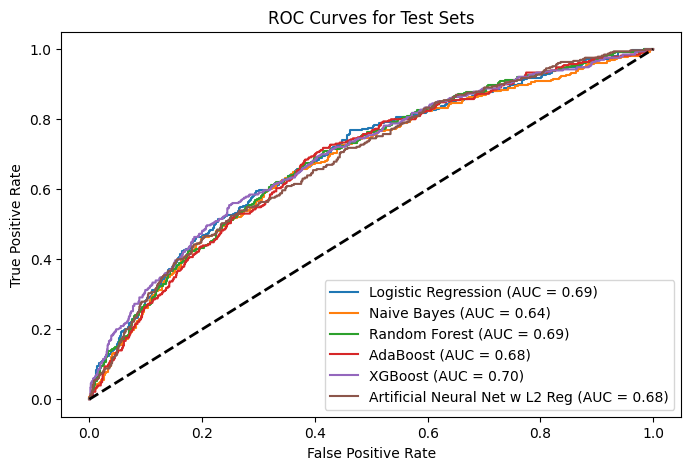

In [ ]:
##export

from google.colab import drive

# Mount Google Drive to access and save files
drive.mount('/content/gdrive')

# Creating a figure
plt.figure(figsize=(8, 5))

# Plotting the ROC curves for training sets (all models)
plt.title('ROC Curves for Test Sets')
plt.plot(fpr_LR_T, tpr_LR_T, label=f'Logistic Regression (AUC = {roc_auc_test_LR:.2f})')
plt.plot(fpr_NB_T, tpr_NB_T, label=f'Naive Bayes (AUC = {roc_auc_test_NB:.2f})')
plt.plot(fpr_RF_T, tpr_RF_T, label=f'Random Forest (AUC = {roc_auc_test_RF:.2f})')
plt.plot(fpr_ADA_T, tpr_ADA_T, label=f'AdaBoost (AUC = {roc_auc_test_ADA:.2f})')
plt.plot(fpr_XGB_T, tpr_XGB_T, label=f'XGBoost (AUC = {roc_auc_test_XGB:.2f})')
#plt.plot(fpr_test_BNN, tpr_test_BNN, label=f'Artificial Neural Net (AUC = {auc_test_BNN:.2f})')
plt.plot(fpr_test_2NN, tpr_test_2NN, label=f'Artificial Neural Net w L2 Reg (AUC = {auc_test_2NN:.2f})')
# Plotting the diagonal line (random classifier)
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')

# Save the figure to Google Drive
plt.savefig('/content/gdrive/My Drive/ROC_Curves_Test_Sets.jpg', dpi=300)

# Display the graph
plt.show()


# SECTION F: Predictive Performance of Model

In [ ]:
# Create a copy of the data
data_processed = data.copy()

In [ ]:
import pandas as pd

# Assuming 'EVER_DERX' and 'Depression' are column names in your dataset
cross_tab = pd.crosstab(data_processed['EVER_DERX'], data_processed['Depression'], dropna=False)

# Display the cross-tabulation
print(cross_tab)


Depression    0    1
EVER_DERX           
0.0         522  130
1.0          34    8


In [ ]:
import numpy as np
import torch

# Set seeds for reproducibility
seed_value = 42

# Set seed for NumPy
np.random.seed(seed_value)

# Set seed for PyTorch
torch.manual_seed(seed_value)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed_value)

In [ ]:
# Convert years with condition into an ordinal variable - (count of years, integer)
# List of columns to round to the nearest whole number
columns_to_round = ['Diabetes_YRS', 'HTN_YRS', 'OA_YRS', 'COPD_YRS']

# Round the specified columns in the main dataset
data_processed[columns_to_round] = data_processed[columns_to_round].round()

# Ensure the specified columns are of integer type
data_processed[columns_to_round] = data_processed[columns_to_round].astype(int)

In [ ]:
data_processed = pd.get_dummies(data_processed, columns=['Med_Cluster'], prefix='Med_Cluster')

In [ ]:
label_column = ['Depression']
depression_med_column = ['EVER_DERX']
binary_columns = ['FBS>DM', 'Diabetes', 'HTN', 'OA', 'COPD', 'Sex',
                  'HTRX_ACEBUTOLOL', 'HTRX_ALISKIREN', 'HTRX_AMLODIPINE', 'HTRX_ATENOLOL',
                  'HTRX_BENAZEPRIL', 'HTRX_BISOPROLOL', 'HTRX_CANDESARTAN',
                  'HTRX_CARVEDILOL', 'HTRX_CILAZAPRIL', 'HTRX_DILTIAZEM', 'HTRX_DIURETIC',
                  'HTRX_DOXAZOSIN', 'HTRX_ENALAPRIL', 'HTRX_EPROSARTAN',
                  'HTRX_FELODIPINE', 'HTRX_FOSINOPRIL', 'HTRX_FUROSEMIDE',
                  'HTRX_HYDROCHLOROTHIAZIDE', 'HTRX_IRBESARTAN', 'HTRX_LABETALOL',
                  'HTRX_LISINOPRIL', 'HTRX_LOSARTAN', 'HTRX_METOPROLOL', 'HTRX_NADOLOL',
                  'HTRX_NIFEDIPINE', 'HTRX_OLMESARTAN MEDOXOMIL', 'HTRX_PERINDOPRIL',
                  'HTRX_POTASSIUM-SPARING AGENTS', 'HTRX_PROPRANOLOL', 'HTRX_QUINAPRIL',
                  'HTRX_RAMIPRIL', 'HTRX_SOTALOL', 'HTRX_SPIRONOLACTONE',
                  'HTRX_TELMISARTAN', 'HTRX_TIMOLOL', 'HTRX_TRANDOLAPRIL',
                  'HTRX_VALSARTAN', 'HTRX_VERAPAMIL', 'CSRX_ANTIBIOTICS',
                  'CSRX_ANTIINFECTIVES', 'CSRX_DEXAMETHASONE', 'CSRX_HYDROCORTISONE',
                  'CSRX_METHYLPREDNISOLONE', 'CSRX_PREDNISOLONE', 'CSRX_PREDNISONE',]
med_clust_columns = ['Med_Cluster_0', 'Med_Cluster_1', 'Med_Cluster_2', 'Med_Cluster_3', 'Med_Cluster_4']
ordinal_columns = ['Diabetes_YRS', 'HTN_YRS', 'OA_YRS', 'COPD_YRS']
numeric_columns = ['Age_at_Exam', 'sBP', 'BMI', 'LDL', 'HDL', 'A1c', 'TG']

#these are defined but will not be included after scaling - can be used for recursive model selection
id_columns = ['Patient_ID']
date_columns = ['OBS_DATE']

In [ ]:
# Create a new DataFrame with only cases where EVER_DERX is not NA
data_strat_DERX = data_processed.dropna(subset=['EVER_DERX'])

# If you want to reset the index of the new dataset
data_strat_DERX.reset_index(drop=True, inplace=True)

In [ ]:
# Check the shape of the new dataset
print("Shape of data_strat_DERX:", data_strat_DERX.shape)

# Print the unique values in the 'EVER_DERX' column
print("Unique values in EVER_DERX column:", data_strat_DERX['EVER_DERX'].unique())


Shape of data_strat_DERX: (694, 71)
Unique values in EVER_DERX column: [0. 1.]


In [ ]:
# Print the total number of rows associated with each value of EVER_DERX
print("Total number of rows associated with each value of EVER_DERX:")
print(data_strat_DERX['EVER_DERX'].value_counts())

Total number of rows associated with each value of EVER_DERX:
0.0    652
1.0     42
Name: EVER_DERX, dtype: int64


In [ ]:
# Split the dataset into two based on the values in the 'EVER_DERX' column
data_strat_DERX_0 = data_strat_DERX[data_strat_DERX['EVER_DERX'] == 0]
data_strat_DERX_1 = data_strat_DERX[data_strat_DERX['EVER_DERX'] == 1]

# Reset the index of the new datasets
data_strat_DERX_0.reset_index(drop=True, inplace=True)
data_strat_DERX_1.reset_index(drop=True, inplace=True)

# Display the shape of the new datasets
print("Shape of data_strat_DERX_0:", data_strat_DERX_0.shape)
print("Shape of data_strat_DERX_1:", data_strat_DERX_1.shape)


Shape of data_strat_DERX_0: (652, 71)
Shape of data_strat_DERX_1: (42, 71)


In [ ]:
# List of selected features
selected_features = ['Diabetes', 'HTN', 'OA', 'COPD', 'Sex', 'HTRX_ATENOLOL',
                      'HTRX_BISOPROLOL', 'HTRX_FUROSEMIDE', 'HTRX_HYDROCHLOROTHIAZIDE',
                      'HTRX_METOPROLOL', 'HTRX_NIFEDIPINE', 'HTRX_PERINDOPRIL',
                      'HTRX_RAMIPRIL', 'CSRX_ANTIINFECTIVES', 'CSRX_HYDROCORTISONE',
                      'CSRX_METHYLPREDNISOLONE', 'CSRX_PREDNISONE', 'Med_Cluster_0',
                      'Med_Cluster_2', 'Med_Cluster_4', 'Diabetes_YRS', 'OA_YRS',
                      'Age_at_Exam', 'sBP', 'BMI', 'HDL', 'A1c', 'TG', 'Depression']

# Select only the specified features in the datasets
selected_features_XGB_0 = data_strat_DERX_0[selected_features]
selected_features_XGB_1 = data_strat_DERX_1[selected_features]

# Display the shape of the new selected datasets
print("Shape of selected_features_XGB_0:", selected_features_XGB_0.shape)
print("Shape of selected_features_XGB_1:", selected_features_XGB_1.shape)


Shape of selected_features_XGB_0: (652, 29)
Shape of selected_features_XGB_1: (42, 29)


In [ ]:
label_column = ['Depression']
depression_med_column = []
binary_columns = ['Diabetes', 'HTN', 'OA', 'COPD', 'Sex', 'HTRX_ATENOLOL',
                  'HTRX_BISOPROLOL', 'HTRX_FUROSEMIDE', 'HTRX_HYDROCHLOROTHIAZIDE',
                  'HTRX_METOPROLOL', 'HTRX_NIFEDIPINE', 'HTRX_PERINDOPRIL',
                  'HTRX_RAMIPRIL', 'CSRX_ANTIINFECTIVES', 'CSRX_HYDROCORTISONE',
                  'CSRX_METHYLPREDNISOLONE', 'CSRX_PREDNISONE']
med_clust_columns = ['Med_Cluster_0', 'Med_Cluster_2', 'Med_Cluster_4']
ordinal_columns = ['Diabetes_YRS', 'OA_YRS']
numeric_columns = ['Age_at_Exam', 'sBP', 'BMI', 'HDL', 'A1c', 'TG']



In [ ]:
from sklearn.model_selection import train_test_split


X_0 = selected_features_XGB_0
y_0 = data_strat_DERX_0[label_column].squeeze()  # Ensure y_0 is one-dimensional

X_1 = selected_features_XGB_1
y_1 = data_strat_DERX_1[label_column].squeeze()  # Ensure y_1 is one-dimensional

# Split the first dataset into training and test sets
X_train_0, X_test_0, y_train_0, y_test_0 = train_test_split(X_0, y_0, test_size=0.5, random_state=42)

# Split the second dataset into training and test sets
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_1, y_1, test_size=0.5, random_state=42)



In [ ]:
# Print the count of Depression cases (0 and 1) in each training set
print("Training Set 0:")
print("Count of Depression 0:", (y_train_0 == 0).sum())
print("Count of Depression 1:", (y_train_0 == 1).sum())

print("\nTraining Set 1:")
print("Count of Depression 0:", (y_train_1 == 0).sum())
print("Count of Depression 1:", (y_train_1 == 1).sum())

# Print the count of Depression cases (0 and 1) in each test set
print("\nTest Set 0:")
print("Count of Depression 0:", (y_test_0 == 0).sum())
print("Count of Depression 1:", (y_test_0 == 1).sum())

print("\nTest Set 1:")
print("Count of Depression 0:", (y_test_1 == 0).sum())
print("Count of Depression 1:", (y_test_1 == 1).sum())

#set 0 is larger size, 40% testing split given smaller data

Training Set 0:
Count of Depression 0: 258
Count of Depression 1: 68

Training Set 1:
Count of Depression 0: 15
Count of Depression 1: 6

Test Set 0:
Count of Depression 0: 264
Count of Depression 1: 62

Test Set 1:
Count of Depression 0: 19
Count of Depression 1: 2


In [ ]:
# Check for missing data in the first dataset before imputation
missing_data_0_train_before = X_train_0.isnull().sum()
missing_data_0_test_before = X_test_0.isnull().sum()

# Check for missing data in the second dataset before imputation
missing_data_1_train_before = X_train_1.isnull().sum()
missing_data_1_test_before = X_test_1.isnull().sum()

# Display the results before imputation
print("Missing data in X_train_0 before imputation:")
print(missing_data_0_train_before[missing_data_0_train_before > 0])

print("\nMissing data in X_test_0 before imputation:")
print(missing_data_0_test_before[missing_data_0_test_before > 0])

print("\nMissing data in X_train_1 before imputation:")
print(missing_data_1_train_before[missing_data_1_train_before > 0])

print("\nMissing data in X_test_1 before imputation:")
print(missing_data_1_test_before[missing_data_1_test_before > 0])



Missing data in X_train_0 before imputation:
HDL    3
TG     1
dtype: int64

Missing data in X_test_0 before imputation:
HDL    4
TG     2
dtype: int64

Missing data in X_train_1 before imputation:
Series([], dtype: int64)

Missing data in X_test_1 before imputation:
Series([], dtype: int64)


In [ ]:
from impyute.imputation.cs import mice

continuous_variables_missing = ['HDL', 'TG']

def mice_imputation(data, continuous_variables):
    # Copy the data to avoid modifying the original
    data_imputed = data.copy()

    # Extract the features with missing values
    features_with_missing = data_imputed[continuous_variables]

    # Perform MICE imputation
    imputed_values = mice(features_with_missing.values)

    # Assign the imputed values back to the DataFrame
    data_imputed[continuous_variables] = imputed_values

    return data_imputed

# Impute for the first dataset
X_train_0_imputed = mice_imputation(X_train_0, continuous_variables_missing)
X_test_0_imputed = mice_imputation(X_test_0, continuous_variables_missing)

#none for x_0 series

In [ ]:
X_train_1_imputed = X_train_1.copy()
X_test_1_imputed = X_test_1.copy()

In [ ]:
# Print the shapes of imputed datasets
print("Shape of X_train_0_imputed:", X_train_0_imputed.shape)
print("Shape of X_test_0_imputed:", X_test_0_imputed.shape)

print("Shape of X_train_1_imputed:", X_train_1_imputed.shape)
print("Shape of X_test_1_imputed:", X_test_1_imputed.shape)

Shape of X_train_0_imputed: (326, 29)
Shape of X_test_0_imputed: (326, 29)
Shape of X_train_1_imputed: (21, 29)
Shape of X_test_1_imputed: (21, 29)


In [ ]:
from sklearn.preprocessing import StandardScaler
import pandas as pd


# List of columns to scale
columns_to_scale_train = binary_columns + med_clust_columns + ordinal_columns + numeric_columns
columns_to_scale_test = binary_columns + med_clust_columns + ordinal_columns + numeric_columns

# Extract the columns for scaling from the training data for X_train_0_imputed
X_train_0_to_scale = X_train_0_imputed[columns_to_scale_train]

# Extract the columns for scaling from the test data for X_test_0_imputed
X_test_0_to_scale = X_test_0_imputed[columns_to_scale_test]

# Extract the columns for scaling from the training data for X_train_1_imputed
X_train_1_to_scale = X_train_1_imputed[columns_to_scale_train]

# Extract the columns for scaling from the test data for X_test_1_imputed
X_test_1_to_scale = X_test_1_imputed[columns_to_scale_test]

# Create an instance of StandardScaler
scaler = StandardScaler()

# Fit and transform the scaler on the training data for X_train_0_imputed
X_train_0_scaled = scaler.fit_transform(X_train_0_to_scale)

# Transform the test data for X_test_0_imputed
X_test_0_scaled = scaler.transform(X_test_0_to_scale)

# Fit and transform the scaler on the training data for X_train_1_imputed
X_train_1_scaled = scaler.fit_transform(X_train_1_to_scale)

# Transform the test data for X_test_1_imputed
X_test_1_scaled = scaler.transform(X_test_1_to_scale)

# Convert the scaled arrays back to DataFrames with column names for X_train_0_imputed and X_test_0_imputed
X_train_0_scaled_df = pd.DataFrame(X_train_0_scaled, columns=columns_to_scale_train)
X_test_0_scaled_df = pd.DataFrame(X_test_0_scaled, columns=columns_to_scale_test)

# Convert the scaled arrays back to DataFrames with column names for X_train_1_imputed and X_test_1_imputed
X_train_1_scaled_df = pd.DataFrame(X_train_1_scaled, columns=columns_to_scale_train)
X_test_1_scaled_df = pd.DataFrame(X_test_1_scaled, columns=columns_to_scale_test)

# Display the shapes of the resulting DataFrames
print("Shape of X_train_0_scaled:", X_train_0_scaled_df.shape)
print("Shape of X_test_0_scaled:", X_test_0_scaled_df.shape)

print("Shape of X_train_1_scaled:", X_train_1_scaled_df.shape)
print("Shape of X_test_1_scaled:", X_test_1_scaled_df.shape)


Shape of X_train_0_scaled: (326, 28)
Shape of X_test_0_scaled: (326, 28)
Shape of X_train_1_scaled: (21, 28)
Shape of X_test_1_scaled: (21, 28)


In [ ]:
from imblearn.pipeline import Pipeline
from imblearn.under_sampling import TomekLinks, RandomUnderSampler
from imblearn.over_sampling import SMOTE

# Create an instance of TomekLinks
tl = TomekLinks()

# Create an instance of RandomUnderSampler with a sampling strategy of 0.5 for 50% undersampling
rus = RandomUnderSampler(sampling_strategy=0.5)

# Create an instance of SMOTE
smote = SMOTE()

# Create a pipeline with Tomek Links undersampling, Random Undersampling, and SMOTE oversampling
resampling_pipeline = Pipeline([
    ('tomek', tl),     # TomekLinks undersampling
    ('rus', rus),      # Random Undersampling
    ('smote', smote)   # SMOTE oversampling
])

# Apply the pipeline on the training data for class balancing

X_train_0_resampled, y_train_0_resampled = resampling_pipeline.fit_resample(X_train_0_scaled_df, y_train_0)
X_train_1_resampled, y_train_1_resampled = resampling_pipeline.fit_resample(X_train_1_scaled_df, y_train_1)

In [ ]:
# Print the shapes of resampled datasets
print("Resampled Training Set 0 - Features:", X_train_0_resampled.shape)
print("Resampled Training Set 0 - Target:", y_train_0_resampled.shape)

print("\nResampled Training Set 1 - Features:", X_train_1_resampled.shape)
print("Resampled Training Set 1 - Target:", y_train_1_resampled.shape)



Resampled Training Set 0 - Features: (272, 28)
Resampled Training Set 0 - Target: (272,)

Resampled Training Set 1 - Features: (24, 28)
Resampled Training Set 1 - Target: (24,)


In [ ]:
# Print the shapes of additional test sets
print("Test Set 0 - Features:", X_test_0_scaled_df.shape)
print("Test Set 0 - Target:", y_test_0.shape)

print("\nTest Set 1 - Features:", X_test_1_scaled_df.shape)
print("Test Set 1 - Target:", y_test_1.shape)


Test Set 0 - Features: (326, 28)
Test Set 0 - Target: (326,)

Test Set 1 - Features: (21, 28)
Test Set 1 - Target: (21,)


In [ ]:
# ### datasets for case 0:
# X_train_0_resampled
# y_train_0_resampled

# X_test_0_scaled_df
# y_test_0

# ##datasets for case 1:
# X_train_1_resampled
# y_train_1_resampled

# X_test_1_scaled_df
# y_test_1

In [ ]:
#TRAINING AND EVALUATING CASE 0

In [ ]:
from sklearn.metrics import accuracy_score

# Best parameters obtained from the grid search
best_params_xgboost = {
    'learning_rate': 0.1,
    'n_estimators': 150
}

# Create XGBoost classifier instance
xgboost_model_best0 = XGBClassifier(
    **best_params_xgboost
)

# Fit the model on your training data
xgboost_model_best0.fit(X_train_0_resampled, y_train_0_resampled)

# Predicting the target variable on the training set and evaluating the model's accuracy.
Y_pred_train_xgboost0 = xgboost_model_best0.predict(X_train_0_resampled)
print('Accuracy score on training set:', accuracy_score(y_train_0_resampled, Y_pred_train_xgboost0))

# Predicting the target variable on the test set and evaluating the model's accuracy.
Y_pred_test_xgboost0 = xgboost_model_best0.predict(X_test_0_scaled_df)
print('Accuracy score on test set:', accuracy_score(y_test_0, Y_pred_test_xgboost0))

Accuracy score on training set: 1.0
Accuracy score on test set: 0.6687116564417178


TRAINING SET ----------------------------------------------------------
Confusion Matrix:
[[136   0]
 [  0 136]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       136
           1       1.00      1.00      1.00       136

    accuracy                           1.00       272
   macro avg       1.00      1.00      1.00       272
weighted avg       1.00      1.00      1.00       272


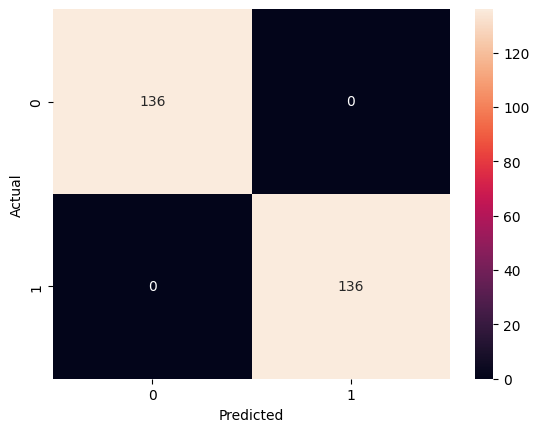

Test ROC-AUC: 1.0000


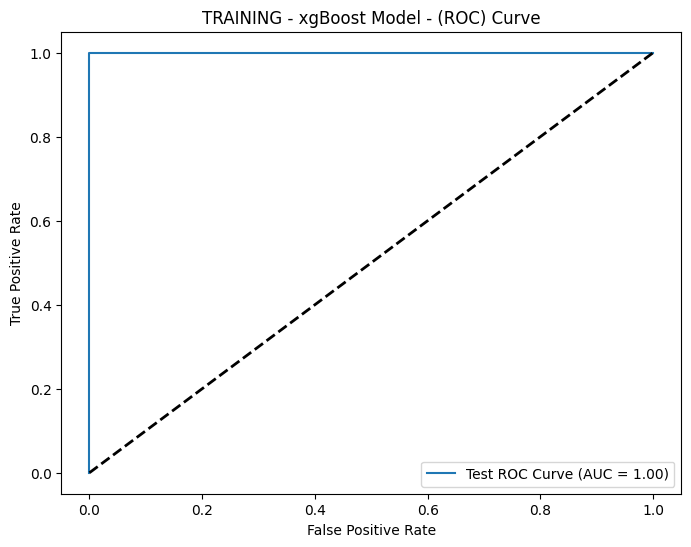

TEST SET --------------------------------------------------------------
Confusion Matrix:
[[199  65]
 [ 43  19]]

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.75      0.79       264
           1       0.23      0.31      0.26        62

    accuracy                           0.67       326
   macro avg       0.52      0.53      0.52       326
weighted avg       0.71      0.67      0.69       326


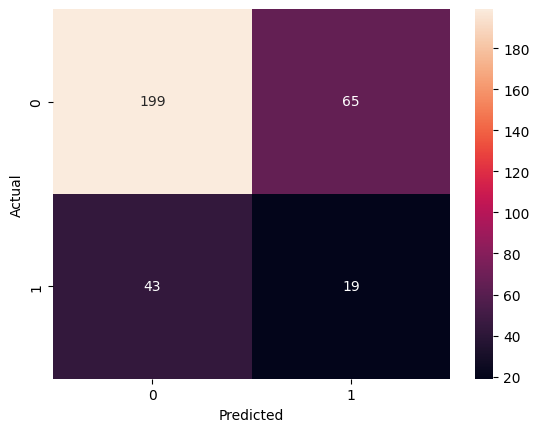

Test ROC-AUC: 0.5852


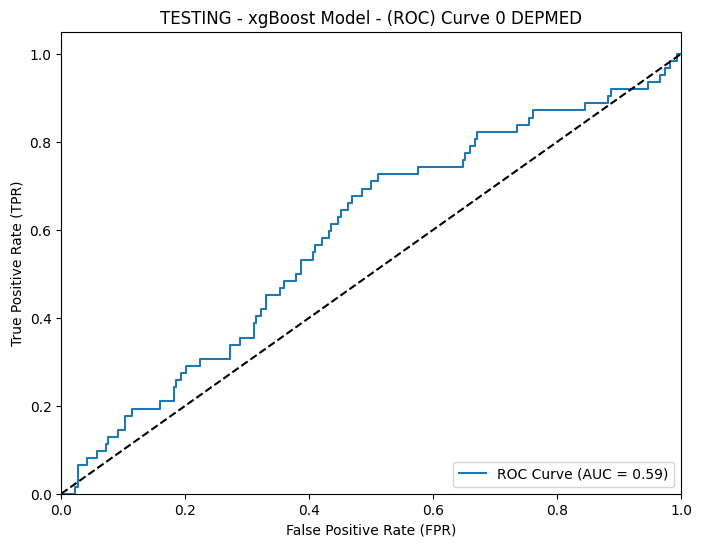

In [ ]:
# FINAL DATASETS Y - FOR CROSS SECTIONAL: X_train_0_resampled, X_test_0_scaled_df, y_train_resampled, y_test

# Predictive Ability - TRAINING SET ============================================
print("TRAINING SET ----------------------------------------------------------")

# Use the model to make predictions on the training data
y_pred_train_proba_KS = xgboost_model_best0.predict_proba(X_train_0_resampled)[:, 1]  # probability of 1 (outcome)

# Apply the new threshold
threshold = 0.5
y_pred = (y_pred_train_proba_KS >= threshold).astype(int)

# Evaluate the model
conf_matrix = confusion_matrix(y_train_0_resampled, y_pred)
class_report = classification_report(y_train_0_resampled, y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

# Visualizing confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# Calculate ROC-AUC on the train set
roc_auc_train_KS = roc_auc_score(y_train_0_resampled, y_pred_train_proba_KS)
print(f"Test ROC-AUC: {roc_auc_train_KS:.4f}")

# Calculate ROC curve on the train set
fpr_KS, tpr_KS, _ = roc_curve(y_train_0_resampled, y_pred_train_proba_KS)

# Plot ROC curve for the train set
plt.figure(figsize=(8, 6))
plt.plot(fpr_KS, tpr_KS, label=f'Test ROC Curve (AUC = {roc_auc_train_KS:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('TRAINING - xgBoost Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Predictive Ability - TEST SET ================================================
print("TEST SET --------------------------------------------------------------")

# Use the model to make predictions on the testing data
y_pred_test_proba_KS = xgboost_model_best0.predict_proba(X_test_0_scaled_df)[:, 1]  # probability of 1 (outcome)

# Apply the new threshold
threshold = 0.5
y_pred = (y_pred_test_proba_KS >= threshold).astype(int)

# Evaluate the model
conf_matrix = confusion_matrix(y_test_0, y_pred)
class_report = classification_report(y_test_0, y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

# Visualizing confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


# Calculate ROC-AUC on the train set
roc_auc_test_KS = roc_auc_score(y_test_0, y_pred_test_proba_KS)
print(f"Test ROC-AUC: {roc_auc_test_KS:.4f}")

# Visualizing ROC at the new probability threshold
fpr_KS_T, tpr_KS_T, thresholds = roc_curve(y_test_0, y_pred_test_proba_KS)
roc_auc = roc_auc_score(y_test_0, y_pred_test_proba_KS)
# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_KS_T, tpr_KS_T, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Plot diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('TESTING - xgBoost Model - (ROC) Curve 0 DEPMED')
plt.legend(loc='lower right')
plt.show()


#SAVE TEST OUTPUTS
y_pred_train_proba_XGB0 = y_pred_train_proba_KS
roc_auc_train_XGB0 = roc_auc_train_KS
fpr_XGB0 = fpr_KS
tpr_XGB0 = tpr_KS
y_pred_test_proba_XGB0 = y_pred_test_proba_KS
roc_auc_test_XGB0 = roc_auc_test_KS
fpr_XGB_T0 = fpr_KS_T
tpr_XGB_T0 = tpr_KS_T

In [ ]:
#TRAINING AND EVALUATING CASE 1
# ##datasets for case 1:
# X_train_1_resampled
# y_train_1_resampled

# X_test_1_scaled_df
# y_test_1

In [ ]:
from sklearn.metrics import accuracy_score

# Best parameters obtained from the grid search
best_params_xgboost = {
    'learning_rate': 0.1,
    'n_estimators': 150
}

# Create XGBoost classifier instance
xgboost_model_best1 = XGBClassifier(
    **best_params_xgboost
)

# Fit the model on your training data
xgboost_model_best1.fit(X_train_1_resampled, y_train_1_resampled)

# Predicting the target variable on the training set and evaluating the model's accuracy.
Y_pred_train_xgboost1 = xgboost_model_best1.predict(X_train_1_resampled)
print('Accuracy score on training set:', accuracy_score(y_train_1_resampled, Y_pred_train_xgboost1))

# Predicting the target variable on the test set and evaluating the model's accuracy.
Y_pred_test_xgboost1 = xgboost_model_best1.predict(X_test_1_scaled_df)
print('Accuracy score on test set:', accuracy_score(y_test_1, Y_pred_test_xgboost1))

Accuracy score on training set: 1.0
Accuracy score on test set: 0.8095238095238095


TRAINING SET ----------------------------------------------------------
Confusion Matrix:
[[12  0]
 [ 0 12]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        12
           1       1.00      1.00      1.00        12

    accuracy                           1.00        24
   macro avg       1.00      1.00      1.00        24
weighted avg       1.00      1.00      1.00        24


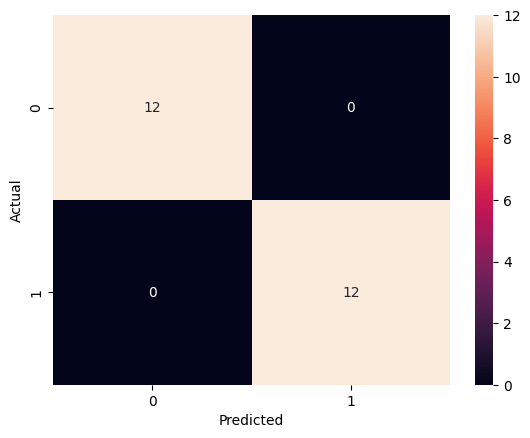

Test ROC-AUC: 1.0000


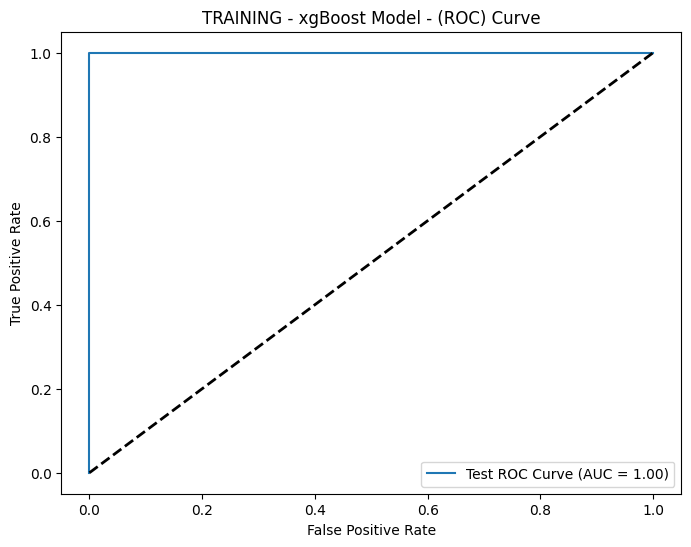

TEST SET --------------------------------------------------------------
Confusion Matrix:
[[15  4]
 [ 0  2]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.79      0.88        19
           1       0.33      1.00      0.50         2

    accuracy                           0.81        21
   macro avg       0.67      0.89      0.69        21
weighted avg       0.94      0.81      0.85        21


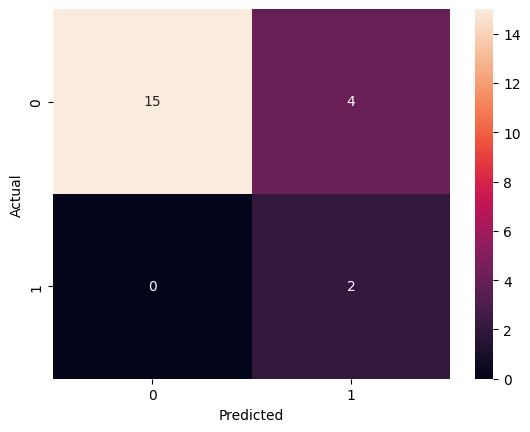

Test ROC-AUC: 0.9474


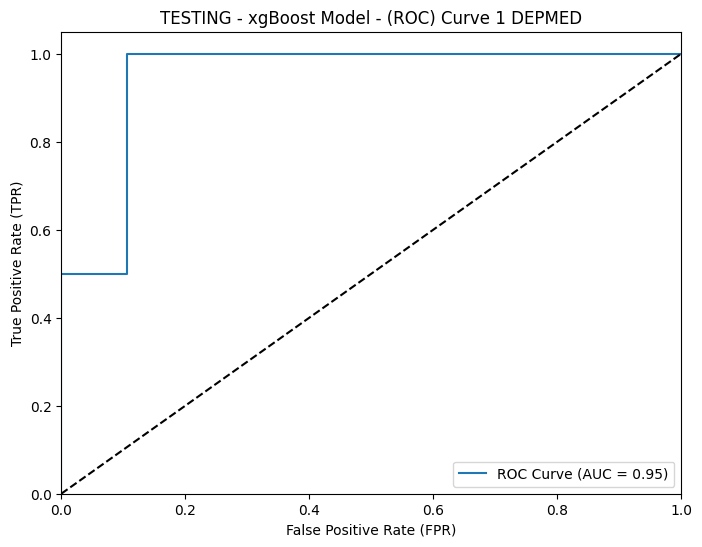

In [ ]:
# FINAL DATASETS Y - FOR CROSS SECTIONAL: X_train_0_resampled, X_test_0_scaled_df, y_train_resampled, y_test

# Predictive Ability - TRAINING SET ============================================
print("TRAINING SET ----------------------------------------------------------")

# Use the model to make predictions on the training data
y_pred_train_proba_KS = xgboost_model_best1.predict_proba(X_train_1_resampled)[:, 1]  # probability of 1 (outcome)

# Apply the new threshold
threshold = 0.5
y_pred = (y_pred_train_proba_KS >= threshold).astype(int)

# Evaluate the model
conf_matrix = confusion_matrix(y_train_1_resampled, y_pred)
class_report = classification_report(y_train_1_resampled, y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

# Visualizing confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# Calculate ROC-AUC on the train set
roc_auc_train_KS = roc_auc_score(y_train_1_resampled, y_pred_train_proba_KS)
print(f"Test ROC-AUC: {roc_auc_train_KS:.4f}")

# Calculate ROC curve on the train set
fpr_KS, tpr_KS, _ = roc_curve(y_train_1_resampled, y_pred_train_proba_KS)

# Plot ROC curve for the train set
plt.figure(figsize=(8, 6))
plt.plot(fpr_KS, tpr_KS, label=f'Test ROC Curve (AUC = {roc_auc_train_KS:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('TRAINING - xgBoost Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Predictive Ability - TEST SET ================================================
print("TEST SET --------------------------------------------------------------")

# Use the model to make predictions on the testing data
y_pred_test_proba_KS = xgboost_model_best1.predict_proba(X_test_1_scaled_df)[:, 1]  # probability of 1 (outcome)

# Apply the new threshold
threshold = 0.5
y_pred = (y_pred_test_proba_KS >= threshold).astype(int)

# Evaluate the model
conf_matrix = confusion_matrix(y_test_1, y_pred)
class_report = classification_report(y_test_1, y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

# Visualizing confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


# Calculate ROC-AUC on the train set
roc_auc_test_KS = roc_auc_score(y_test_1, y_pred_test_proba_KS)
print(f"Test ROC-AUC: {roc_auc_test_KS:.4f}")

# Visualizing ROC at the new probability threshold
fpr_KS_T, tpr_KS_T, thresholds = roc_curve(y_test_1, y_pred_test_proba_KS)
roc_auc = roc_auc_score(y_test_1, y_pred_test_proba_KS)
# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_KS_T, tpr_KS_T, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Plot diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('TESTING - xgBoost Model - (ROC) Curve 1 DEPMED')
plt.legend(loc='lower right')
plt.show()


#SAVE TEST OUTPUTS
y_pred_train_proba_XGB1 = y_pred_train_proba_KS
roc_auc_train_XGB1 = roc_auc_train_KS
fpr_XGB1 = fpr_KS
tpr_XGB1 = tpr_KS
y_pred_test_proba_XGB1 = y_pred_test_proba_KS
roc_auc_test_XGB1 = roc_auc_test_KS
fpr_XGB_T1 = fpr_KS_T
tpr_XGB_T1 = tpr_KS_T

## F1 Stratified Model Performance

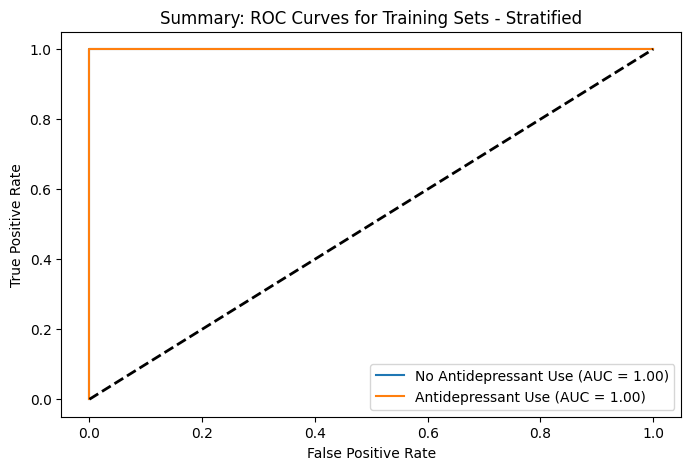

In [ ]:
# Creating a figure
plt.figure(figsize=(8, 5))

# Plotting the ROC curves for training sets (all models)
plt.title('Summary: ROC Curves for Training Sets - Stratified')
plt.plot(fpr_XGB0, tpr_XGB0, label=f'No Antidepressant Use (AUC = {roc_auc_train_XGB0:.2f})')
plt.plot(fpr_XGB1, tpr_XGB1, label=f'Antidepressant Use (AUC = {roc_auc_train_XGB1:.2f})')

# Plotting the diagonal line (random classifier)
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')

# Display the graph
plt.show()


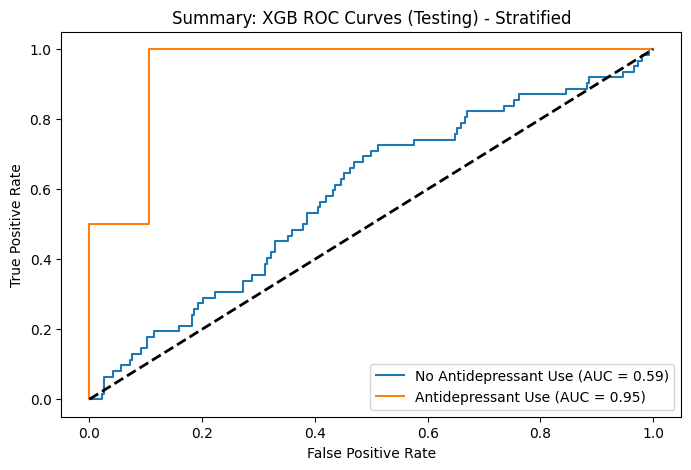

In [ ]:
# Creating a figure
plt.figure(figsize=(8, 5))

# Plotting the ROC curves for test sets (all models)
plt.title('Summary: XGB ROC Curves (Testing) - Stratified')
plt.plot(fpr_XGB_T0, tpr_XGB_T0, label=f'No Antidepressant Use (AUC = {roc_auc_test_XGB0:.2f})')
plt.plot(fpr_XGB_T1, tpr_XGB_T1, label=f'Antidepressant Use (AUC = {roc_auc_test_XGB1:.2f})')

# Plotting the diagonal line (random classifier)
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')

# Display the graph
plt.show()


# END /// SCRAP CODE BELOW - TO BE DELETED

In [ ]:
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier

# Best parameters obtained from the grid search
best_params_xgboost = {
    'learning_rate': 0.1,
    'n_estimators': 150
}

# Create XGBoost classifier instance
xgboost_model_best = XGBClassifier(**best_params_xgboost)

# Fit the model on your resampled training data for Training Set 1
xgboost_model_best.fit(X_train_resampled_1, y_train_resampled_1)

# Predicting the target variable on the resampled training set and evaluating the model's accuracy.
y_pred_train_xgboost = xgboost_model_best.predict(X_train_resampled_1)
print('Accuracy score on resampled training set:', accuracy_score(y_train_resampled_1, y_pred_train_xgboost))

# Predicting the target variable on the resampled test set and evaluating the model's accuracy.
y_pred_test_xgboost = xgboost_model_best.predict(X_test_resampled_1)
print('Accuracy score on resampled test set:', accuracy_score(y_test_resampled_1, y_pred_test_xgboost))



In [ ]:
###########

In [ ]:
#map to account for NAs in the Z (STRATIFYING) variable

# Replace values in the "EVER_DERX" column for training set
Z_train['EVER_DERX'] = Z_train['EVER_DERX'].map({np.nan: 1, 0: 2, 1: 3})

# Replace values in the "EVER_DERX" column for test set
Z_test['EVER_DERX'] = Z_test['EVER_DERX'].map({np.nan: 1, 0: 2, 1: 3})


In [ ]:
# Print counts for the training set
print("Training Set - Counts in EVER_DERX:")
print(Z_train['EVER_DERX'].value_counts())

# Print counts for the test set
print("\nTest Set - Counts in EVER_DERX:")
print(Z_test['EVER_DERX'].value_counts())


In [ ]:
import copy

X_train_XGB_copy = copy.deepcopy(X_train_XGB_selected)
X_test_XGB_copy = copy.deepcopy(X_test_XGB_selected)
y_train_XGB_copy = copy.deepcopy(y_train_resampled)
y_test_XGB_copy = copy.deepcopy(y_test)

In [ ]:
print("Shape of X_train_XGB_copy:", X_train_XGB_copy.shape)
print("Shape of X_test_XGB_copy:", X_test_XGB_copy.shape)
print("Shape of y_train_XGB_copy:", y_train_XGB_copy.shape)
print("Shape of y_test_XGB_copy:", y_test_XGB_copy.shape)

In [ ]:
# Merge X_train_XGB_copy with Z_train
X_train_combined = pd.merge(X_train_XGB_copy, Z_train, how='inner', left_index=True, right_index=True)

# Merge X_test_XGB_copy with Z_test
X_test_combined = pd.merge(X_test_XGB_copy, Z_test, how='inner', left_index=True, right_index=True)


In [ ]:
print("Shape:", X_train_combined.shape)
print("Shape:", X_test_combined.shape)

# Section F: Predictive Performance by Depression Medication

In [ ]:
### NOTE YOU NEED TO RUN THE XGBOOST SECTION TO SAVE THE NEW DATASETS, RUN PRIOR SECTION BEFORE RUNNING THIS


TRAINING SET ----------------------------------------------------------
Confusion Matrix:
[[2502   78]
 [ 336 2244]]

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.97      0.92      2580
           1       0.97      0.87      0.92      2580

    accuracy                           0.92      5160
   macro avg       0.92      0.92      0.92      5160
weighted avg       0.92      0.92      0.92      5160


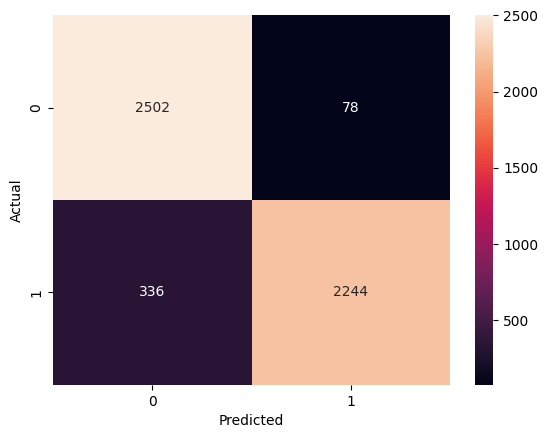

Test ROC-AUC: 0.9821


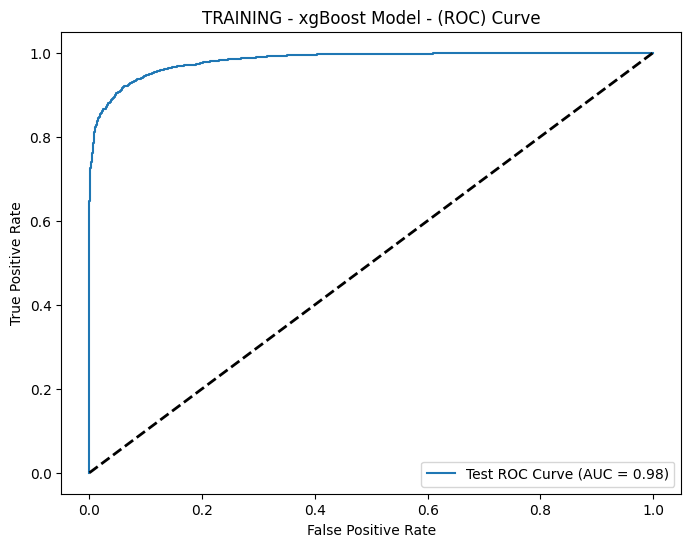

TEST SET --------------------------------------------------------------
Confusion Matrix:
[[1037  206]
 [ 179  151]]

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.83      0.84      1243
           1       0.42      0.46      0.44       330

    accuracy                           0.76      1573
   macro avg       0.64      0.65      0.64      1573
weighted avg       0.76      0.76      0.76      1573


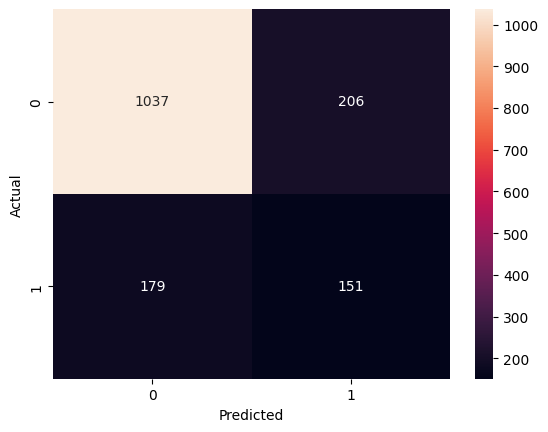

Test ROC-AUC: 0.7166


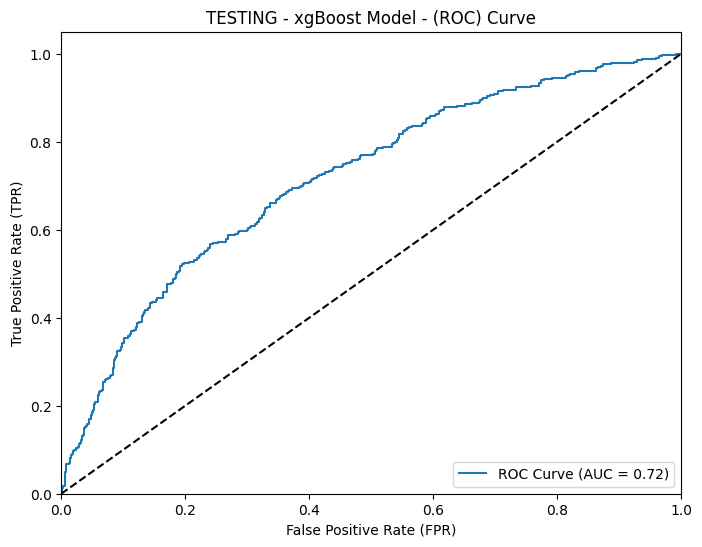

In [ ]:
# FINAL DATASETS Y - FOR CROSS SECTIONAL: X_train_XGB_selected, X_test_XGB_selected, y_train_resampled, y_test

# Predictive Ability - TRAINING SET ============================================
print("TRAINING SET ----------------------------------------------------------")

# Use the model to make predictions on the training data
y_pred_train_proba_KS = xgboost_model_best.predict_proba(X_train_XGB_selected)[:, 1]  # probability of 1 (outcome)

# Apply the new threshold
threshold = 0.5
y_pred = (y_pred_train_proba_KS >= threshold).astype(int)

# Evaluate the model
conf_matrix = confusion_matrix(y_train_resampled, y_pred)
class_report = classification_report(y_train_resampled, y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

# Visualizing confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# Calculate ROC-AUC on the train set
roc_auc_train_KS = roc_auc_score(y_train_resampled, y_pred_train_proba_KS)
print(f"Test ROC-AUC: {roc_auc_train_KS:.4f}")

# Calculate ROC curve on the train set
fpr_KS, tpr_KS, _ = roc_curve(y_train_resampled, y_pred_train_proba_KS)

# Plot ROC curve for the train set
plt.figure(figsize=(8, 6))
plt.plot(fpr_KS, tpr_KS, label=f'Test ROC Curve (AUC = {roc_auc_train_KS:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('TRAINING - xgBoost Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Predictive Ability - TEST SET ================================================
print("TEST SET --------------------------------------------------------------")

# Use the model to make predictions on the testing data
y_pred_test_proba_KS = xgboost_model_best.predict_proba(X_test_XGB_selected)[:, 1]  # probability of 1 (outcome)

# Apply the new threshold
threshold = 0.5
y_pred = (y_pred_test_proba_KS >= threshold).astype(int)

# Evaluate the model
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

# Visualizing confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


# Calculate ROC-AUC on the train set
roc_auc_test_KS = roc_auc_score(y_test, y_pred_test_proba_KS)
print(f"Test ROC-AUC: {roc_auc_test_KS:.4f}")

# Visualizing ROC at the new probability threshold
fpr_KS_T, tpr_KS_T, thresholds = roc_curve(y_test, y_pred_test_proba_KS)
roc_auc = roc_auc_score(y_test, y_pred_test_proba_KS)
# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_KS_T, tpr_KS_T, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Plot diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('TESTING - xgBoost Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


#SAVE TEST OUTPUTS
y_pred_train_proba_XGB = y_pred_train_proba_KS
roc_auc_train_XGB = roc_auc_train_KS
fpr_XGB = fpr_KS
tpr_XGB = tpr_KS
y_pred_test_proba_XGB = y_pred_test_proba_KS
roc_auc_test_XGB = roc_auc_test_KS
fpr_XGB_T = fpr_KS_T
tpr_XGB_T = tpr_KS_T

In [ ]:
import copy

X_train_XGB_copy = copy.deepcopy(X_train_XGB_selected)
X_test_XGB_copy = copy.deepcopy(X_test_XGB_selected)
y_train_XGB_copy = copy.deepcopy(y_train_resampled)
y_test_XGB_copy = copy.deepcopy(y_test)

In [ ]:
print("Shape of X_train_XGB_copy:", X_train_XGB_copy.shape)
print("Shape of X_test_XGB_copy:", X_test_XGB_copy.shape)
print("Shape of y_train_XGB_copy:", y_train_XGB_copy.shape)
print("Shape of y_test_XGB_copy:", y_test_XGB_copy.shape)

Shape of X_train_XGB_copy: (5160, 28)
Shape of X_test_XGB_copy: (1573, 28)
Shape of y_train_XGB_copy: (5160, 1)
Shape of y_test_XGB_copy: (1573, 1)


In [ ]:
#map to account for NAs in the Z (STRATIFYING) variable

# Replace values in the "EVER_DERX" column for training set
Z_train['EVER_DERX'] = Z_train['EVER_DERX'].map({np.nan: 1, 0: 2, 1: 3})

# Replace values in the "EVER_DERX" column for test set
Z_test['EVER_DERX'] = Z_test['EVER_DERX'].map({np.nan: 1, 0: 2, 1: 3})


In [ ]:
# X_train_XGB_copy, X_test_XGB_copy, y_train_XGB_copy, y_test_XGB_copy are the datasets
# Assuming Z_train and Z_test contain the "EVER_DERX" variable

# Combine X and Z datasets for the training and test sets
X_train_combined = pd.concat([X_train_XGB_copy, Z_train['EVER_DERX']], axis=1)
X_test_combined = pd.concat([X_test_XGB_copy, Z_test['EVER_DERX']], axis=1)

# Create labels
y_train = y_train_XGB_copy
y_test = y_test_XGB_copy

# Create StratifiedKFold object considering "EVER_DERX"
strat_kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Replace XGBClassifier with your actual model
model = XGBClassifier()

# Initialize lists to store results for each fold
roc_auc_scores = []
confusion_matrices = []

print("Number of missing values in y_train:", y_train.isnull().sum())


# Perform cross-validation and evaluate the model within each stratum
for train_idx, test_idx in strat_kfold.split(X_train_combined, X_train_combined['EVER_DERX']):
    X_train_fold, X_val_fold = X_train_combined.iloc[train_idx], X_train_combined.iloc[test_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[test_idx]  # Corrected line

    # Train the model on the training fold
    model.fit(X_train_fold.drop('EVER_DERX', axis=1), y_train_fold)

    # Use the model to make predictions on the validation fold
    y_pred_proba = model.predict_proba(X_val_fold.drop('EVER_DERX', axis=1))[:, 1]

    # Apply the threshold
    threshold = 0.5
    y_pred = (y_pred_proba >= threshold).astype(int)

    # Evaluate the model on the validation fold
    conf_matrix = confusion_matrix(y_val_fold, y_pred)
    confusion_matrices.append(conf_matrix)

    print("Confusion Matrix for Fold:")
    print(conf_matrix)
    print("\nClassification Report for Fold:")
    print(classification_report(y_val_fold, y_pred))

    # Calculate ROC-AUC for each fold
    roc_auc = roc_auc_score(y_val_fold, y_pred_proba)
    roc_auc_scores.append(roc_auc)

    # Calculate ROC curve for each fold
    fpr, tpr, _ = roc_curve(y_val_fold, y_pred_proba)

    # Plot ROC curve for each fold
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'Fold ROC Curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Cross-Validation - Fold ROC Curve')
    plt.legend(loc='lower right')
    plt.show()

# Print mean and standard deviation of ROC-AUC scores across folds
print("Mean ROC-AUC across Folds:", np.mean(roc_auc_scores))
print("Standard Deviation of ROC-AUC across Folds:", np.std(roc_auc_scores))




Number of missing values in y_train: Depression    0
dtype: int64


ValueError: Input y contains NaN.

In [ ]:
###########################################

In [ ]:
# Merge Z_train and X_train_XGB_copy
merged_TR0DERX = pd.concat([Z_train, X_train_XGB_copy], axis=1)

# Merge the result with y_train_XGB_copy
merged_TR0DERX = pd.concat([merged_TR0DERX, y_train_XGB_copy], axis=1)

print("Shape of merged_TR0DERX 'Train Set, Filtered for DERX == 0':", merged_TR0DERX.shape)

Shape of merged_TR0DERX 'Train Set, Filtered for DERX == 0': (7331, 30)


In [ ]:
# Filter for cases where 'EVER_DERX' is 0
filtered_TR0DERX = merged_TR0DERX[merged_TR0DERX['EVER_DERX'] == 2]

# Cut the 'EVER_DERX' column
filtered_TR0DERX = filtered_TR0DERX.drop(columns=['EVER_DERX'])

In [ ]:
print("Shape of merged_TR0DERX 'Train Set, Filtered for DERX == 0':", filtered_TR0DERX.shape)

Shape of merged_TR0DERX 'Train Set, Filtered for DERX == 0': (0, 29)


In [ ]:
print(filtered_TR0DERX.columns)

Index(['Diabetes', 'HTN', 'OA', 'COPD', 'Sex', 'HTRX_ATENOLOL',
       'HTRX_BISOPROLOL', 'HTRX_FUROSEMIDE', 'HTRX_HYDROCHLOROTHIAZIDE',
       'HTRX_METOPROLOL', 'HTRX_NIFEDIPINE', 'HTRX_PERINDOPRIL',
       'HTRX_RAMIPRIL', 'CSRX_ANTIINFECTIVES', 'CSRX_HYDROCORTISONE',
       'CSRX_METHYLPREDNISOLONE', 'CSRX_PREDNISONE', 'Med_Cluster_0',
       'Med_Cluster_2', 'Med_Cluster_4', 'Diabetes_YRS', 'OA_YRS',
       'Age_at_Exam', 'sBP', 'BMI', 'HDL', 'A1c', 'TG', 'Depression'],
      dtype='object')


In [ ]:
# Assuming 'Depression' is the correct column name
Y_TR0DERX = filtered_TR0DERX['Depression'].values.reshape(-1, 1)
X_TR0DERX = filtered_TR0DERX.drop('Depression', axis=1)

print("Shape of X:", X_TR0DERX.shape)
print("Shape of Y:", Y_TR0DERX.shape)


Shape of X: (504, 28)
Shape of Y: (504, 1)


In [ ]:
# Assuming X_TR0DERX and Y_TR0DERX are your datasets
print("First few columns of X_TR0DERX:")
print(X_TR0DERX.head())

print("\nFirst few columns of Y_TR0DERX:")
print(Y_TR0DERX.head())

First few columns of X_TR0DERX:
      Diabetes      HTN        OA      COPD       Sex  HTRX_ATENOLOL  \
7325       NaN      NaN       NaN       NaN       NaN            NaN   
1158  0.720983  0.66416 -0.704494 -0.345309 -1.044726      -0.311113   
3289  0.720983  0.66416  1.419458 -0.345309  0.957188       3.214270   
5641       NaN      NaN       NaN       NaN       NaN            NaN   
254   0.720983 -1.50566 -0.704494 -0.345309  0.957188      -0.311113   

      HTRX_BISOPROLOL  HTRX_FUROSEMIDE  HTRX_HYDROCHLOROTHIAZIDE  \
7325              NaN              NaN                       NaN   
1158        -0.298652        -0.343865                 -0.628550   
3289        -0.298652        -0.343865                  1.590963   
5641              NaN              NaN                       NaN   
254         -0.298652        -0.343865                 -0.628550   

      HTRX_METOPROLOL  HTRX_NIFEDIPINE  HTRX_PERINDOPRIL  HTRX_RAMIPRIL  \
7325              NaN              NaN             

AttributeError: 'numpy.ndarray' object has no attribute 'head'

In [ ]:
# Predictive Ability - TRAINING SET (Filtered Data) ============================
print("TRAINING SET (Filtered Data) -------------------------------------------")

# Use the model to make predictions on the filtered training data
y_pred_train_proba_KS_filtered = xgboost_model_best.predict_proba(X_TR0DERX)[:, 1]  # probability of 1 (outcome)

# Apply the new threshold
threshold = 0.5
y_pred_filtered = (y_pred_train_proba_KS_filtered >= threshold).astype(int)

# Evaluate the model on the filtered training data
conf_matrix_filtered = confusion_matrix(Y_TR0DERX, y_pred_filtered)
class_report_filtered = classification_report(Y_TR0DERX, y_pred_filtered)

print("Confusion Matrix:")
print(conf_matrix_filtered)
print("\nClassification Report:")
print(class_report_filtered)

# Visualizing confusion matrix for the filtered training data
sns.heatmap(conf_matrix_filtered, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# Calculate ROC-AUC on the filtered train set
roc_auc_train_KS_filtered = roc_auc_score(Y_TR0DERX, y_pred_train_proba_KS_filtered)
print(f"Test ROC-AUC: {roc_auc_train_KS_filtered:.4f}")

# Calculate ROC curve on the filtered train set
fpr_KS_filtered, tpr_KS_filtered, _ = roc_curve(Y_TR0DERX, y_pred_train_proba_KS_filtered)

# Plot ROC curve for the filtered train set
plt.figure(figsize=(8, 6))
plt.plot(fpr_KS_filtered, tpr_KS_filtered, label=f'Test ROC Curve (AUC = {roc_auc_train_KS_filtered:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('TRAINING - xgBoost Model - (ROC) Curve (Filtered Data)')
plt.legend(loc='lower right')
plt.show()


TRAINING SET (Filtered Data) -------------------------------------------


ValueError: Input y_true contains NaN.

## EXTRA Neutal Network Testing Different Approaches

In [ ]:
import torch as t
import torch.nn as nn
from torch.optim import Adam
from torch.utils.data import TensorDataset, DataLoader
import matplotlib.pyplot as plt

# Regularization
# Deep neural networks are prone to overfitting if there is not much data available during training.

# Define hyperparameters
number_of_input_features = 67
number_of_hidden_units = 40
epochs = 100
learning_rate = 0.001
batch_size = 32
landa = 0.01  # Regularization term (lambda)

# Prepare the data
X_train_tensor = t.Tensor(X_train_NN).type(t.float32)
Y_train_tensor = t.Tensor(Y_train_NN).type(t.float32)

X_test_tensor = t.Tensor(X_test_NN).type(t.float32)
Y_test_tensor = t.Tensor(Y_test_NN).type(t.float32)

train_dataset = TensorDataset(X_train_tensor, Y_train_tensor)
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Define the neural network model with regularization
model = nn.Sequential(
    nn.Linear(number_of_input_features, number_of_hidden_units),  # Linear layer for matrix multiplication and bias addition
    nn.Tanh(),  # Tanh activation function
    nn.Linear(number_of_hidden_units, 1),  # Another linear layer
    nn.Sigmoid()  # Sigmoid activation for probability output
)

# Define the optimizer
optimizer = Adam(model.parameters(), lr=learning_rate)

# Define the loss function with Binary Cross-Entropy Loss
loss_fn = nn.BCELoss()

# Lists to store training accuracy, validation accuracy, and training loss over epochs
train_accuracy_list = []
validation_accuracy_list = []
train_loss_list = []

for epoch in range(epochs):
    if epoch % 500 == 0:
        learning_rate *= 0.9  # Learning rate scheduling

    per_epoch_loss_list = []

    for batch_idx, (X, Y) in enumerate(train_data_loader):
        # Forward pass: Compute predictions
        probs = model(X)

        # Adding regularization term for all parameters in the model
        l2_term = sum([(w ** 2).sum() for w in model.parameters()])
        # New loss is the old loss + regularization term
        loss = loss_fn(probs.view(-1, 1), Y) + landa * l2_term

        per_epoch_loss_list.append(loss.item())

        # Backward pass: Compute gradient and update weights
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Evaluate the model on training and validation data
    with t.no_grad():
        # Set the model in eval mode; some layers use this for certain calculations during training
        model.eval()

        # Calculate accuracy on train data
        probs_train = model(X_train_tensor)
        prediction_train = (probs_train >= 0.5).type(t.LongTensor).view(-1)
        train_accuracy = (prediction_train == Y_train_tensor).type(t.float32).mean().item()

        # Calculate accuracy on validation data
        probs_val = model(X_test_tensor)
        prediction_val = (probs_val >= 0.5).type(t.LongTensor).view(-1)
        validation_accuracy = (prediction_val == Y_test_tensor).type(t.float32).mean().item()

        # Print accuracy for the current epoch

        # Set the model back to train mode
        model.train()

        # Append accuracy values to lists
        train_accuracy_list.append(train_accuracy)
        validation_accuracy_list.append(validation_accuracy)

    # Calculate and append the average loss for the epoch
    train_loss_list.append(sum(per_epoch_loss_list) / len(per_epoch_loss_list))


In [ ]:
import torch as t
import torch.nn as nn
from torch.optim import Adam
from torch.utils.data import TensorDataset, DataLoader
import matplotlib.pyplot as plt

# Regularization
# Deep neural networks are prone to overfitting if there is not much data available during training.

# Define hyperparameters
number_of_input_features = 67
number_of_hidden_units = 40
epochs = 200
learning_rate = 0.005
batch_size = 32
landa = 0.01  # Regularization term (lambda)

# Prepare the data
X_train_tensor = t.Tensor(X_train_NN).type(t.float32)
Y_train_tensor = t.Tensor(Y_train_NN).type(t.float32)

X_test_tensor = t.Tensor(X_test_NN).type(t.float32)
Y_test_tensor = t.Tensor(Y_test_NN).type(t.float32)

train_dataset = TensorDataset(X_train_tensor, Y_train_tensor)
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Define the neural network model with regularization
model = nn.Sequential(
    nn.Linear(number_of_input_features, number_of_hidden_units),  # Linear layer for matrix multiplication and bias addition
    nn.Tanh(),  # Tanh activation function
    nn.Linear(number_of_hidden_units, 1),  # Another linear layer
    nn.Sigmoid()  # Sigmoid activation for probability output
)

# Define the optimizer
optimizer = Adam(model.parameters(), lr=learning_rate)

# Define the loss function with Binary Cross-Entropy Loss
loss_fn = nn.BCELoss()

# Lists to store training accuracy, validation accuracy, and training loss over epochs
train_accuracy_list = []
validation_accuracy_list = []
train_loss_list = []

for epoch in range(epochs):
    if epoch % 500 == 0:
        learning_rate *= 0.9  # Learning rate scheduling

    per_epoch_loss_list = []

    for batch_idx, (X, Y) in enumerate(train_data_loader):
        # Forward pass: Compute predictions
        probs = model(X)

        # Adding regularization term for all parameters in the model
        l2_term = sum([(w ** 2).sum() for w in model.parameters()])

        # New loss is the old loss + regularization term
        loss = loss_fn(probs.view(-1, 1), Y) + landa * l2_term

        per_epoch_loss_list.append(loss.item())

        # Backward pass: Compute gradient and update weights
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Evaluate the model on training and validation data
    with t.no_grad():
        # Set the model in eval mode; some layers use this for certain calculations during training
        model.eval()

        # Calculate accuracy on train data
        probs_train = model(X_train_tensor)
        prediction_train = (probs_train >= 0.5).type(t.float32).view(-1).numpy()
        train_accuracy = accuracy_score(Y_train_tensor.numpy(), prediction_train)

        # Calculate accuracy on validation data
        probs_val = model(X_test_tensor)
        prediction_val = (probs_val >= 0.5).type(t.float32).view(-1).numpy()
        validation_accuracy = accuracy_score(Y_test_tensor.numpy(), prediction_val)

        # Print accuracy for the current epoch
        print(f'Epoch {epoch}/{epochs} ---> Train Accuracy: {train_accuracy}, Validation Accuracy: {validation_accuracy}')

        # Set the model back to train mode
        model.train()

        # Append accuracy values to lists
        train_accuracy_list.append(train_accuracy)
        validation_accuracy_list.append(validation_accuracy)

    # Calculate and append the average loss for the epoch
    train_loss_list.append(sum(per_epoch_loss_list) / len(per_epoch_loss_list))


In [ ]:
# Plot training and validation accuracy over epochs
plt.plot([i for i in range(len(train_accuracy_list))], train_accuracy_list, label="Train")
plt.plot([i for i in range(len(validation_accuracy_list))], validation_accuracy_list, label="Validation")
plt.legend(loc="upper left")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

In [ ]:
number_of_input_features = 67  # Number of input features in the dataset

# Reduced number of hidden units to 5 and just using 1 hidden layer
number_of_hidden_units = 40  # Number of hidden units in the neural network
epochs = 1000  # Number of training epochs
learning_rate = 0.001  # Learning rate for the optimizer
batch_size = 32  # Number of samples in each training batch
dropout_probablity = 0.6  # Probability of dropping out a neuron in dropout layer

# Convert training and testing data to PyTorch tensors
X_train_tensor = t.Tensor(X_train_NN).type(t.float32)
Y_train_tensor = t.Tensor(Y_train_NN).type(t.float32)
X_test_tensor = t.Tensor(X_test_NN).type(t.float32)
Y_test_tensor = t.Tensor(Y_test_NN).type(t.float32)

# Create a training dataset and data loader
train_dataset = TensorDataset(X_train_tensor, Y_train_tensor)
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Define the neural network model
model = Sequential(
    Linear(number_of_input_features, number_of_hidden_units),  # Linear layer for matrix multiplication and bias addition
    Tanh(),  # Add Tanh activation function
    Dropout(dropout_probablity),  # Dropout layer to prevent overfitting
    Linear(number_of_hidden_units, 1),  # Another linear layer
    Sigmoid()  # Sigmoid activation for probability output
)

# Define the optimizer
optimizer = Adam(model.parameters(), lr=learning_rate)

# Define the loss function as Binary Cross-Entropy Loss
loss_fn = t.nn.BCELoss()

train_accuracy_list = []  # List to store training accuracy
validation_accuracy_list = []  # List to store validation accuracy

# Training loop
for epoch in range(epochs):
    if epoch % 500 == 0:
        learning_rate *= 0.9  # Learning rate scheduling

    per_epoch_loss_list = []  # List to store losses for each epoch

    for batch_idx, (X, Y) in enumerate(train_data_loader):
        # Forward pass: Compute predictions
        probs = model(X)

        # Calculate the loss
        loss = loss_fn(probs.view(-1, 1), Y)
        per_epoch_loss_list.append(loss.item())

        # Backward pass: Compute gradients and update weights
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Evaluate the model on training and validation data
    with t.no_grad():
        # Set the model in eval mode; some layers use this for certain calculations during training
        model.eval()

        # Calculate accuracy on train data
        probs = model(X_train_tensor)
        prediction = (probs >= 0.5).type(t.LongTensor).view(-1)
        train_accuracy = (prediction == Y_train_tensor).type(t.float32).mean().item()

        # Calculate accuracy on validation data
        probs = model(X_test_tensor)
        prediction = (probs >= 0.5).type(t.LongTensor).view(-1)
        validation_accuracy = (prediction == Y_test_tensor).type(t.float32).mean().item()

        print(f'epoch {epoch}/{epochs} ---> train_accuracy: {train_accuracy}, validation_accuracy: {validation_accuracy}')

        # Set the model back to train mode
        model.train()

        # Append accuracy values to lists
        train_accuracy_list.append(train_accuracy)
        validation_accuracy_list.append(validation_accuracy)

In [ ]:
# Plot training and validation accuracy over epochs
plt.plot([i for i in range(len(train_accuracy_list))], train_accuracy_list, label="train")
plt.plot([i for i in range(len(validation_accuracy_list))], validation_accuracy_list, label="validation")
plt.legend(loc="upper left")
plt.xlabel('Epochs')
plt.ylabel('accuracy')

In [ ]:
# Importing necessary libraries
import torch as t
from torch.utils.data import TensorDataset, DataLoader
from torch.nn import Sequential, Linear, Tanh, Sigmoid
from torch.optim import Adam
from torch.nn import BCELoss
import matplotlib.pyplot as plt

# Defining the parameters
number_of_input_features = 67
number_of_hidden_units = 40
epochs = 1000
learning_rate = 0.001
batch_size = 32

# Loading and preprocessing the data
X_train_tensor = t.Tensor(X_train_NN).type(t.float32)
Y_train_tensor = t.Tensor(Y_train_NN).type(t.float32)

X_test_tensor = t.Tensor(X_test_NN).type(t.float32)
Y_test_tensor = t.Tensor(Y_test_NN).type(t.float32)

train_dataset = TensorDataset(X_train_tensor, Y_train_tensor)
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Creating a neural network model
model = Sequential(
    Linear(number_of_input_features, number_of_hidden_units),
    Tanh(),
    Linear(number_of_hidden_units, 1),
    Sigmoid()
)

# Setting up the optimizer and loss function
optimizer = Adam(model.parameters(), lr=learning_rate)
loss_fn = BCELoss()

# Lists to store accuracy values during training
train_accuracy_list = []
validation_accuracy_list = []

# Main training loop
for epoch in range(epochs):
    # Learning rate scheduling (optional)
    if epoch % 500 == 0:
        learning_rate *= .9

    per_epoch_loss_list = []

    for batch_idx, (X, Y) in enumerate(train_data_loader):
        probs = model(X)

        # new loss is the old loss + regularization term
        loss = loss_fn(probs.view(-1, 1), Y)

        per_epoch_loss_list.append(loss.item())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    with t.no_grad():
        # Calculate accuracy on train data
        model.eval()
        probs = model(X_train_tensor)
        prediction = (probs >= .5).type(t.LongTensor).view(-1)

        train_accuracy = (prediction == Y_train_tensor).type(t.float32).mean().item()

        # Calculate accuracy on validation data
        probs = model(X_test_tensor)
        prediction = (probs > .5).type(t.LongTensor).view(-1)

        validation_accuracy = (prediction == Y_test_tensor).type(t.float32).mean().item()

        print(f'epoch {epoch}/{epochs} ---> train_accuracy : {train_accuracy} , validation_accuracy : {validation_accuracy}')
        model.train()
        train_accuracy_list.append(train_accuracy)
        validation_accuracy_list.append(validation_accuracy)

In [ ]:
# Plotting the training and validation accuracy
plt.plot([i for i in range(len(train_accuracy_list))], train_accuracy_list, label="train")
plt.plot([i for i in range(len(validation_accuracy_list))], validation_accuracy_list, label='validation')
plt.legend(loc="upper left")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

## EXTRA - Neural Network - Separate Pipeline


**Data and Necessary Libraries**

In [ ]:
#Making a copy of the data frame
data_nn = data.copy()

In [ ]:
# importing PyTorch library as 't' for convenience
import torch as t

# importing other necessary libraries
import numpy as np
from torch.nn.functional import sigmoid, relu, tanh
from torch.optim import Adam
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
from torch.utils.data import TensorDataset, DataLoader

# importing PyTorch modules for building neural networks
from torch.nn import Tanh, Linear, Sequential, Sigmoid, Dropout

**Data Preparation**

In [ ]:
data_nn.head()

,Age_at_Exam,sBP,BMI,LDL,HDL,A1c,TG,FBS>DM,Diabetes,Depression,HTN,OA,COPD,Sex,HTRX_ACEBUTOLOL,HTRX_ALISKIREN,HTRX_AMLODIPINE,HTRX_ATENOLOL,HTRX_BENAZEPRIL,HTRX_BISOPROLOL,HTRX_CANDESARTAN,HTRX_CARVEDILOL,HTRX_CILAZAPRIL,HTRX_DILTIAZEM,HTRX_DIURETIC,HTRX_DOXAZOSIN,HTRX_ENALAPRIL,HTRX_EPROSARTAN,HTRX_FELODIPINE,HTRX_FOSINOPRIL,HTRX_FUROSEMIDE,HTRX_HYDROCHLOROTHIAZIDE,HTRX_IRBESARTAN,HTRX_LABETALOL,HTRX_LISINOPRIL,HTRX_LOSARTAN,HTRX_METOPROLOL,HTRX_NADOLOL,HTRX_NIFEDIPINE,HTRX_OLMESARTAN MEDOXOMIL,HTRX_PERINDOPRIL,HTRX_POTASSIUM-SPARING AGENTS,HTRX_PROPRANOLOL,HTRX_QUINAPRIL,HTRX_RAMIPRIL,HTRX_SOTALOL,HTRX_SPIRONOLACTONE,HTRX_TELMISARTAN,HTRX_TIMOLOL,HTRX_TRANDOLAPRIL,HTRX_VALSARTAN,HTRX_VERAPAMIL,CSRX_ANTIBIOTICS,CSRX_ANTIINFECTIVES,CSRX_DEXAMETHASONE,CSRX_HYDROCORTISONE,CSRX_METHYLPREDNISOLONE,CSRX_PREDNISOLONE,CSRX_PREDNISONE,Diabetes_YRS,HTN_YRS,OA_YRS,COPD_YRS,Med_Cluster
1,62,135.0,25.846483,2.49,1.370000,5.8,0.314811,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.7,0.0,0.0,1
2,63,133.0,30.900000,1.65,1.280404,6.1,-0.274437,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,7.3,0
3,51,136.0,56.710775,2.80,1.940000,6.0,-0.010050,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1
4,40,123.0,33.067867,2.48,1.170000,5.8,0.039221,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1
5,60,130.0,67.751227,2.20,1.380000,6.1,-0.274437,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.6,0.0,0.0,0


In [ ]:
# Assuming 'HDL' is the variable you want to impute with the mean
mean_HDL = data_nn['HDL'].mean()

# Replace missing values in 'HDL' with the mean
data_nn['HDL'].fillna(mean_HDL, inplace=True)

In [ ]:
# Delete unnecessary variables from the dataset

# DeleteList=['Diabetes', 'OBS_DATE',	'Diabetes_YRS',	'HTN_YRS',	'OA_YRS',	'COPD_YRS']
DeleteList=['Patient_ID']

data_nn = data_nn.drop(DeleteList, axis=1)

In [ ]:
# Delete unnecessary variables from the dataset

# DeleteList=['Diabetes', 'OBS_DATE',	'Diabetes_YRS',	'HTN_YRS',	'OA_YRS',	'COPD_YRS']
DeleteList=['OBS_DATE']

data_nn = data_nn.drop(DeleteList, axis=1)

In [ ]:
print(data.shape)

(7862, 66)


In [ ]:
# Randomly sample 80% of the data for training
train_data = data_nn.sample(frac = .8, random_state=10)

# Use the remaining 20% for testing
test_data = data_nn.drop(train_data.index)

# Check the mean of the 'DEATH_EVENT' column in both training and testing data
train_data['Depression'].mean()
test_data['Depression'].mean()

# Data Preparation

# Extract the 'DEATH_EVENT' column as the target variable for training and testing
Y_train = train_data['Depression'].to_numpy()
Y_test = test_data['Depression'].to_numpy()

# Extract the features (excluding 'DEATH_EVENT') for training and testing
X_train = train_data.drop('Depression', axis=1).to_numpy()
X_test = test_data.drop('Depression', axis=1).to_numpy()

# Standardize the features to have zero mean and unit variance
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

**Initializing NN Parameters**

In [ ]:
# Define the number of neurons in the first and second hidden layers
hidden_units_layer_1 = 40
hidden_units_layer_2 = 40

# FIRST LAYER: Define weights and biases for the first layer
W1 = t.randn((63, hidden_units_layer_1), requires_grad=True)
B1 = t.zeros((1, hidden_units_layer_1), requires_grad=True)

# SECOND LAYER: Define weights and biases for the second layer
W2 = t.randn((hidden_units_layer_1, hidden_units_layer_2), requires_grad=True)
B2 = t.zeros((1, hidden_units_layer_2), requires_grad=True)

# THIRD LAYER: Define weights and biases for the output layer
W3 = t.randn((hidden_units_layer_2, 1), requires_grad=True)
B3 = t.zeros((1, 1), requires_grad=True)

**Implementing the Forward Pass of NN**

In [ ]:
# Define the forward pass of the neural network
def forward(input):
    # First hidden layer with tanh activation
    out = tanh(input @ W1 + B1)

    # Second hidden layer with tanh activation
    out = tanh(out @ W2 + B2)

    # Output layer with sigmoid activation (since it's a binary classification problem)
    out = sigmoid(out @ W3 + B3)
    return out


**Preparing Data and Training Utilities for NN Training**

In [ ]:
# Convert the training data to PyTorch tensors
X = t.Tensor(X_train).type(t.float32)
Y = t.Tensor(Y_train).type(t.float32)

# Create a dataset from tensors to be used with DataLoader
train_dataset = TensorDataset(X, Y)

# Define training hyperparameters
epochs = 2000
learning_rate = 0.001
batch_size = 32

# DataLoader provides batches of data for training
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Define the optimizer (Adam) and include all weights and biases
optimizer = Adam([W1, B1, W2, B2, W3, B3], lr=learning_rate)

# Define the loss function (Binary Cross-Entropy Loss)
loss_fn = t.nn.BCELoss()

**Training Loop for the NN**

In [ ]:
train_loss_list = []

# Train the model for a specified number of epochs
for epoch in range(epochs):
    # Reduce the learning rate every 500 epochs
    if epoch % 500 == 0:
        learning_rate *= .9

    per_epoch_loss_list = []

    # Iterate over all batches of data
    for batch_idx, (X, Y) in enumerate(train_data_loader):
        # Forward pass: Compute predictions
        probs = forward(X)

        # Compute the loss
        loss = loss_fn(probs.view(-1, 1), Y)

        # Backward pass: Compute gradient and update weights
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Record the loss for this batch
        per_epoch_loss_list.append(loss.item())

    # Record the average loss for this epoch
    train_loss_list.append(sum(per_epoch_loss_list) / len(per_epoch_loss_list))

ValueError: ignored

**Visualizing Training Loss Over Epochs**

Text(0, 0.5, 'loss')

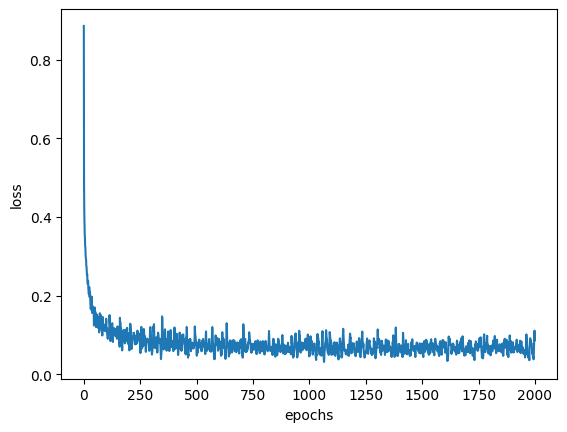

In [ ]:
# Plot the training loss over epochs
plt.plot([i for i in range(len(train_loss_list))], train_loss_list)
plt.xlabel('epochs')
plt.ylabel('loss')

**Evaluating Model Performance**

In [ ]:
# Evaluate Model Performance on Validation Data

# Disable gradient calculations for evaluation using t.no_grad()
with t.no_grad():
    # Prepare the validation data
    X = t.Tensor(X_test).type(t.float32)  # Convert validation features to a PyTorch tensor
    Y = t.Tensor(Y_test).type(t.float32)  # Convert validation labels to a PyTorch tensor

    # Calculate predictions on the validation data
    probs = forward(X)  # Pass validation data through the trained model
    loss = loss_fn(probs.view(-1), Y)  # Compute the loss between predictions and actual labels

    # Print the validation loss
    print(loss.item())

    # Now, evaluate the model on the training data
    X = t.Tensor(X_train).type(t.float32)  # Convert training features to a PyTorch tensor
    Y = t.Tensor(Y_train).type(t.float32)  # Convert training labels to a PyTorch tensor

    # Calculate predictions on the training data
    probs = forward(X)  # Pass training data through the trained model
    loss = loss_fn(probs.view(-1), Y)  # Compute the loss between predictions and actual labels

    # Print the training loss
    print(loss.item())

1.9422909021377563
0.06834594905376434


**Regularized Training for NN**

In [ ]:
import torch as t
import torch.nn as nn
from torch.optim import Adam
from torch.utils.data import TensorDataset, DataLoader
import matplotlib.pyplot as plt

# Regularization
# Deep neural networks are prone to overfitting if there is not much data available during training.

# Define hyperparameters
number_of_input_features = 60
number_of_hidden_units = 40
epochs = 100
learning_rate = 0.01
batch_size = 32
landa = 0.01  # Regularization term (lambda)

# Prepare the data
X_train_tensor = t.Tensor(X_train).type(t.float32)
Y_train_tensor = t.Tensor(Y_train).type(t.float32)

X_test_tensor = t.Tensor(X_test).type(t.float32)
Y_test_tensor = t.Tensor(Y_test).type(t.float32)

train_dataset = TensorDataset(X_train_tensor, Y_train_tensor)
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Define the neural network model with regularization
model = nn.Sequential(
    nn.Linear(number_of_input_features, number_of_hidden_units),  # Linear layer for matrix multiplication and bias addition
    nn.Tanh(),  # Tanh activation function
    nn.Linear(number_of_hidden_units, 1),  # Another linear layer
    nn.Sigmoid()  # Sigmoid activation for probability output
)

# Define the optimizer
optimizer = Adam(model.parameters(), lr=learning_rate)

# Define the loss function with Binary Cross-Entropy Loss
loss_fn = nn.BCELoss()

# Lists to store training accuracy, validation accuracy, and training loss over epochs
train_accuracy_list = []
validation_accuracy_list = []
train_loss_list = []

for epoch in range(epochs):
    if epoch % 500 == 0:
        learning_rate *= 0.9  # Learning rate scheduling

    per_epoch_loss_list = []

    for batch_idx, (X, Y) in enumerate(train_data_loader):
        # Forward pass: Compute predictions
        probs = model(X)

        # Adding regularization term for all parameters in the model
        l2_term = sum([(w ** 2).sum() for w in model.parameters()])

        # New loss is the old loss + regularization term
        loss = loss_fn(probs.view(-1), Y) + landa * l2_term

        per_epoch_loss_list.append(loss.item())

        # Backward pass: Compute gradient and update weights
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Evaluate the model on training and validation data
    with t.no_grad():
        # Set the model in eval mode; some layers use this for certain calculations during training
        model.eval()

        # Calculate accuracy on train data
        probs = model(X_train_tensor)
        prediction = (probs >= 0.5).type(t.LongTensor).view(-1)
        train_accuracy = (prediction == Y_train_tensor).type(t.float32).mean().item()

        # Calculate accuracy on validation data
        probs = model(X_test_tensor)
        prediction = (probs >= 0.5).type(t.LongTensor).view(-1)
        validation_accuracy = (prediction == Y_test_tensor).type(t.float32).mean().item()

        # Print accuracy for the current epoch

        # Set the model back to train mode
        model.train()

        # Append accuracy values to lists
        train_accuracy_list.append(train_accuracy)
        validation_accuracy_list.append(validation_accuracy)

    # Calculate and append the average loss for the epoch
    train_loss_list.append(sum(per_epoch_loss_list) / len(per_epoch_loss_list))

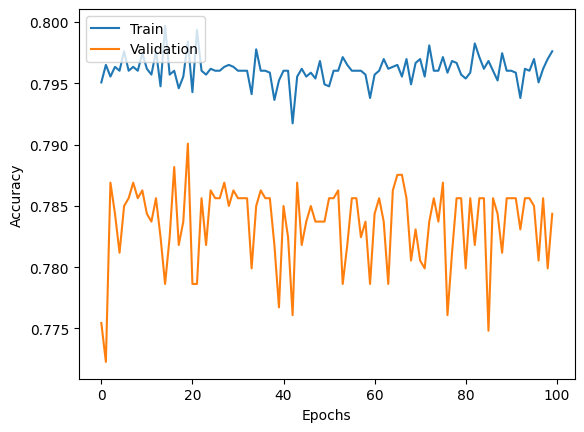

In [ ]:
# Plot training and validation accuracy over epochs
plt.plot([i for i in range(len(train_accuracy_list))], train_accuracy_list, label="Train")
plt.plot([i for i in range(len(validation_accuracy_list))], validation_accuracy_list, label="Validation")
plt.legend(loc="upper left")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

**Dropout**

In [ ]:
number_of_input_features = 60  # Number of input features in the dataset

# Reduced number of hidden units to 5 and just using 1 hidden layer
number_of_hidden_units = 40  # Number of hidden units in the neural network
epochs = 1000  # Number of training epochs
learning_rate = 0.01  # Learning rate for the optimizer
batch_size = 32  # Number of samples in each training batch
dropout_probablity = 0.6  # Probability of dropping out a neuron in dropout layer

# Convert training and testing data to PyTorch tensors
X_train_tensor = t.Tensor(X_train).type(t.float32)
Y_train_tensor = t.Tensor(Y_train).type(t.float32)
X_test_tensor = t.Tensor(X_test).type(t.float32)
Y_test_tensor = t.Tensor(Y_test).type(t.float32)

# Create a training dataset and data loader
train_dataset = TensorDataset(X_train_tensor, Y_train_tensor)
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Define the neural network model
model = Sequential(
    Linear(number_of_input_features, number_of_hidden_units),  # Linear layer for matrix multiplication and bias addition
    Tanh(),  # Add Tanh activation function
    Dropout(dropout_probablity),  # Dropout layer to prevent overfitting
    Linear(number_of_hidden_units, 1),  # Another linear layer
    Sigmoid()  # Sigmoid activation for probability output
)

# Define the optimizer
optimizer = Adam(model.parameters(), lr=learning_rate)

# Define the loss function as Binary Cross-Entropy Loss
loss_fn = t.nn.BCELoss()

train_accuracy_list = []  # List to store training accuracy
validation_accuracy_list = []  # List to store validation accuracy

# Training loop
for epoch in range(epochs):
    if epoch % 500 == 0:
        learning_rate *= 0.9  # Learning rate scheduling

    per_epoch_loss_list = []  # List to store losses for each epoch

    for batch_idx, (X, Y) in enumerate(train_data_loader):
        # Forward pass: Compute predictions
        probs = model(X)

        # Calculate the loss
        loss = loss_fn(probs.view(-1), Y)
        per_epoch_loss_list.append(loss.item())

        # Backward pass: Compute gradients and update weights
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Evaluate the model on training and validation data
    with t.no_grad():
        # Set the model in eval mode; some layers use this for certain calculations during training
        model.eval()

        # Calculate accuracy on train data
        probs = model(X_train_tensor)
        prediction = (probs >= 0.5).type(t.LongTensor).view(-1)
        train_accuracy = (prediction == Y_train_tensor).type(t.float32).mean().item()

        # Calculate accuracy on validation data
        probs = model(X_test_tensor)
        prediction = (probs >= 0.5).type(t.LongTensor).view(-1)
        validation_accuracy = (prediction == Y_test_tensor).type(t.float32).mean().item()


        # Set the model back to train mode
        model.train()

        # Append accuracy values to lists
        train_accuracy_list.append(train_accuracy)
        validation_accuracy_list.append(validation_accuracy)

Text(0, 0.5, 'accuracy')

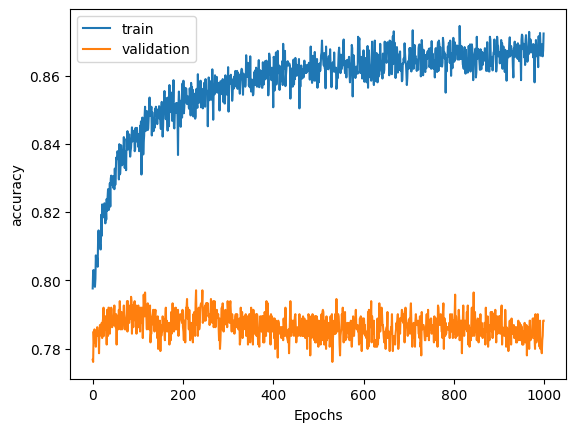

In [ ]:
# Plot training and validation accuracy over epochs
plt.plot([i for i in range(len(train_accuracy_list))], train_accuracy_list, label="train")
plt.plot([i for i in range(len(validation_accuracy_list))], validation_accuracy_list, label="validation")
plt.legend(loc="upper left")
plt.xlabel('Epochs')
plt.ylabel('accuracy')

**Early Stopping**

In [ ]:
# Importing necessary libraries
import torch as t
from torch.utils.data import TensorDataset, DataLoader
from torch.nn import Sequential, Linear, Tanh, Sigmoid
from torch.optim import Adam
from torch.nn import BCELoss
import matplotlib.pyplot as plt

# Defining the parameters
number_of_input_features = 60
number_of_hidden_units = 40
epochs = 1000
learning_rate = 0.01
batch_size = 32

# Loading and preprocessing the data
X_train_tensor = t.Tensor(X_train).type(t.float32)
Y_train_tensor = t.Tensor(Y_train).type(t.float32)

X_test_tensor = t.Tensor(X_test).type(t.float32)
Y_test_tensor = t.Tensor(Y_test).type(t.float32)

train_dataset = TensorDataset(X_train_tensor, Y_train_tensor)
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Creating a neural network model
model = Sequential(
    Linear(number_of_input_features, number_of_hidden_units),
    Tanh(),
    Linear(number_of_hidden_units, 1),
    Sigmoid()
)

# Setting up the optimizer and loss function
optimizer = Adam(model.parameters(), lr=learning_rate)
loss_fn = BCELoss()

# Lists to store accuracy values during training
train_accuracy_list = []
validation_accuracy_list = []

# Main training loop
for epoch in range(epochs):
    # Learning rate scheduling (optional)
    if epoch % 500 == 0:
        learning_rate *= .9

    per_epoch_loss_list = []

    for batch_idx, (X, Y) in enumerate(train_data_loader):
        probs = model(X)

        # new loss is the old loss + regularization term
        loss = loss_fn(probs.view(-1), Y)

        per_epoch_loss_list.append(loss.item())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    with t.no_grad():
        # Calculate accuracy on train data
        model.eval()
        probs = model(X_train_tensor)
        prediction = (probs >= .5).type(t.LongTensor).view(-1)

        train_accuracy = (prediction == Y_train_tensor).type(t.float32).mean().item()

        # Calculate accuracy on validation data
        probs = model(X_test_tensor)
        prediction = (probs > .5).type(t.LongTensor).view(-1)

        validation_accuracy = (prediction == Y_test_tensor).type(t.float32).mean().item()

        model.train()
        train_accuracy_list.append(train_accuracy)
        validation_accuracy_list.append(validation_accuracy)

Text(0, 0.5, 'Accuracy')

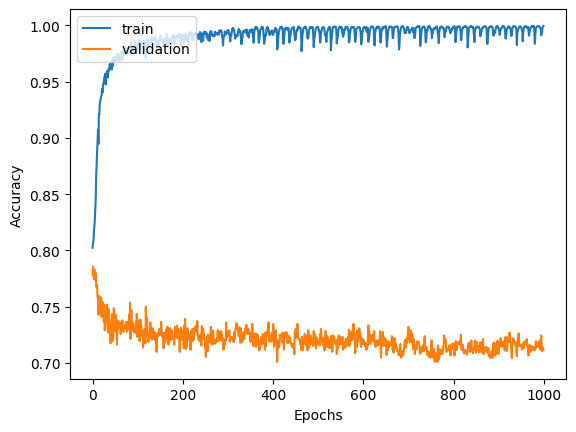

In [ ]:
# Plotting the training and validation accuracy
plt.plot([i for i in range(len(train_accuracy_list))], train_accuracy_list, label="train")
plt.plot([i for i in range(len(validation_accuracy_list))], validation_accuracy_list, label='validation')
plt.legend(loc="upper left")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')